# FluOpti Voronoi + Fluorescence Analysis

## Pipeline map
- Environment setup & helpers (this section)
- Voronoi manual segmentation and export
- Post-Voronoi area analysis
- Fluorescence Voronoi pipeline: registration, colony masks, background subtraction, rate quantification
- Downstream visualizations (CV, heatmaps, radial profiles)

## 1. Imports and plotting setup
Brief: load the scientific stack and project modules.


In [ ]:
# Core + scientific stack
import os
from pathlib import Path
import time

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import pickle as pkl
import scienceplots
import seaborn as sns
import tqdm

from scipy.stats.distributions import t as t_dist
from scipy.stats import norm, fit
from scipy.stats import spearmanr, pearsonr
from scipy.spatial import Voronoi, voronoi_plot_2d
from scipy.interpolate import UnivariateSpline

from numba import prange
import numba as nb
from numbalsoda import lsoda_sig, lsoda

import ipywidgets as w
import imageio
import pyclesperanto_prototype as cle
import cv2

from shapely.geometry import Point, Polygon
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures
from sklearn.pipeline import make_pipeline
from sklearn.metrics import mean_squared_error, r2_score

from skimage.draw import polygon as skpolygon
from skimage.feature import peak_local_max, blob_log
from skimage.morphology import h_maxima, disk, area_closing, area_opening, remove_small_holes
from skimage.measure import label, regionprops
from skimage.segmentation import watershed as sk_watershed, active_contour
from skimage.filters import gaussian

# Project modules
import plotting as flup
import analysis as flua

# Plotting defaults
plt.style.use('science')
%matplotlib widget

def set_size(width, fraction=1, subplots=(1, 1)):
    """
    Set figure dimensions to avoid scaling in LaTeX.
    width: float or 'thesis'|'beamer'
    fraction: portion of width the figure should occupy
    subplots: (rows, cols)
    """
    if width == 'thesis':
        width_pt = 426.79135
    elif width == 'beamer':
        width_pt = 307.28987
    else:
        width_pt = width

    fig_width_pt = width_pt * fraction
    inches_per_pt = 1 / 72.27
    golden_ratio = (5**.5 - 1) / 2
    fig_width_in = fig_width_pt * inches_per_pt
    fig_height_in = fig_width_in * golden_ratio * (subplots[0] / subplots[1])
    return (fig_width_in, fig_height_in)


## 2. Paths and dataset discovery
Purpose: choose platform-specific base dir, ensure outputs exist, and list candidate timelapse pickle files (MAY/OCT 2025).


In [2]:
# Platform-aware base paths
def first_existing(paths):
    for p in paths:
        if p and Path(p).expanduser().exists():
            return Path(p).resolve()
    return Path.cwd()

BASE_DIR = first_existing([
    Path(r'G:/My Drive/Optogenetics_JUN2025/fluopti_fits'),
    Path(r'/Users/adaravena/Library/CloudStorage/GoogleDrive-adaravena94@gmail.com/My Drive/Optogenetics_JUN2025/fluopti_fits'),
    Path.cwd(),
])

os.chdir(BASE_DIR)
print(f'Working directory set to: {BASE_DIR}')

SAVE_PATH_DATA = BASE_DIR / 'voronoi_data_analysis'
SAVE_PATH_FIGURES = SAVE_PATH_DATA / 'figures'
for p in [SAVE_PATH_DATA, SAVE_PATH_FIGURES]:
    p.mkdir(parents=True, exist_ok=True)
print(f'Outputs -> data: {SAVE_PATH_DATA}, figures: {SAVE_PATH_FIGURES}')

DATA_PATH = first_existing([
    BASE_DIR / 'all_data',
    Path(r'/Users/adaravena/Library/CloudStorage/GoogleDrive-adaravena94@gmail.com/My Drive/Optogenetics_JUN2025/fluopti_fits/all_data'),
    Path(r'G:/My Drive/Optogenetics_JUN2025/fluopti_fits/all_data'),
])

files = sorted([
    f.name for f in DATA_PATH.glob('*.pickle')
    if ('MAY2025' in f.name or 'OCT2025' in f.name)
])

print(f'Found {len(files)} pickle files in {DATA_PATH}')
if files:
    preview = files[:8]
    print('Preview:', preview, '...' if len(files) > len(preview) else '')
else:
    print('Warning: no pickle files matching pattern found.')

# Preserve legacy variable names for downstream cells
working_path = str(BASE_DIR)
working_parg = working_path
data_path = str(DATA_PATH)


Working directory set to: /Users/adaravena/Library/CloudStorage/GoogleDrive-adaravena94@gmail.com/My Drive/Optogenetics_JUN2025/fluopti_fits
Outputs -> data: /Users/adaravena/Library/CloudStorage/GoogleDrive-adaravena94@gmail.com/My Drive/Optogenetics_JUN2025/fluopti_fits/voronoi_data_analysis, figures: /Users/adaravena/Library/CloudStorage/GoogleDrive-adaravena94@gmail.com/My Drive/Optogenetics_JUN2025/fluopti_fits/voronoi_data_analysis/figures
Found 23 pickle files in /Users/adaravena/Library/CloudStorage/GoogleDrive-adaravena94@gmail.com/My Drive/Optogenetics_JUN2025/fluopti_fits/all_data
Preview: ['MAY2025_UPDATED_DATA_TL020224.pickle', 'MAY2025_UPDATED_DATA_TL020324.pickle', 'MAY2025_UPDATED_DATA_TL050324.pickle', 'MAY2025_UPDATED_DATA_TL080324.pickle', 'MAY2025_UPDATED_DATA_TL240227.pickle', 'MAY2025_UPDATED_DATA_TL240521.pickle', 'MAY2025_UPDATED_DATA_TL240523.pickle', 'MAY2025_UPDATED_DATA_TL240526.pickle'] ...


## 3. ROI export helper (optional)
Exports per-ROI experimental traces + control schedule to CSV for downstream analysis.


In [3]:
def _iter_rois(rois):
    if isinstance(rois, dict):
        for k, v in rois.items():
            yield k, v
    else:
        for idx, roi in enumerate(rois):
            yield idx, roi

def export_rois_to_csv(rois, dataset, width=1, offset=0, save_path=SAVE_PATH_DATA):
    """
    Collect per-ROI border fluorescence and control schedule, then write a CSV.
    Intended for one-off exports; not auto-run to avoid heavy I/O.
    """
    save_path = Path(save_path)
    save_path.mkdir(parents=True, exist_ok=True)

    data_dict = {}
    for roi_key, roi_obj in _iter_rois(rois):
        tpoints = roi_obj.times['W']
        exp_means, exp_stds = flua.border_signal(roi_obj, wide=width, offset=offset)
        exp_means = np.nan_to_num(exp_means)
        exp_stds = np.nan_to_num(exp_stds)

        t0_tf = np.array([tpoints[0], tpoints[-1]])
        data_tpoints = np.linspace(tpoints[0], tpoints[-1], len(tpoints))
        IA_0 = np.array([exp_means[0]])

        schedule_times = np.array(dataset.control_regime['T'], dtype=np.float64)
        schedule_R = np.array([int(i/100) for i in dataset.control_regime['R']], dtype=np.float64)
        schedule_G = np.array([int(i/100) for i in dataset.control_regime['G']], dtype=np.float64)
        schedule_R_times = np.zeros_like(data_tpoints, dtype=np.float64)
        schedule_G_times = np.zeros_like(data_tpoints, dtype=np.float64)
        for i, t_pt in enumerate(data_tpoints):
            step = np.searchsorted(schedule_times, t_pt, side='right') - 1
            step = np.clip(step, 0, len(schedule_times) - 1)
            schedule_R_times[i] = schedule_R[step]
            schedule_G_times[i] = schedule_G[step]

        data_dict[str(roi_key)] = {
            'roi': int(roi_key),
            'time': tpoints,
            'exp_data_means': exp_means,
            'exp_data_stds': exp_stds,
            't0_tf': t0_tf,
            'data_tpoints': data_tpoints,
            'IA_0': IA_0,
            'schedule_times': schedule_times,
            'schedule_R': schedule_R,
            'schedule_G': schedule_G,
            'schedule_R_COMPLETE': schedule_R_times,
            'schedule_G_COMPLETE': schedule_G_times,
            'firstswitch': np.array([schedule_times[0]] * len(tpoints), dtype=np.float64),
            'secondswitch': np.array([schedule_times[1]] * len(tpoints), dtype=np.float64),
        }

    data_df = pd.DataFrame(data_dict)
    true_name = dataset.name if hasattr(dataset, 'name') else 'dataset'
    out_path = save_path / f'MAY2025_{true_name}_data.csv'
    data_df.to_csv(out_path, index=False)
    print(f'Exported ROI data -> {out_path}')
    return data_df


## 4. Reload helper for exported ROI CSVs
Parses array-like strings back into numpy arrays.


In [4]:
ROW_NAMES = ['roi', 'time', 'exp_data_means', 'exp_data_stds', 't0_tf', 'data_tpoints', 'IA_0', 'schedule_times',
                'schedule_R', 'schedule_G', 'schedule_R_COMPLETE', 'schedule_G_COMPLETE', 'firstswitch',
                'secondswitch']

def parse_array_string(s: str) -> np.ndarray:
    core = str(s).strip()
    if core.startswith('[') and core.endswith(']'):
        core = core[1:-1]
    return np.fromstring(core, sep=' ', dtype=np.float64)

def load_format_data(fpath, row_names=ROW_NAMES):
    data_df = pd.read_csv(fpath, index_col=0)
    if len(row_names) == len(data_df.index):
        data_df.index = row_names
    else:
        for i, name in enumerate(row_names):
            if i < len(data_df.index):
                data_df.rename(index={data_df.index[i]: name}, inplace=True)

    for roi in data_df.columns:
        for idx in data_df.index:
            if idx == 'roi':
                continue
            data_df.at[idx, roi] = parse_array_string(data_df.at[idx, roi])
    return data_df


## 5. Optional: batch-export ROI CSVs
Leave disabled to avoid long runs; enable if you need fresh CSVs for all timelapses.


In [5]:
if False:
    for f in tqdm.tqdm(files):
        filename = os.path.join(data_path, f)
        true_name = f.split('\\')[-1].split('.')[0].split('_')[-1]
        if 'EXP' in true_name:
            true_name = 'GUSTAVO_FINAL_EXPERIMENT'
        voronoi_data = os.listdir(SAVE_PATH_DATA)
        if any(true_name in name for name in voronoi_data):
            print(f"File {true_name} already exported; skipping.")
            continue
        print(f'Loading dataset: {filename} ...')
        fp_dataset = pkl.load(open(filename, 'rb'))
        export_rois_to_csv(fp_dataset.rois, fp_dataset, width=1, offset=0)
        print('Exported.')


## 2. Voronoi Manual Analysis
Interactive workflow: select one timelapse, load the latest brightfield/fluorescence frames, pick colony centres, run Voronoi + colony segmentation, then save the per-ROI table and QC plots.


In [6]:
TIMELAPSE_INFORMATION = {
    'TL020224': '24HRSG_24HRSR_24HRSG',
    'TL020324': '36HRS_RED_100PER_36HRS_GREEN_100PER',
    'TL050324': '24HRS_GREEN_100PER_48HRS_RED_100PER',
    'TL080324': '48HRS_RED_100PER',
    'TL240227': '48HRS_GREEN_100PER',
    'TL240521': '48HRS_GREEN_20PER',
    'TL240523': '48HRS_GREEN_40PER',
    'TL240526': '48HRS_GREEN_60PER',
    'TL240528': '48HRS_GREEN_80PER',
    'TL240530': '48HRS_DARK',
    'TL240601': '48HRS_RED_100PER',
    'TL240607': '48HRS_GREEN_RED_100PER',
    'TL240610': '48HRS_RED_50PER',
    'TL240615': '48HRS_RED_75PER',
    'TL240627': '48HRS_GREEN_100PER',
    'TL240716': '48HRS_RED_10PER_GREEN_100PER',
    'TL240719': '48HRS_RED_10PER_GREEN_50PER',
    'TL240727': '48HRS_RED_10PER_GREEN_25PER',
    'TL240730': '48HRS_RED_50PER_GREEN_50PER',
    'TL240801': '48HRS_RED_20PER_GREEN_50PER',
    'TL240804': '48HRS_RED_30PER_GREEN_50PER',
    'TL240806': '48HRS_RED_40PER_GREEN_50PER',
    'GUSTAVO_FINAL_EXPERIMENT': '96HRS_NO_LIGHT'
}


In [7]:
from pathlib import Path

if not files:
    raise ValueError('No pickle files found; check DATA_PATH.')

run_table = pd.DataFrame({
    'file': files,
    'tl_code': [Path(f).stem.split('_')[-1] for f in files],
})
run_table['tl_code'] = run_table['tl_code'].apply(lambda s: 'GUSTAVO_FINAL_EXPERIMENT' if 'EXP' in str(s) else s)
run_table['condition'] = run_table['tl_code'].map(TIMELAPSE_INFORMATION).fillna('UNKNOWN')

print('Available runs:')
display(run_table)

# Choose the target run (update target_idx as needed)
target_idx = 0
selection = run_table.iloc[target_idx]
target_file = selection['file']
true_name = selection['tl_code']
print(f"Selected run -> {true_name} ({target_file})")


Available runs:


,file,tl_code,condition
0,MAY2025_UPDATED_DATA_TL020224.pickle,TL020224,24HRSG_24HRSR_24HRSG
1,MAY2025_UPDATED_DATA_TL020324.pickle,TL020324,36HRS_RED_100PER_36HRS_GREEN_100PER
2,MAY2025_UPDATED_DATA_TL050324.pickle,TL050324,24HRS_GREEN_100PER_48HRS_RED_100PER
3,MAY2025_UPDATED_DATA_TL080324.pickle,TL080324,48HRS_RED_100PER
4,MAY2025_UPDATED_DATA_TL240227.pickle,TL240227,48HRS_GREEN_100PER
5,MAY2025_UPDATED_DATA_TL240521.pickle,TL240521,48HRS_GREEN_20PER
6,MAY2025_UPDATED_DATA_TL240523.pickle,TL240523,48HRS_GREEN_40PER
7,MAY2025_UPDATED_DATA_TL240526.pickle,TL240526,48HRS_GREEN_60PER
8,MAY2025_UPDATED_DATA_TL240528.pickle,TL240528,48HRS_GREEN_80PER
9,MAY2025_UPDATED_DATA_TL240530.pickle,TL240530,48HRS_DARK


Selected run -> TL020224 (MAY2025_UPDATED_DATA_TL020224.pickle)


In [8]:
filename = Path(data_path) / target_file
print(f'Loading dataset: {filename}')
fp_dataset = pkl.load(open(filename, 'rb'))
rois = fp_dataset.rois
AGAR_SPACE = fp_dataset.agar_space.copy()
print(f'Dataset loaded with {len(rois)} ROIs.')

Loading dataset: /Users/adaravena/Library/CloudStorage/GoogleDrive-adaravena94@gmail.com/My Drive/Optogenetics_JUN2025/fluopti_fits/all_data/MAY2025_UPDATED_DATA_TL020224.pickle
Dataset loaded with 27 ROIs.


In [9]:
RAW_DATA_ROOT = first_existing([
    #BASE_DIR / 'NEW_VORONOI_DATA',
    #BASE_DIR / 'datos crudos',
    Path(r'/Volumes/FLUOPTI_DATA/EXTRACTED_DATOS_NEW_MAY2025/datos crudos'),
    Path(r'/Users/adaravena/Desktop/FONDECYT_Fluopti/datos crudos'),
    Path(r'G:/My Drive/Optogenetics_JUN2025/fluopti_fits/NEW_VORONOI_DATA'),
    BASE_DIR,
])
if not RAW_DATA_ROOT.exists():
    RAW_DATA_ROOT = BASE_DIR
    print('Warning: RAW_DATA_ROOT not found; defaulting to BASE_DIR. Update the candidate list above if needed.')

run_folder = RAW_DATA_ROOT / true_name
if not run_folder.exists():
    alt = list(RAW_DATA_ROOT.glob(f'**/{true_name}'))
    if alt:
        run_folder = alt[0]
    else:
        print(f'Warning: {true_name} folder not found under {RAW_DATA_ROOT}; using root.')
        run_folder = RAW_DATA_ROOT

fpath = str(run_folder)
print(f'Using raw frames from: {fpath}')

working_dirs = [d.name for d in RAW_DATA_ROOT.iterdir() if d.is_dir() and (d.name.startswith('TL') or d.name.startswith('GUSTAVO'))]
print(f'Found {len(working_dirs)} candidate raw folders.')


Using raw frames from: /Users/adaravena/Desktop/FONDECYT_Fluopti/datos crudos/TL020224
Found 52 candidate raw folders.



Path: /Users/adaravena/Desktop/FONDECYT_Fluopti/datos crudos/TL020224

193 files where selected from the 777 files in the folder


Selected files: 
[  0] = ../../../../../../Desktop/FONDECYT_Fluopti/datos crudos/TL020224/B000.png
[  1] = ../../../../../../Desktop/FONDECYT_Fluopti/datos crudos/TL020224/B001.png
[  2] = ../../../../../../Desktop/FONDECYT_Fluopti/datos crudos/TL020224/B002.png
[  3] = ../../../../../../Desktop/FONDECYT_Fluopti/datos crudos/TL020224/B003.png
[  4] = ../../../../../../Desktop/FONDECYT_Fluopti/datos crudos/TL020224/B004.png
[  5] = ../../../../../../Desktop/FONDECYT_Fluopti/datos crudos/TL020224/B005.png
[  6] = ../../../../../../Desktop/FONDECYT_Fluopti/datos crudos/TL020224/B006.png
[  7] = ../../../../../../Desktop/FONDECYT_Fluopti/datos crudos/TL020224/B007.png
[  8] = ../../../../../../Desktop/FONDECYT_Fluopti/datos crudos/TL020224/B008.png
[  9] = ../../../../../../Desktop/FONDECYT_Fluopti/datos crudos/TL020224/B009.png
[ 10] = ../../../../../../Deskt

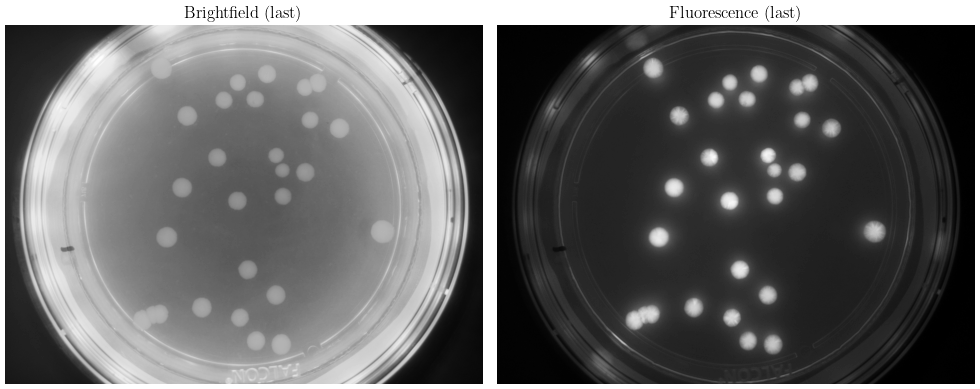

In [10]:
# Grab fluorescence (B*) and brightfield (W*) frames
bfiles, nbfiles = flua.select_files(fpath=fpath, ftype='png', start_key='B')
wfiles, nwfiles = flua.select_files(fpath=fpath, ftype='png', start_key='W')

bfiles = sorted(bfiles)
wfiles = sorted(wfiles)
last_bfile = bfiles[-1]
last_wfile = wfiles[-1]

fluo_img = cv2.imread(last_bfile, cv2.IMREAD_GRAYSCALE)
bf_img   = cv2.imread(last_wfile, cv2.IMREAD_GRAYSCALE)

plt.figure(figsize=(10,4))
plt.subplot(1,2,1); plt.imshow(bf_img, cmap='gray'); plt.title('Brightfield (last)'); plt.axis('off')
plt.subplot(1,2,2); plt.imshow(fluo_img, cmap='gray'); plt.title('Fluorescence (last)'); plt.axis('off')
plt.tight_layout(); plt.show()


In [11]:
fp_dataset.agar_space

{'center': array([1233, 1609], dtype=int32), 'radius': 1177}

In [12]:
cols_area = fp_dataset.agar_space.copy()
cols_area['radius'] = cols_area['radius'] + 50
cols_area['center'] = [cols_area['center'][0], cols_area['center'][1] + 25]

In [13]:
def preprocess_image(fluo_img, cols_area, x_rad=75, y_rad=75, device_type='GPU'):
    agar_mask = flua.get_circle_data(
        fluo_img, cols_area['center'], cols_area['radius'],
        mode='>=',    # outside plate
        boolean=True
    )

    cle.select_device(dev_type=device_type)

    top_hat   = cle.top_hat_sphere(fluo_img, radius_x=x_rad, radius_y=y_rad)
    top_hat   = np.asarray(top_hat, dtype=np.float32)

    interior  = np.logical_not(agar_mask) * fluo_img
    top_hat_in = cle.top_hat_sphere(interior, radius_x=x_rad, radius_y=y_rad)
    top_hat_in = np.asarray(top_hat_in, dtype=np.float32)

    def norm8(im):
        m = im.max()
        return (im / m * 255).astype(np.uint8) if m else im.astype(np.uint8)

    return norm8(top_hat), norm8(top_hat_in), agar_mask

processed_img, processed_img_interior, agar_mask = preprocess_image(fluo_img, cols_area, device_type='CPU')


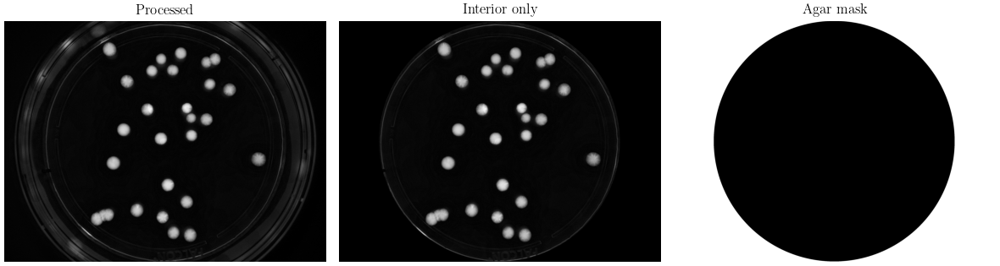

In [14]:
plt.figure(figsize=(12,4))
plt.subplot(1,3,1); plt.imshow(processed_img, cmap='gray'); plt.title('Processed'); plt.axis('off')
plt.subplot(1,3,2); plt.imshow(processed_img_interior, cmap='gray'); plt.title('Interior only'); plt.axis('off')
plt.subplot(1,3,3); plt.imshow(agar_mask, cmap='gray'); plt.title('Agar mask'); plt.axis('off')
plt.tight_layout(); plt.show()


In [26]:
def launch_centroid_editor(img, initial_centres=None, pick_tol=10):
    global centres, selected_idx
    if initial_centres is None or len(initial_centres) == 0:
        centres = np.empty((0, 2), float)
    else:
        centres = np.asarray(initial_centres, float).reshape(-1, 2)
    selected_idx = None

    fig, ax = plt.subplots(figsize=(5, 5), dpi=250)
    ax.imshow(img, cmap='gray')
    scat = ax.scatter(centres[:, 0], centres[:, 1], c='fuchsia', s=25, marker='x')
    ax.axis('off')

    mode_widget = w.ToggleButtons(options=['Add', 'Move', 'Delete'], value='Add', description='Mode:')
    status = w.Label(value='')
    display(w.HBox([mode_widget, status]))

    def on_click(event):
        global centres, selected_idx
        if event.inaxes is not ax or event.xdata is None:
            return
        y, x = event.ydata, event.xdata
        if mode_widget.value == 'Add':
            centres = np.append(centres, [[x, y]], axis=0)
            status.value = f'Added centre #{len(centres)}'
        elif mode_widget.value == 'Move':
            if centres.size == 0:
                status.value = 'No ROIs yet'; return
            if selected_idx is None:
                d = np.hypot(centres[:, 0] - x, centres[:, 1] - y)
                if d.min() < pick_tol:
                    selected_idx = d.argmin()
                    status.value = f'Selected #{selected_idx+1}; click new position'
                else:
                    status.value = 'No ROI within tolerance'
            else:
                centres[selected_idx] = (x, y)
                status.value = f'Moved ROI #{selected_idx+1}'
                selected_idx = None
        elif mode_widget.value == 'Delete':
            if centres.size == 0:
                status.value = 'No ROIs yet'; return
            d = np.hypot(centres[:, 0] - x, centres[:, 1] - y)
            if d.min() < pick_tol:
                del_idx = d.argmin()
                centres = np.delete(centres, del_idx, axis=0)
                status.value = f'Deleted ROI #{del_idx+1}'
                selected_idx = None
            else:
                status.value = 'No ROI within tolerance'
        scat.set_offsets(centres)
        fig.canvas.draw_idle()

    fig.canvas.mpl_connect('button_press_event', on_click)
    globals()['centres'] = centres
    plt.show()


In [ ]:
centres = np.empty((0, 2), float)
selected_idx = None
launch_centroid_editor(processed_img_interior, initial_centres=centres, pick_tol=15)


In [27]:
def voronoi_finite_polygons_2d(vor, radius=None, skip_degenerate=True):
    if vor.points.shape[1] != 2:
        raise ValueError('Requires 2-D input')

    new_regions, new_vertices = [], vor.vertices.tolist()
    center = vor.points.mean(axis=0)
    if radius is None:
        radius = vor.points.ptp().max() * 2

    all_ridges = {}
    for (p1, p2), (v1, v2) in zip(vor.ridge_points, vor.ridge_vertices):
        all_ridges.setdefault(p1, []).append((p2, v1, v2))
        all_ridges.setdefault(p2, []).append((p1, v1, v2))

    for p1, region_idx in enumerate(vor.point_region):
        region = vor.regions[region_idx]
        if len(region) == 0:
            if skip_degenerate:
                continue
            raise ValueError(f'Region for point {p1} is empty')

        if all(v >= 0 for v in region):
            new_regions.append(region); continue

        ridges = all_ridges.get(p1)
        if ridges is None:
            if skip_degenerate:
                continue
            raise KeyError(f'No ridges recorded for point index {p1}.')

        new_region = [v for v in region if v >= 0]
        for p2, v1, v2 in ridges:
            if v2 < 0:
                v1, v2 = v2, v1
            if v1 >= 0:
                continue
            tangent = vor.points[p2] - vor.points[p1]
            tangent /= np.linalg.norm(tangent)
            normal  = np.array([-tangent[1], tangent[0]])
            midpoint  = vor.points[[p1, p2]].mean(axis=0)
            direction = np.sign(np.dot(midpoint - center, normal)) * normal
            far_point = vor.vertices[v2] + direction * radius
            new_region.append(len(new_vertices))
            new_vertices.append(far_point.tolist())
        vs = np.asarray([new_vertices[v] for v in new_region])
        angles = np.arctan2(vs[:, 1] - vs[:, 1].mean(), vs[:, 0] - vs[:, 0].mean())
        new_regions.append(np.array(new_region)[np.argsort(angles)].tolist())

    return new_regions, np.asarray(new_vertices)


In [ ]:
output_vor = w.Output()
button_vor = w.Button(description='Compute Voronoi + colonies', button_style='success')

from shapely.geometry import Point, Polygon
from skimage.draw import polygon as sk_polygon_draw, disk as sk_disk
from skimage.filters import threshold_otsu
from skimage import morphology, segmentation
from scipy import ndimage as ndi

def handle_vor_click(_, pixel_mm=0.036, save_csv=True, csv_path=None):
    with output_vor:
        output_vor.clear_output()
        if 'centres' not in globals() or centres.size == 0:
            print('No centroids defined yet.'); return

        csv_path = Path(csv_path) if csv_path else (SAVE_PATH_DATA / f"{true_name}_corrected_voronoi_data.csv")

        pts = np.column_stack([centres[:,0], centres[:,1]])
        vor = Voronoi(pts)
        regions, vertices = voronoi_finite_polygons_2d(vor)

        plate_cx, plate_cy = cols_area['center'][1], cols_area['center'][0]
        plate_r            = cols_area['radius']
        inner_plate = Point(plate_cx, plate_cy).buffer(plate_r, resolution=256)

        img = processed_img_interior
        in_plate_mask = np.zeros_like(img, bool)
        rrp, ccp = sk_disk((int(plate_cy), int(plate_cx)), int(plate_r), shape=img.shape)
        in_plate_mask[rrp, ccp] = True
        gth = threshold_otsu(img[in_plate_mask])
        global_bin = in_plate_mask & (img >= gth)
        global_bin = morphology.binary_closing(global_bin, morphology.disk(3))
        global_bin = morphology.remove_small_objects(global_bin, 200)
        global_bin = ndi.binary_fill_holes(global_bin)
        dist = ndi.distance_transform_edt(global_bin)
        markers = np.zeros_like(global_bin, np.int32)
        for i, (x, y) in enumerate(centres, start=1):
            rrs, ccs = sk_disk((int(y), int(x)), 3, shape=markers.shape)
            markers[rrs, ccs] = i
        ws_labels = segmentation.watershed(-dist, markers, mask=global_bin)

        pixel_um = pixel_mm * 1000
        records, polys_for_plot, colony_masks = [], [], []
        min_area_px, max_area_px = 250, 50_000

        for idx, reg in enumerate(regions, start=1):
            poly_pts  = vertices[reg]
            poly      = Polygon(np.vstack([poly_pts, poly_pts[0]]))
            clipped = poly.intersection(inner_plate)
            if clipped.is_empty:
                continue
            sub_polys = [clipped] if clipped.geom_type == 'Polygon' else list(clipped.geoms)
            for sub in sub_polys:
                verts = np.asarray(sub.exterior.coords)[:-1]
                polys_for_plot.append(verts)
                rr, cc = sk_polygon_draw(verts[:,1], verts[:,0], processed_img_interior.shape)
                region_mask = np.zeros(processed_img_interior.shape, bool)
                region_mask[rr, cc] = True
                region_mask &= ~agar_mask
                colony = (ws_labels == idx) & region_mask
                colony = morphology.binary_closing(colony, morphology.disk(2))
                colony = morphology.remove_small_objects(colony, 150)
                colony_area_px = int(colony.sum())
                if not (min_area_px <= colony_area_px <= max_area_px):
                    colony[:] = False
                    colony_area_px = 0
                colony_masks.append(colony)
                y_cent, x_cent = centres[idx-1]
                records.append({
                    'ROI': idx,
                    'Centroid_row': y_cent,
                    'Centroid_col': x_cent,
                    'Voronoi_WKT': sub.wkt,
                    'Voronoi_area_px': int(region_mask.sum()),
                    'Colony_area_px': colony_area_px,
                    'Colony_area_um2': round(colony_area_px * pixel_um**2, 2)
                })

        df = pd.DataFrame.from_records(records)
        globals()['voronoi_df'] = df
        if save_csv:
            df.to_csv(csv_path, index=False)
            print(f'Saved Voronoi table -> {csv_path}')
        display(df.head())

        fig, ax = plt.subplots(figsize=(7, 7))
        ax.imshow(processed_img_interior, cmap='gray')
        for verts in polys_for_plot:
            ax.fill(verts[:,0], verts[:,1], alpha=0.25)
        for mask in colony_masks:
            ys, xs = np.where(mask)
            ax.scatter(xs, ys, s=1, c='red', alpha=0.6)
        ax.scatter(centres[:,0], centres[:,1], c='fuchsia', s=25, marker='*')
        ax.set_title('Voronoi + colony segmentation')
        ax.set_xlim(0, processed_img_interior.shape[1])
        ax.set_ylim(processed_img_interior.shape[0], 0)
        ax.set_aspect('equal')
        ax.axis('off')
        plt.show()

button_vor.on_click(handle_vor_click)
display(button_vor, output_vor)


### Segmentation results


In [15]:
if 'voronoi_df' in globals():
    voronoi_df['Fluo_image'] = last_bfile
    display(voronoi_df.head())
    csv_out = SAVE_PATH_DATA / f"{true_name}_corrected_voronoi_data.csv"
    if not csv_out.exists():
        voronoi_df.to_csv(csv_out, index=False)
        print(f'Saved Voronoi table -> {csv_out}')


In [16]:
if 'voronoi_df' in globals():
    fig_base = Path(SAVE_PATH_FIGURES) / f"{true_name}_voronoi_vs_colony_area"
    plt.figure()
    sns.scatterplot(data=voronoi_df, x='Voronoi_area_px', y='Colony_area_px', hue='ROI', palette='viridis', s=10)
    plt.title('Voronoi Area vs Colony Area')
    plt.xlabel('Voronoi Area (px)'); plt.ylabel('Colony Area (px)')
    plt.legend(title='ROI', bbox_to_anchor=(1.05, 1), loc='upper left'); plt.tight_layout()
    plt.savefig(f"{fig_base}.png", dpi=300); plt.savefig(f"{fig_base}.pdf", dpi=300)
    plt.show()


In [17]:
if 'voronoi_df' in globals():
    voronoi_df['Voronoi_area_log10'] = np.log10(voronoi_df['Voronoi_area_px'])
    voronoi_df['Colony_area_log10'] = np.log10(voronoi_df['Colony_area_px'])
    fig_base = Path(SAVE_PATH_FIGURES) / f"{true_name}_log10_voronoi_vs_colony_area"
    plt.figure()
    sns.scatterplot(data=voronoi_df, x='Voronoi_area_log10', y='Colony_area_log10', hue='ROI', palette='viridis', s=10)
    plt.title('Log10 Voronoi Area vs Log10 Colony Area')
    plt.xlabel('Log10 Voronoi Area (px)'); plt.ylabel('Log10 Colony Area (px)')
    plt.legend(title='ROI', bbox_to_anchor=(1.05, 1), loc='upper left'); plt.tight_layout()
    plt.savefig(f"{fig_base}.png", dpi=300); plt.savefig(f"{fig_base}.pdf", dpi=300)
    plt.show()


In [18]:
csv_files = [f for f in os.listdir(SAVE_PATH_DATA) if f.endswith('_corrected_voronoi_data.csv')]
print(f'Found {len(csv_files)} Voronoi CSVs in {SAVE_PATH_DATA}')

Found 23 Voronoi CSVs in /Users/adaravena/Library/CloudStorage/GoogleDrive-adaravena94@gmail.com/My Drive/Optogenetics_JUN2025/fluopti_fits/voronoi_data_analysis


## Post-voronoi QC (overlays + regressions)
Loads all *_corrected_voronoi_data.csv files, recreates overlays on raw fluorescence frames, and fits Voronoi vs colony area (linear + log-log). Outputs live in SAVE_PATH_DATA/post_voronoi_analysis.


In [19]:
import re, glob
from pathlib import Path
from skimage.util import invert as invert_image
from skimage.io import imread
from sklearn.linear_model import LinearRegression
from scipy.stats import pearsonr

POST_OUT_ROOT = SAVE_PATH_DATA / 'post_voronoi_analysis'
POST_OUT_ROOT.mkdir(exist_ok=True)

RAW_IMAGE_ROOT = first_existing([
    #BASE_DIR / 'NEW_VORONOI_DATA',
    #BASE_DIR / 'datos crudos',
    Path(r'/Volumes/FLUOPTI_DATA/EXTRACTED_DATOS_NEW_MAY2025/datos crudos'),
    Path(r'/Users/adaravena/Desktop/FONDECYT_Fluopti/datos crudos'),
    Path(r'G:/My Drive/Optogenetics_JUN2025/fluopti_fits/NEW_VORONOI_DATA'),
    BASE_DIR,
])


def locate_raw_image(fluo_path: str, tl_code: str) -> Path | None:
    fname = Path(fluo_path).name
    candidates = [
        Path(fluo_path),
        RAW_IMAGE_ROOT / tl_code / fname,
        BASE_DIR / tl_code / fname,
        BASE_DIR / fname,
    ]
    for cand in candidates:
        if cand.exists():
            return cand
    return None


def linreg_and_corr(x, y, log=False):
    x, y = np.asarray(x, float), np.asarray(y, float)
    if log:
        x, y = np.log10(x), np.log10(y)
    X = x.reshape(-1, 1)
    model = LinearRegression().fit(X, y)
    yhat = model.predict(X)
    r2 = model.score(X, y)
    r, p = pearsonr(x, y)
    return dict(log=log, slope=model.coef_[0], intercept=model.intercept_, r2=r2, r=r, p=p), yhat


def save_overlay(img, df, title, out_png, invert_bg=False):
    from shapely.geometry import Polygon
    bg = invert_image(img) if invert_bg else img
    fig, ax = plt.subplots(figsize=(6, 6))
    ax.imshow(bg, cmap='gray')
    for poly_wkt in df['Voronoi_WKT']:
        poly = wkt.loads(poly_wkt)
        xs, ys = poly.exterior.xy
        ax.fill(xs, ys, alpha=0.25)
    ax.scatter(df['Centroid_row'], df['Centroid_col'], c='white', s=10, marker='*')
    ax.set_title(title)
    ax.set_xlim(0, bg.shape[1]); ax.set_ylim(bg.shape[0], 0); ax.axis('off')
    plt.tight_layout()
    fig.savefig(out_png, dpi=300)
    fig.savefig(Path(out_png).with_suffix('.pdf'))
    plt.close(fig)

    fig, ax = plt.subplots(figsize=(6, 6))
    ax.imshow(bg, cmap='gray')
    for poly_wkt in df['Voronoi_WKT']:
        poly = wkt.loads(poly_wkt)
        xs, ys = poly.exterior.xy
        ax.fill(xs, ys, alpha=0.25)
    ax.scatter(df['Centroid_row'], df['Centroid_col'], c='white', s=10, marker='*')
    ax.text(0.98, 0.02, f"N = {len(df)}", transform=ax.transAxes,
            ha='right', va='bottom', fontsize=9, color='white',
            bbox=dict(boxstyle='round,pad=0.2', fc='black', alpha=0.6))
    ax.set_title(title)
    ax.set_xlim(0, bg.shape[1]); ax.set_ylim(bg.shape[0], 0); ax.axis('off')
    plt.tight_layout()
    fig.savefig(Path(out_png).with_name(Path(out_png).stem + '_count.png'), dpi=300)
    plt.close(fig)


def plot_scatter_with_fit(x, y, yhat, title, xlabel, ylabel, out_png, log=False):
    fig, ax = plt.subplots(figsize=(5, 4))
    if log:
        ax.scatter(np.log10(x), np.log10(y), alpha=0.6)
        ax.plot(np.log10(x), yhat, color='r')
    else:
        ax.scatter(x, y, alpha=0.6)
        ax.plot(x, yhat, color='r')
    ax.set_xlabel(xlabel); ax.set_ylabel(ylabel); ax.set_title(title); ax.grid(True)
    plt.tight_layout()
    fig.savefig(out_png, dpi=300)
    fig.savefig(Path(out_png).with_suffix('.pdf'))
    plt.close(fig)


In [ ]:
csv_files = list(Path(SAVE_PATH_DATA).rglob('*_corrected_voronoi_data.csv'))
if not csv_files:
    print(f'No *_corrected_voronoi_data.csv files found under {SAVE_PATH_DATA}')

plates_data = []

for csv_path in csv_files:
    csv_path = Path(csv_path)
    df = pd.read_csv(csv_path)
    m = re.search(r'(TL\d{6}|GUSTAVO_FINAL_EXPERIMENT)', csv_path.stem)
    tl_code = m.group(1) if m else csv_path.stem.split('_')[0]
    label = TIMELAPSE_INFORMATION.get(tl_code, tl_code)

    out_dir = POST_OUT_ROOT / f"{tl_code}_{label}"
    out_dir.mkdir(parents=True, exist_ok=True)

    img_path = locate_raw_image(df.get('Fluo_image', [''])[0], tl_code)
    if img_path is None:
        print(f'[WARN] Image not found for {tl_code}; skipping overlays.'); continue

    img = imread(img_path)
    plt.imsave(out_dir / '0_raw.png', img, cmap='gray')
    plt.imsave(out_dir / '0_raw_inverted.png', invert_image(img), cmap='gray')

    save_overlay(img, df, f"{label}", out_dir / '1_voronoi_overlay.png')
    save_overlay(img, df, f"{label} (inverted bg)", out_dir / '1b_voronoi_overlay_inverted.png', invert_bg=True)

    v_area = df['Voronoi_area_px'].values.astype(float)
    c_area = df['Colony_area_px'].values.astype(float)
    res_lin, yhat_lin = linreg_and_corr(v_area, c_area, log=False)
    res_log, yhat_log = linreg_and_corr(v_area, c_area, log=True)

    plot_scatter_with_fit(
        v_area, c_area, yhat_lin,
        f"{label}\nlinear (R2={res_lin['r2']:.2f}, r={res_lin['r']:.2f})",
        'Voronoi area (px)', 'Colony area (px)',
        out_dir / '2_area_vs_area_linear.png', log=False)

    plot_scatter_with_fit(
        v_area, c_area, yhat_log,
        f"{label}\nlog-log (R2={res_log['r2']:.2f}, r={res_log['r']:.2f})",
        'log10 Voronoi area', 'log10 Colony area',
        out_dir / '3_area_vs_area_loglog.png', log=True)

    pd.DataFrame([res_lin, res_log]).to_csv(out_dir / '4_regression_summary.csv', index=False)
    plates_data.append((tl_code, label, df))

print(f'Processed {len(plates_data)} plates; outputs in {POST_OUT_ROOT}')


# 3. Fluorescence Voronoi Analysis

- Choose a timelapse, reload Voronoi CSVs, and sanity-check metadata.
- Register fluorescence/brightfield frames once (phase correlation) before any quantification.
- Build per-ROI masks, subtract background, and extract band/radial fluorescence metrics.
- Export long-form tables, then visualize rates, kymographs, CV, and radial profiles.

### 3.1 Dataset selection and Voronoi reload
Quick sanity checks on available timelapses/CSVs before running segmentation and fluorescence quantification.

In [32]:
# First thing we have to do before starting is to reset all created figures to release them from memory
plt.close('all')  # Close all figures

In [20]:
true_names = [f.split('/')[-1].split('.')[0].split("_")[-1] for f in files]
for name in true_names:
    print(name)

TL020224
TL020324
TL050324
TL080324
TL240227
TL240521
TL240523
TL240526
TL240528
TL240530
TL240601
TL240607
TL240610
TL240615
TL240627
TL240716
TL240719
TL240727
TL240730
TL240801
TL240804
TL240806
EXPERIMENT


In [21]:
TIMELAPSE_INFORMATION = {
    'TL020224': '24HRSG_24HRSR_24HRSG',
    'TL020324': '36HRS_RED_100PER_36HRS_GREEN_100PER',
    'TL050324': '24HRS_GREEN_100PER_48HRS_RED_100PER',
    'TL080324': '48HRS_RED_100PER',
    'TL240227': '48HRS_GREEN_100PER',
    'TL240521': '48HRS_GREEN_20PER',
    'TL240523': '48HRS_GREEN_40PER',
    'TL240526': '48HRS_GREEN_60PER',
    'TL240528': '48HRS_GREEN_80PER',
    'TL240530': '48HRS_DARK',
    'TL240601': '48HRS_RED_100PER',
    'TL240607': '48HRS_GREEN_RED_100PER',
    'TL240610': '48HRS_RED_50PER',
    'TL240615': '48HRS_RED_75PER',
    'TL240627': '48HRS_GREEN_100PER',
    'TL240716': '48HRS_RED_10PER_GREEN_100PER',
    'TL240719': '48HRS_RED_10PER_GREEN_50PER',
    'TL240727': '48HRS_RED_10PER_GREEN_25PER',
    'TL240730': '48HRS_RED_50PER_GREEN_50PER',
    'TL240801': '48HRS_RED_20PER_GREEN_50PER',
    'TL240804': '48HRS_RED_30PER_GREEN_50PER',
    'TL240806': '48HRS_RED_40PER_GREEN_50PER',
    'EXPERIMENT': '48HRS_GUSTAVO_100PER_TEST'
 }

In [22]:
# Check which names are missing from the TIMELAPSE_INFORMATION dictionary
missing_names = [name for name in true_names if name not in TIMELAPSE_INFORMATION]
if missing_names:
    print("The following names are missing from the TIMELAPSE_INFORMATION dictionary:")
    for name in missing_names:
        print(name)

In [23]:
for (i, file), j in zip(enumerate(files), true_names):
    print("LIST NUMBER: ", i, " FILENAME: ", file, " ------------- INFORMATION: ", TIMELAPSE_INFORMATION[j])

LIST NUMBER:  0  FILENAME:  MAY2025_UPDATED_DATA_TL020224.pickle  ------------- INFORMATION:  24HRSG_24HRSR_24HRSG
LIST NUMBER:  1  FILENAME:  MAY2025_UPDATED_DATA_TL020324.pickle  ------------- INFORMATION:  36HRS_RED_100PER_36HRS_GREEN_100PER
LIST NUMBER:  2  FILENAME:  MAY2025_UPDATED_DATA_TL050324.pickle  ------------- INFORMATION:  24HRS_GREEN_100PER_48HRS_RED_100PER
LIST NUMBER:  3  FILENAME:  MAY2025_UPDATED_DATA_TL080324.pickle  ------------- INFORMATION:  48HRS_RED_100PER
LIST NUMBER:  4  FILENAME:  MAY2025_UPDATED_DATA_TL240227.pickle  ------------- INFORMATION:  48HRS_GREEN_100PER
LIST NUMBER:  5  FILENAME:  MAY2025_UPDATED_DATA_TL240521.pickle  ------------- INFORMATION:  48HRS_GREEN_20PER
LIST NUMBER:  6  FILENAME:  MAY2025_UPDATED_DATA_TL240523.pickle  ------------- INFORMATION:  48HRS_GREEN_40PER
LIST NUMBER:  7  FILENAME:  MAY2025_UPDATED_DATA_TL240526.pickle  ------------- INFORMATION:  48HRS_GREEN_60PER
LIST NUMBER:  8  FILENAME:  MAY2025_UPDATED_DATA_TL240528.pickle 

In [24]:
# Select dataset for fluorescence pipeline
fluo_target_idx = 0  # change as needed
f = files[fluo_target_idx]
filename = os.path.join(data_path, f)
true_name = Path(f).stem.split('_')[-1]

results_name = true_name + '_regression_results.csv'
if results_name in os.listdir(SAVE_PATH_DATA):
    print(f"File {results_name} already exists in the voronoi_data_analysis folder. Skipping ...")

print(f'Loading dataset: {filename} ...')
fp_dataset = pkl.load(open(filename, 'rb'))
rois = fp_dataset.rois
print(f"Dataset loaded successfully with {len(rois)} ROIs.")
AGAR_SPACE = fp_dataset.agar_space


File TL020224_regression_results.csv already exists in the voronoi_data_analysis folder. Skipping ...
Loading dataset: /Users/adaravena/Library/CloudStorage/GoogleDrive-adaravena94@gmail.com/My Drive/Optogenetics_JUN2025/fluopti_fits/all_data/MAY2025_UPDATED_DATA_TL020224.pickle ...
Dataset loaded successfully with 27 ROIs.


In [25]:
working_path = str(RAW_IMAGE_ROOT)
working_path = os.path.abspath(working_path)
os.chdir(working_path)

working_dirs = [i + '/' for i in os.listdir() if (i.startswith('TL') or i.startswith('GUSTAVO')) and 'ens' not in i]


In [26]:
folder_name = f"{true_name}/"
if folder_name not in working_dirs:
    print(f"Warning: {folder_name} not found in {working_path}; available: {working_dirs}")
    working_directory = working_dirs[0] if working_dirs else ''
else:
    working_directory = folder_name
print(f"Working directory: {working_directory}")
dfolder = working_directory
print(f"Current experiment folder: {dfolder}")
fpath = os.path.join(working_path, dfolder)
print(f"Current experiment files path: {fpath}")


Working directory: TL020224/
Current experiment folder: TL020224/
Current experiment files path: /Users/adaravena/Desktop/FONDECYT_Fluopti/datos crudos/TL020224/



Path: /Users/adaravena/Desktop/FONDECYT_Fluopti/datos crudos/TL020224/

193 files where selected from the 777 files in the folder


Selected files: 
[  0] = TL020224/B000.png
[  1] = TL020224/B001.png
[  2] = TL020224/B002.png
[  3] = TL020224/B003.png
[  4] = TL020224/B004.png
[  5] = TL020224/B005.png
[  6] = TL020224/B006.png
[  7] = TL020224/B007.png
[  8] = TL020224/B008.png
[  9] = TL020224/B009.png
[ 10] = TL020224/B010.png
[ 11] = TL020224/B011.png
[ 12] = TL020224/B012.png
[ 13] = TL020224/B013.png
[ 14] = TL020224/B014.png
[ 15] = TL020224/B015.png
[ 16] = TL020224/B016.png
[ 17] = TL020224/B017.png
[ 18] = TL020224/B018.png
[ 19] = TL020224/B019.png
[ 20] = TL020224/B020.png
[ 21] = TL020224/B021.png
[ 22] = TL020224/B022.png
[ 23] = TL020224/B023.png
[ 24] = TL020224/B024.png
[ 25] = TL020224/B025.png
[ 26] = TL020224/B026.png
[ 27] = TL020224/B027.png
[ 28] = TL020224/B028.png
[ 29] = TL020224/B029.png
[ 30] = TL020224/B030.png
[ 31] = TL020224/B031.png
[ 32] = TL020224/B

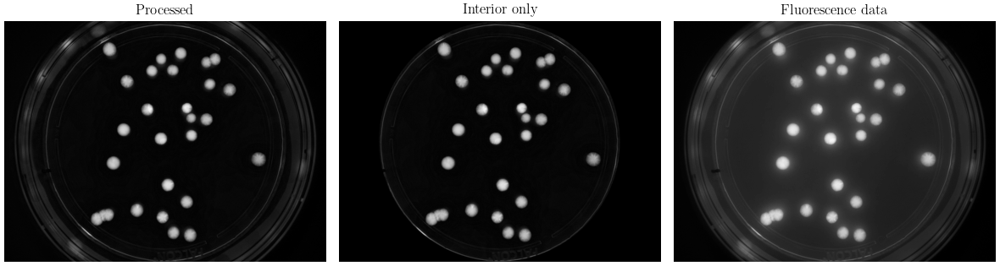

In [27]:
# ## Adding the fluorescence data to the dataset
# use name_key to filter the filenames accord a defined character or substring
bfiles, nbfiles = flua.select_files(
    fpath=fpath, ftype="png", start_key="B"
)  # , name_key = '')

# Also load the brightfield files if needed
wfiles, nwfiles = flua.select_files(
    fpath=fpath, ftype="png", start_key="W"
)  # , name_key = '')

# load the data and add it to each ROI
bfiles = [bfiles[i] for i in range(nbfiles)]
print(f"Number of fluorescence files found: {nbfiles}")
wfiles = [wfiles[i] for i in range(nwfiles)]
print(f"Number of brightfield files found: {nwfiles}")

# Load the last fluorescence data file
last_bfile = bfiles[-1]
last_wfile = wfiles[-1]
# Load the fluorescence data
fluo_img = cv2.imread(last_bfile, cv2.IMREAD_GRAYSCALE)
# Show the fluorescence data
plt.imshow(fluo_img, cmap='gray')
plt.title('Fluorescence data')
plt.axis('off')
plt.show()

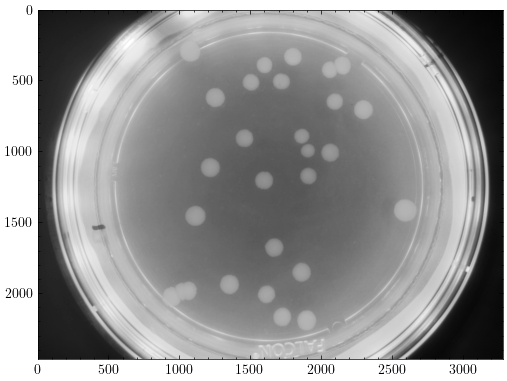

In [28]:
# Show the brightfield data
plt.figure(figsize=(6,6))
bf_img = cv2.imread(last_wfile, cv2.IMREAD_GRAYSCALE)
plt.imshow(bf_img, cmap='gray')
plt.show()

In [29]:
csv_files = [f for f in os.listdir(SAVE_PATH_DATA) if f.endswith('_corrected_voronoi_data.csv')]


In [30]:
for (i, csv_file), j in zip(enumerate(csv_files), true_names):
    try:
        print(f"CSV FILE NUMBER: {i}  FILENAME: {csv_file}, INFORMATION: {TIMELAPSE_INFORMATION[csv_file.split('_')[0]]}")
    except KeyError:
        print(f"CSV FILE NUMBER: {i}  FILENAME: {csv_file}, INFORMATION: NOT FOUND IN TIMELAPSE_INFORMATION DICTIONARY")

CSV FILE NUMBER: 0  FILENAME: TL020224_corrected_voronoi_data.csv, INFORMATION: 24HRSG_24HRSR_24HRSG
CSV FILE NUMBER: 1  FILENAME: TL240607_corrected_voronoi_data.csv, INFORMATION: 48HRS_GREEN_RED_100PER
CSV FILE NUMBER: 2  FILENAME: TL240523_corrected_voronoi_data.csv, INFORMATION: 48HRS_GREEN_40PER
CSV FILE NUMBER: 3  FILENAME: TL240227_corrected_voronoi_data.csv, INFORMATION: 48HRS_GREEN_100PER
CSV FILE NUMBER: 4  FILENAME: TL240730_corrected_voronoi_data.csv, INFORMATION: 48HRS_RED_50PER_GREEN_50PER
CSV FILE NUMBER: 5  FILENAME: TL240528_corrected_voronoi_data.csv, INFORMATION: 48HRS_GREEN_80PER
CSV FILE NUMBER: 6  FILENAME: TL240727_corrected_voronoi_data.csv, INFORMATION: 48HRS_RED_10PER_GREEN_25PER
CSV FILE NUMBER: 7  FILENAME: TL240601_corrected_voronoi_data.csv, INFORMATION: 48HRS_RED_100PER
CSV FILE NUMBER: 8  FILENAME: TL240801_corrected_voronoi_data.csv, INFORMATION: 48HRS_RED_20PER_GREEN_50PER
CSV FILE NUMBER: 9  FILENAME: GUSTAVO_FINAL_EXPERIMENT_corrected_voronoi_data.cs

In [31]:
SAVE_PATH_DATA

PosixPath('/Users/adaravena/Library/CloudStorage/GoogleDrive-adaravena94@gmail.com/My Drive/Optogenetics_JUN2025/fluopti_fits/voronoi_data_analysis')

In [32]:
BASE_CORRECTED_VORONOI_DATA_PATH = str(SAVE_PATH_DATA)

In [33]:
from shapely import wkt
from skimage import filters, morphology, measure, io
from skimage.draw import polygon

Successfully loaded 28 ROIs from TL020224_corrected_voronoi_data.csv


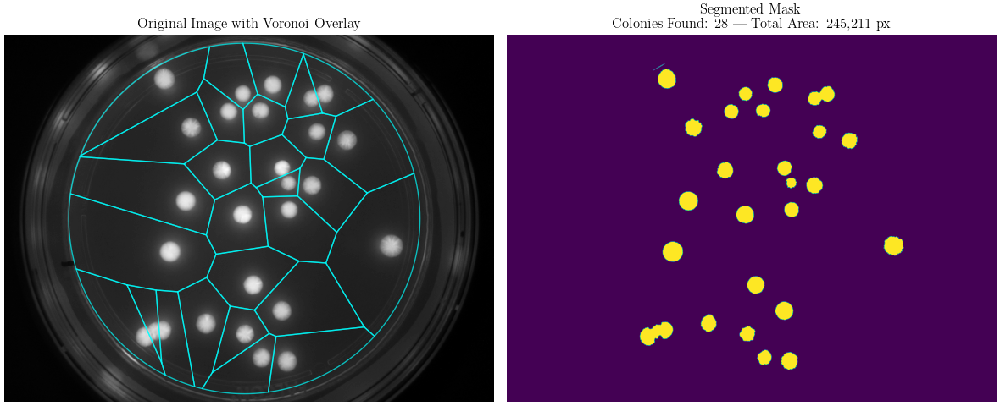

In [34]:
# --- 1. Load Voronoi Data from CSV ---
csv_index = 0  # change as needed
csv_path = csv_files[csv_index]
rois_df = pd.read_csv(os.path.join(BASE_CORRECTED_VORONOI_DATA_PATH, csv_path))
print(f"Successfully loaded {len(rois_df)} ROIs from {csv_path}")

# --- 2. Define the Segmentation Function (Unchanged) ---

def segment_colonies_by_voronoi(image, df):
    """
    Segments colonies by applying Otsu's threshold locally within each Voronoi cell.
    """
    all_colony_masks = np.zeros(image.shape, dtype=bool)
    colony_areas = []

    for index, row in df.iterrows():
        voronoi_wkt = row['Voronoi_WKT']
        voronoi_poly = wkt.loads(voronoi_wkt)
        voronoi_mask = np.zeros(image.shape, dtype=bool)
        
        c_voro, r_voro = voronoi_poly.exterior.xy
        rr, cc = polygon(r_voro, c_voro, shape=image.shape)
        voronoi_mask[rr, cc] = True

        pixels_in_roi = image[voronoi_mask]
        if pixels_in_roi.size == 0:
            continue

        try:
            # OpenCV Gaussian and CLAHE to enhance contrast
            #gaussian_blurred = cv2.GaussianBlur(pixels_in_roi, (3, 3), 0)
            clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(3, 3))
            enhanced = clahe.apply(pixels_in_roi.astype(np.uint8))
            thresh = filters.threshold_otsu(enhanced)
            # We apply otsu's threshold to the enhanced image
            #thresh = filters.threshold_otsu(pixels_in_roi)
            colony_mask_in_roi = image > thresh
            final_colony_mask = voronoi_mask & colony_mask_in_roi
        except ValueError:
            continue

        #final_colony_mask = morphology.remove_small_objects(final_colony_mask, min_size=5)

        area = np.sum(final_colony_mask)
        colony_areas.append(area)
        all_colony_masks = all_colony_masks | final_colony_mask

    return all_colony_masks, colony_areas


fluo_img = cv2.imread(bfiles[-1], cv2.IMREAD_GRAYSCALE)

# --- 3. Execute the Segmentation (Unchanged) ---
final_mask, areas = segment_colonies_by_voronoi(fluo_img, rois_df)
total_area = np.sum(areas)
colony_count = len([area for area in areas if area > 0])


# --- 4. Visualize the Result (MODIFIED) ---
fig, axes = plt.subplots(1, 2, figsize=(12, 6))

# Subplot 1: Original Image + Voronoi Overlay
axes[0].imshow(fluo_img, cmap='gray')
axes[0].set_title('Original Image with Voronoi Overlay')
axes[0].axis('off')

# Add the overlay by plotting each polygon
for poly_wkt in rois_df["Voronoi_WKT"]:
    poly = wkt.loads(poly_wkt)
    xs, ys = poly.exterior.xy
    axes[0].plot(xs, ys, color='cyan', linewidth=1, alpha=0.7) # Changed to plot for outlines


# Subplot 2: Segmented Mask
axes[1].imshow(final_mask, cmap='viridis')
axes[1].set_title(f'Segmented Mask\nColonies Found: {colony_count} | Total Area: {total_area:,} px')
axes[1].axis('off')

plt.tight_layout()

# Save the image as a png and as a pdf
output_image_path_png = os.path.join(SAVE_PATH_FIGURES, true_name + '_voronoi_colony_segmentation_DEMOSTRATIVE.png')
output_image_path_pdf = os.path.join(SAVE_PATH_FIGURES, true_name + '_voronoi_colony_segmentation_DEMOSTRATIVE.pdf')
fig.savefig(output_image_path_png, dpi=300)
fig.savefig(output_image_path_pdf, dpi=300)

## 3.2 Registration and segmentation (working code 28/08/2025)
Run once per timelapse to generate registered frames used downstream.

### 3.2.1 Phase correlation registration (XY drift correction)

In [ ]:
from skimage.registration import phase_cross_correlation
from scipy.ndimage import fourier_shift
import cv2
import os
import glob
from natsort import natsorted
import numpy as np
import pandas as pd
from joblib import Parallel, delayed
from skimage.filters import threshold_otsu
from shapely import wkt
from skimage import measure, morphology
from skimage.draw import polygon
import matplotlib.pyplot as plt
from tqdm import tqdm
import random

# ──────────────────────────────────────────────────────────────────
#  Voronoi-button callback  (adds export + full summary table)
# ──────────────────────────────────────────────────────────────────
from shapely.geometry import Point, Polygon
from shapely import wkt                              # for WKT serialisation
from skimage.draw import polygon
from skimage.filters import threshold_otsu
from skimage.morphology import remove_small_objects, binary_closing, disk
import pandas as pd
import datetime, os

In [71]:
# --- 1. Setup Paths and Find Images ---
working_path = str(RAW_IMAGE_ROOT)
tl_code = true_name
experiment_folder_local = os.path.join(working_path, tl_code)

output_folder = os.path.join(experiment_folder_local, 'registered_color')#'registered_color')
os.makedirs(output_folder, exist_ok=True)

image_files = glob.glob(os.path.join(experiment_folder_local, '*.png'))
image_files = [f for f in image_files if not os.path.basename(f).startswith('W')]
sorted_image_files = natsorted(image_files)

print(f"Found {len(sorted_image_files)} color images for registration.")
print(f"Registered images will be saved to: {output_folder}")

fixed_image_path = sorted_image_files[-1]
fixed_image_color = cv2.imread(fixed_image_path, cv2.IMREAD_COLOR)
fixed_image_channel = fixed_image_color[:, :, 2].astype(np.float32)
rows, cols, _ = fixed_image_color.shape


Found 193 color images for registration.
Registered images will be saved to: /Users/adaravena/Desktop/FONDECYT_Fluopti/datos crudos/TL020224/registered_color


#### Run registration only once per timelapse

In [72]:
# Enable OpenCV low-level optimizations
cv2.setUseOptimized(True)
cv2.setNumThreads(0)  # optionally let OpenCV decide thread count

# --- Fixed/reference image (color) and registration channel (R = index 2) ---
# Fixed/reference channel
fixed_image_channel = cv2.extractChannel(fixed_image_color, 2).astype(np.float32)
fixed_image_channel = np.ascontiguousarray(fixed_image_channel)
rows, cols = fixed_image_channel.shape

# Hanning window must match dtype and shape
hann = cv2.createHanningWindow((cols, rows), cv2.CV_32F)  # was CV_64F
hann = np.ascontiguousarray(hann)

print("Starting registration with OpenCV phaseCorrelate on color images...")

processed_B = 0
processed_W = 0

for img_path in tqdm(sorted_image_files):
    name = os.path.basename(img_path)

    # Only handle images beginning with 'B' (fluorescence) or 'W' (brightfield)
    if not (name.startswith("B") or name.startswith("W")):
        continue

    # If this output already exists, skip (registration previously done)
    output_path = os.path.join(output_folder, name)
    if os.path.exists(output_path):
        # Count as already-processed for coverage check
        if name.startswith("B"): processed_B += 1
        if name.startswith("W"): processed_W += 1
        continue

    # Load moving image (color) and pick the same channel as the fixed image
    moving_color = cv2.imread(img_path, cv2.IMREAD_COLOR)
    if moving_color is None:
        print(f"[warn] Could not read {img_path}; skipping.")
        continue

    # Sanity: shape match for phase correlation
    if (moving_color.shape[0] != rows) or (moving_color.shape[1] != cols):
        raise ValueError(f"Shape mismatch: {img_path} has {moving_color.shape[:2]} "
                         f"but fixed is {(rows, cols)}")

    moving_chan = cv2.extractChannel(moving_color, 2).astype(np.float32)
    moving_chan = np.ascontiguousarray(moving_chan)

    # --- Sub-pixel translation via phase correlation (dx, dy) ---
    (dx, dy), response = cv2.phaseCorrelate(fixed_image_channel, moving_chan, hann)

    # Optional: skip very low-confidence matches
    # if response < 0.05:
    #     print(f"[warn] weak correlation (response={response:.3f}) for {name}")

    # Build translation matrix; negate because warpAffine maps output coords back to source
    M = np.float32([[1, 0, -dx],
                    [0, 1, -dy]])
    
    interp = cv2.INTER_LINEAR if name.startswith("W") else cv2.INTER_LINEAR
    corrected = cv2.warpAffine(moving_color, M, (cols, rows), flags=interp, borderMode=cv2.BORDER_CONSTANT, borderValue=0)

    # Save corrected image
    cv2.imwrite(output_path, corrected)

    if name.startswith("B"): processed_B += 1
    if name.startswith("W"): processed_W += 1

print("Registration complete!")
print(f"Fluorescence (B*) processed: {processed_B}")
print(f"Brightfield (W*) processed: {processed_W}")

Starting registration with OpenCV phaseCorrelate on color images...


100%|██████████| 193/193 [03:13<00:00,  1.01s/it]

Registration complete!
Fluorescence (B*) processed: 193
Brightfield (W*) processed: 0


In [38]:
fp_dataset.px_to_mm['mm_px']

0.036

### 3.3 Colony segmentation helpers

In [72]:
cols_area = fp_dataset.agar_space

In [73]:
cols_area['radius'] = cols_area['radius'] - 100

In [65]:
ANALYSIS_COLS_AREA = {
    'center': [1150, 1550],
    'r': 1250,
    'radius': 1250
}

In [74]:
ANALYSIS_COLS_AREA = cols_area

In [75]:
# ---- OpenCV helpers ----
def make_agar_mask(shape_hw, center, radius, outside=True):
    """
    center: (row, col); radius in px
    Returns boolean mask: True where 'outside' (if outside=True), else True where inside.
    """
    H, W = shape_hw
    mask = np.zeros((H, W), dtype=np.uint8)
    c_row = int(round(center[0]))
    c_col = int(round(center[1]))
    cv2.circle(mask, (c_col, c_row), int(round(radius)), color=255, thickness=-1)
    mask_bool = mask.astype(bool)
    return (~mask_bool) if outside else mask_bool

def norm8_by_max(im):
    """
    Scale by max (like your norm8): out = im / max(im) * 255, guard max=0.
    Uses OpenCV for speed; returns uint8.
    """
    # Ensure float32 for scaling
    imf = im.astype(np.float32, copy=False)
    minVal, maxVal, _, _ = cv2.minMaxLoc(imf)
    if maxVal <= 0:
        return np.zeros_like(im, dtype=np.uint8)
    # scale and convert to uint8 (abs is harmless here; values are non-negative after top-hat)
    out = cv2.convertScaleAbs(imf, alpha=255.0 / maxVal, beta=0.0)
    return out

def preprocess_image_cv(fluo_img, cols_area, x_rad=75, y_rad=75):
    """
    OpenCV version of your preprocess:
      1) agar_mask: boolean True outside the plate
      2) top-hat on full image
      3) top-hat on interior-only image
      4) normalize each to uint8 [0..255] by max
    Returns: processed_img, processed_img_interior, agar_mask
    """
    H, W = fluo_img.shape[:2]

    # 1) binary mask of *outside* the agar plate
    agar_mask = make_agar_mask(
        (H, W), center=cols_area["center"], radius=cols_area["radius"],
        outside=True
    )

    # 2) Structuring element (ellipse), radius → kernel size
    ksize = (int(2 * x_rad + 1), int(2 * y_rad + 1))
    se = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, ksize)

    # Ensure a supported depth: OpenCV morphology accepts 8U/16U/32F
    # Keep original dtype to avoid needless copies
    src = fluo_img

    # 3) Top-hat on full image: image - opening(image)
    top_hat = cv2.morphologyEx(src, cv2.MORPH_TOPHAT, se)

    # 4) Top-hat on interior-only signal
    #    Make an 8-bit mask for bitwise ops: interior = NOT agar_mask
    interior_mask_u8 = (~agar_mask).astype(np.uint8) * 255
    #    Mask the source (keeps dtype of src)
    #    Note: cv2.bitwise_and only accepts 8U/16U/32F; src must match that.
    interior = cv2.bitwise_and(src, src, mask=interior_mask_u8)
    top_hat_in = cv2.morphologyEx(interior, cv2.MORPH_TOPHAT, se)

    # 5) Normalize each to uint8 [0..255] like your norm8
    processed_img         = norm8_by_max(top_hat)
    processed_img_interior= norm8_by_max(top_hat_in)

    return processed_img, processed_img_interior, agar_mask

In [76]:
processed_img, processed_img_interior, agar_mask = preprocess_image_cv(
    fluo_img, ANALYSIS_COLS_AREA, x_rad=75, y_rad=75
)

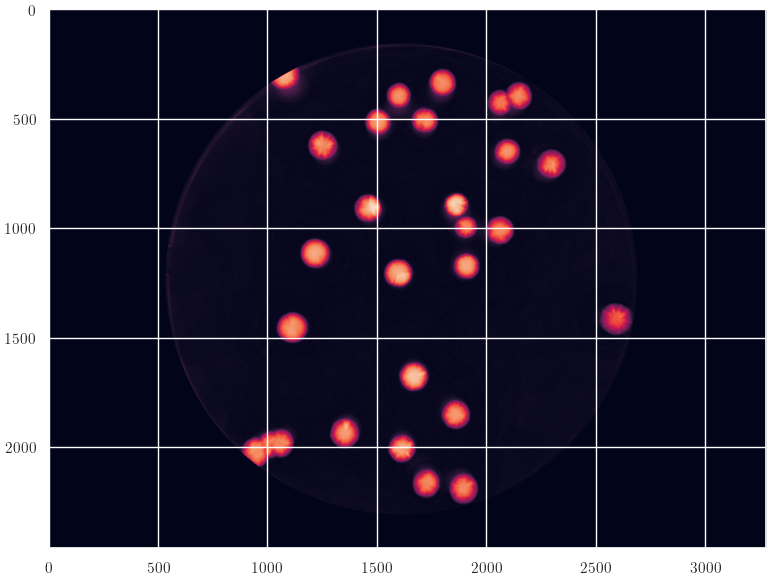

In [77]:
plt.figure(figsize=(10, 7))
plt.imshow(processed_img_interior)
plt.show()

### 3.4 ROI contour extraction

In [42]:
plt.close("all")

In [43]:
def _refine_by_geometry(binary_mask, plate_cx, plate_cy, plate_r,
                        px_mm=0.036,
                        min_diam_mm=0.20,   # tune to your data
                        max_diam_mm=5.00,
                        circ_min=0.65,
                        solidity_min=0.92,
                        rim_margin_mm=2.0):
    """
    Keep only roughly round, solid blobs within size bounds and not hugging the rim.
    binary_mask: bool/uint8 image with the candidate colonies.
    Returns a boolean mask of kept components (same shape).
    """
    # Size thresholds (in pixels)
    rmin_px = (min_diam_mm / 2.0) / px_mm
    rmax_px = (max_diam_mm / 2.0) / px_mm
    min_area_px = np.pi * (rmin_px ** 2)
    max_area_px = np.pi * (rmax_px ** 2)
    rim_margin_px = rim_margin_mm / px_mm

    # IMPORTANT: this returns 4 values
    num_labels, labels, stats, cents = cv2.connectedComponentsWithStats(
        (binary_mask.astype(np.uint8) > 0).astype(np.uint8), connectivity=8
    )

    keep = np.zeros_like(binary_mask, dtype=bool)

    # Loop over components (skip background 0)
    for i in range(1, num_labels):
        area = float(stats[i, cv2.CC_STAT_AREA])
        if area < min_area_px or area > max_area_px:
            continue

        # Box for this component
        x0 = int(stats[i, cv2.CC_STAT_LEFT])
        y0 = int(stats[i, cv2.CC_STAT_TOP])
        w  = int(stats[i, cv2.CC_STAT_WIDTH])
        h  = int(stats[i, cv2.CC_STAT_HEIGHT])

        # Crop this component from the label image
        sub = (labels[y0:y0+h, x0:x0+w] == i).astype(np.uint8) * 255

        # Contour for perimeter/shape metrics
        cnts, _ = cv2.findContours(sub, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)
        if not cnts:
            continue
        cnt = cnts[0]

        perim = cv2.arcLength(cnt, True)
        area_cnt = cv2.contourArea(cnt)
        if perim <= 0 or area_cnt <= 0:
            continue

        circularity = 4.0 * np.pi * area_cnt / (perim * perim + 1e-9)
        hull = cv2.convexHull(cnt)
        hull_area = max(cv2.contourArea(hull), 1e-9)
        solidity = area_cnt / hull_area

        # Distance to plate rim
        cx, cy = cents[i]   # (x, y)
        rim_gap = plate_r - np.hypot(cx - plate_cx, cy - plate_cy)

        if (circularity >= circ_min) and (solidity >= solidity_min) and (rim_gap > rim_margin_px):
            keep[y0:y0+h, x0:x0+w] |= (sub.astype(bool))

    return keep

def _largest_component_mask(labels, stats):
    """Return a boolean mask for the single largest non-background component."""
    if stats.shape[0] <= 1:
        return np.zeros_like(labels, dtype=bool)
    idx = 1 + np.argmax(stats[1:, cv2.CC_STAT_AREA])  # skip background row 0
    return (labels == idx)

def refine_colony_if_multi(colony_mask, plate_cx, plate_cy, plate_r,
                           px_mm=0.036,
                           min_diam_mm=0.20,
                           max_diam_mm=5.00,
                           circ_min=0.65,
                           solidity_min=0.92,
                           rim_margin_mm=2.0):
    """
    Only refine if there are >1 connected components in `colony_mask`.
    Otherwise return the mask unchanged. If refinement keeps nothing,
    fall back to the single largest component.
    """
    # Count components first
    num_labels, labels, stats, cents = cv2.connectedComponentsWithStats(
        (colony_mask.astype(np.uint8) > 0).astype(np.uint8), connectivity=8
    )

    # Only one foreground component? Keep as-is.
    if num_labels <= 2:   # 1 bg + 1 blob
        return colony_mask

    # More than one blob → run geometry refinement
    refined = _refine_by_geometry(
        colony_mask, plate_cx, plate_cy, plate_r,
        px_mm=px_mm,
        min_diam_mm=min_diam_mm,
        max_diam_mm=max_diam_mm,
        circ_min=circ_min,
        solidity_min=solidity_min,
        rim_margin_mm=rim_margin_mm
    )

    # Nothing survived? Use the largest component as a safe fallback.
    if not np.any(refined):
        refined = _largest_component_mask(labels, stats)

    return refined

In [46]:
# 5. Define the pixel-to-micrometer conversion factor.
pixel_um = 0.036  # mm Adjust as needed

# --- Code Integration ---
# Apply CLAHE to the preprocessed image interior
clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(21, 21))
clahe_img = clahe.apply(processed_img_interior.astype(np.uint8))
# Apply a median filter to reduce noise
median_filtered = cv2.GaussianBlur(clahe_img, (7, 7), 0) #cv2.medianBlur(clahe_img, 5)
# Now apply a gaussian blur to smooth the image
gaussian_blurred = cv2.medianBlur(median_filtered, 3) #cv2.GaussianBlur(median_filtered, (9, 9), 0)
# This median filtered image will be the input to our Voronoi segmentation pipeline

# 1) Agar plate geometry (kept as-is; shapely ok for geometry)
plate_cx, plate_cy = cols_area['center'][0], cols_area['center'][1]
plate_r = cols_area['radius']
plate_poly = Point(plate_cx, plate_cy).buffer(plate_r, resolution=512)

# 2) Create the inner_plate by shaving off a margin
margin_px = 0  # Tune this value as needed
inner_r = max(plate_r - margin_px, 1)
inner_plate = Point(plate_cx, plate_cy).buffer(inner_r, resolution=512)

# --- OpenCV structuring element to replace skimage.morphology.disk(5) ---
_dilate_kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5, 5))  # radius=5 → 2r+1

# --- Main Processing Pipeline ---
records = []
polys_for_plot, colony_masks = [], []

# Helper: rasterize shapely polygon into a boolean mask using OpenCV (exterior only)
def poly_to_mask_cv(poly, shape_hw):
    H, W = shape_hw
    mask_u8 = np.zeros((H, W), dtype=np.uint8)
    if poly.is_empty:
        return mask_u8.astype(bool)
    x, y = poly.exterior.xy  # shapely gives (x,y)
    pts = np.round(np.column_stack([x, y])).astype(np.int32)
    # Clip to image bounds to avoid OpenCV assertion on out-of-bounds
    pts[:, 0] = np.clip(pts[:, 0], 0, W - 1)
    pts[:, 1] = np.clip(pts[:, 1], 0, H - 1)
    if pts.size >= 6:  # at least 3 points
        cv2.fillPoly(mask_u8, [pts.reshape((-1, 1, 2))], color=255)
    return mask_u8.astype(bool)

# Iterate over the rows of your DataFrame
for idx, row in tqdm(rois_df.iterrows(), total=len(rois_df)):

    # Create a local copy of the image for this ROI
    local_img = gaussian_blurred.copy()  # uint8

    voronoi_wkt = row['Voronoi_WKT']
    voronoi_poly = wkt.loads(voronoi_wkt)

    # --- OpenCV polygon fill instead of skimage.draw.polygon ---
    voronoi_mask = poly_to_mask_cv(voronoi_poly, local_img.shape)

    pixels_in_roi = local_img[voronoi_mask]
    # Calculate the area of the Voronoi region
    region_area_px = int(voronoi_mask.sum())
    if pixels_in_roi.size == 0:
        print(f"Skipping ROI {row['ROI']} due to empty pixel set.")
        continue

    # ---------- 2.2 Colony Segmentation ----------
    if region_area_px == 0:
        colony_area_px = 0
        colony = np.zeros_like(local_img, dtype=bool)
    else:
        # Initialize region_mask from the current Voronoi mask in each loop
        region_mask = voronoi_mask.copy()

        # (1) Exclude agar area (assuming 'agar_mask' is boolean, True on agar)
        region_mask &= ~agar_mask

        # Check if any pixels remain before thresholding
        if not np.any(region_mask):
            colony = np.zeros_like(region_mask, dtype=bool)  # Empty mask
            colony_area_px = 0
        else:
            # --- Otsu's threshold locally using OpenCV (on masked values only) ---
            vals = local_img[region_mask]  # uint8 vector
            # If too few or constant, fall back to mean
            if vals.size < 10 or np.all(vals == vals.flat[0]):
                th_used = int(np.mean(vals)) if vals.size else 255
            else:
                # cv2.threshold expects an image; feed a column vector (uint8)
                _, _bin = cv2.threshold(vals.reshape(-1, 1), 0, 255, cv2.THRESH_BINARY | cv2.THRESH_OTSU)
                # Retrieve the actual threshold by recomputing between-class var OR
                # simply use the Otsu mask to infer threshold via min selected pixel:
                th_used = int(_)  # OpenCV returns the threshold in the first value

            # Apply threshold only inside region_mask
            colony = (local_img >= th_used) & region_mask

            # --- Morphological dilation via OpenCV (replace skimage.binary_dilation) ---
            col_u8 = (colony.astype(np.uint8) * 255)
            col_u8 = cv2.dilate(col_u8, _dilate_kernel, iterations=3)
            colony = (col_u8 > 0) & region_mask  # keep inside ROI

            colony_area_px = int(colony.sum())
            
            ## --- NEW CODE FOR REFINING CIRCULARITY ---
            # --- refine only if multiple blobs are present ---
            colony = refine_colony_if_multi(
                colony, plate_cx, plate_cy, plate_r,
                px_mm=pixel_um,          # your var = mm/px (36 µm/px)
                min_diam_mm=0.20,
                max_diam_mm=5.00,
                circ_min=0.65,
                solidity_min=0.92,
                rim_margin_mm=0.0
            )
            colony_area_px = int(colony.sum())
            ## --- END NEW CODE FOR REFINING CIRCULARITY ---

    # ---------------------------------------------

    colony_masks.append(colony)  # For plotting or other immediate use

    # ---------- 2.3 Record Results ----------
    y_cent, x_cent = row['Centroid_row'], row['Centroid_col']
    records.append({
        "ROI": row['ROI'],
        "Centroid_row": y_cent,
        "Centroid_col": x_cent,
        "Voronoi_WKT": voronoi_wkt,
        "Voronoi_polygon": voronoi_poly,
        "Voronoi_area_px": region_area_px,
        "Colony_area_px": colony_area_px,
        "Colony_area_um2": round(colony_area_px * pixel_um**2, 2),
        "Colony_mask": colony  # <-- Here is the new addition!
    })

# Create the final DataFrame
new_rois_df = pd.DataFrame(records)
# Assert that both the old and new dataframes have the same number of rows
assert len(rois_df) == len(new_rois_df), "Row count mismatch between original and new DataFrames."
print("Processing Complete! The 'Colony_mask' has been added to the DataFrame.")
print(new_rois_df.head())

# Save the new DataFrame to a CSV file
GROWTH_OUT = SAVE_PATH_DATA / 'growth_and_fluo'
GROWTH_OUT.mkdir(parents=True, exist_ok=True)
out_csv = GROWTH_OUT / f"{tl_code}_corrected_voronoi_growthandfluo_data.csv"
new_rois_df.to_csv(out_csv, index=False)
print(f"Results saved to {out_csv}")


100%|██████████| 28/28 [00:01<00:00, 14.01it/s]


Processing Complete! The 'Colony_mask' has been added to the DataFrame.
   ROI  Centroid_row  Centroid_col  \
0    1        1065.0         296.0   
1    2        1788.0         335.0   
2    3        1589.0         393.0   
3    4        2143.0         394.0   
4    5        2047.0         425.0   

                                         Voronoi_WKT  \
0  POLYGON ((1290.227651285517 383.88916329593224...   
1  POLYGON ((1698.173245091701 397.18923746980164...   
2  POLYGON ((1336.6019567881683 292.6296354948429...   
3  POLYGON ((2004.565510828484 129.4448077269182,...   
4  POLYGON ((2132.5274667136937 525.7140904682127...   

                                     Voronoi_polygon  Voronoi_area_px  \
0  POLYGON ((1290.227651285517 383.88916329593224...           216017   
1  POLYGON ((1698.173245091701 397.18923746980164...           109956   
2  POLYGON ((1336.6019567881683 292.6296354948429...           104778   
3  POLYGON ((2004.565510828484 129.4448077269182,...            95032 

In [47]:
plt.close("all")

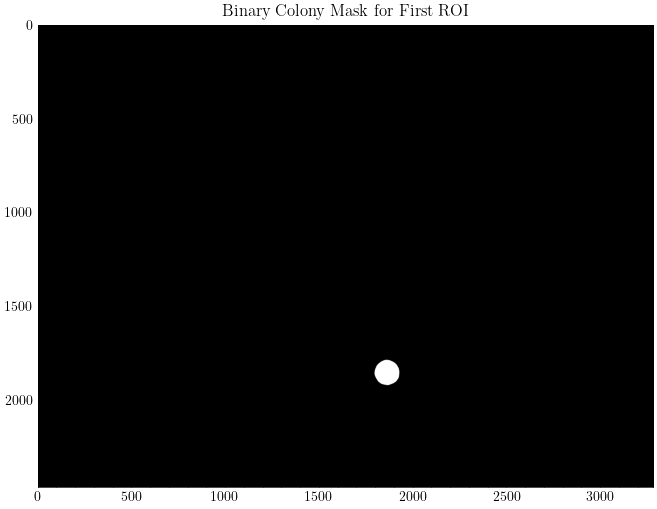

In [48]:
first_colony_mask = new_rois_df.loc[20, 'Colony_mask']
# Plot the first colony mask
plt.figure(figsize=(8, 6))
plt.imshow(first_colony_mask, cmap='gray')
plt.title("Binary Colony Mask for First ROI")
plt.show()

### 3.5 Background subtraction and colony fluorescence quantification

In [84]:
# ─────────────────────────────────────────────────────────────
#  Image reader: RGB (OpenCV BGR) → (R+G), normalized to uint8 [0..255]
# ─────────────────────────────────────────────────────────────
def read_rg_sum_uint8(path, normalize='dtype'):
    """
    Load an image with OpenCV, extract R and G channels, sum them,
    and return a 2D uint8 array in [0..255].

    normalize:
      - 'dtype': scale by expected sensor range (keeps inter-frame comparability)
                 (e.g., uint16 channels → sum range [0..2*65535] mapped to [0..255])
    """
    img = cv2.imread(path, cv2.IMREAD_UNCHANGED)
    if img is None:
        raise FileNotFoundError(f"Could not read image: {path}")

    # Ensure we have at least 2 channels (R,G); fall back gracefully if grayscale
    if img.ndim == 2:
        # Single-channel image; treat as already "summed"
        rg = img.astype(np.float64, copy=False)
    else:
        # OpenCV loads color as BGR; take G (1) and R (2)
        bgr = img[..., :3]                   # drop alpha if present
        g = bgr[..., 1].astype(np.float64)
        r = bgr[..., 2].astype(np.float64)
        rg = r + g                           # float to avoid overflow pre-normalization

    if normalize == 'dtype':
        # Use dtype max of ORIGINAL per-channel type to define expected range
        if np.issubdtype(img.dtype, np.integer):
            ch_max = np.iinfo(img.dtype).max    # e.g., 255 or 65535
            scale_max = 2.0 * ch_max            # R+G sum max
        else:
            # Float image (often 0..1); assume channels in [0..1]
            scale_max = 2.0

        # Clip to valid range (guard against negatives)
        np.clip(rg, 0.0, scale_max, out=rg)

        if scale_max > 0:
            rg8 = (rg * (255.0 / scale_max)).astype(np.uint8)
        else:
            rg8 = np.zeros(rg.shape, dtype=np.uint8)
    else:
        raise ValueError("normalize must be 'dtype'")

    return rg8

# Auxiliary function for computing the mean background over a range of images
def compute_mean_background_image(
    image_paths,
    num_bg_frames=35,
    reader=read_rg_sum_uint8,   # your RG-sum → uint8 [0..255]
    normalize='dtype',
    agar_mask=None,             # boolean HxW, True on agar (inside plate)
    rim_shave_px=0              # optional: erode to stay away from rim
):
    """
    Build a per-pixel mean background from the first `num_bg_frames` images.
    If `agar_mask` is given, only agar pixels contribute; outside-agar stays 0.
    Returns float32 HxW.
    """
    if not image_paths:
        raise ValueError("image_paths is empty.")
    n = min(num_bg_frames, len(image_paths))

    acc = None
    ref_shape = None
    mask_f = None

    for p in image_paths[:n]:
        img8 = reader(p, normalize=normalize).astype(np.float32)

        if ref_shape is None:
            ref_shape = img8.shape
            acc = np.zeros(ref_shape, dtype=np.float64)

            if agar_mask is not None:
                if agar_mask.shape != ref_shape:
                    raise ValueError(f"agar_mask shape {agar_mask.shape} != frame shape {ref_shape}")
                mask_u8 = agar_mask.astype(np.uint8)
                if rim_shave_px > 0:
                    k = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (2*rim_shave_px+1, 2*rim_shave_px+1))
                    mask_u8 = cv2.erode(mask_u8, k, iterations=1)
                mask_f = mask_u8.astype(np.float32)
        else:
            if img8.shape != ref_shape:
                raise ValueError(f"All frames must share the same shape; got {img8.shape} vs {ref_shape} for {p}")

        if mask_f is not None:
            img8 *= mask_f   # zero outside agar (and optionally rim)
        acc += img8

    return (acc / float(n)).astype(np.float32)

In [85]:
# Legacy helper block kept for reference/QA; canonical background subtraction defined later in this section.
# 1) Union of all colony masks (H×W)
def union_colony_mask(rois_df, mask_col="Colony_mask", image_shape=None):
    masks = []
    for m in rois_df[mask_col].tolist():
        # 'm' may be a list of lists (object) → coerce to bool array
        arr = np.array(m, dtype=bool)
        masks.append(arr)
    if image_shape is None:
        H, W = masks[0].shape
    else:
        H, W = image_shape
    out = np.zeros((H, W), dtype=bool)
    for m in masks:
        if m.shape != (H, W):
            raise ValueError(f"Mask shape {m.shape} != expected {(H, W)}")
        out |= m
    return out

# 2) Background mask: agar but NOT any colony
def background_mask(agar_mask, union_colonies):
    return agar_mask & (~union_colonies)

# 3) Nice overlay for QA: colonies (red), agar-only background (cyan)
def overlay_colonies_and_agar(base_rg8, colonies_mask, agar_mask, 
                              alpha_col=0.40, alpha_agar=0.25):
    """Return an RGB uint8 image with colored overlays on top of base gray."""
    base_rgb = np.dstack([base_rg8]*3).astype(np.float32)
    out = base_rgb.copy()

    col_col = np.array([255, 0, 0], dtype=np.float32)      # red for colonies
    col_agar = np.array([0, 200, 255], dtype=np.float32)   # cyan for agar-only

    # Agar-only = agar minus colonies
    agar_only = agar_mask & (~colonies_mask)

    # Blend colonies
    idx = np.where(colonies_mask)
    out[idx] = (1 - alpha_col)*out[idx] + alpha_col*col_col

    # Blend agar-only (avoid double-blending colony pixels)
    idx = np.where(agar_only)
    out[idx] = (1 - alpha_agar)*out[idx] + alpha_agar*col_agar

    return np.clip(out, 0, 255).astype(np.uint8)

# 4) Compute per-frame background mean (R+G uint8) and subtract from each ROI mean
def bg_subtract_one_frame(
    rg_img8,                 # uint8 HxW, R+G image
    rois_df,                 # DataFrame with 'Colony_mask' per ROI
    agar_mask,               # boolean HxW: True on agar (inside plate)
    mask_col="Colony_mask",
    precomputed_union=None,  # optional boolean HxW (union of all colonies) to reuse across frames
    return_corrected=False
):
    # 1) Union of colonies (compute once per timelapse and pass via precomputed_union for speed)
    union_mask = precomputed_union if precomputed_union is not None else \
                 union_colony_mask(rois_df, mask_col=mask_col, image_shape=rg_img8.shape)

    # 2) Background = agar but NOT any colony
    bg_mask_bool = agar_mask & (~union_mask)
    bg_mask_u8   = (bg_mask_bool.astype(np.uint8) * 255)

    # 3) Background stats via fast OpenCV
    if np.any(bg_mask_bool):
        bg_mean_arr, bg_std_arr = cv2.meanStdDev(rg_img8, mask=bg_mask_u8)
        bg_mean = float(bg_mean_arr[0, 0])
        bg_std  = float(bg_std_arr[0, 0])
    else:
        bg_mean, bg_std = np.nan, np.nan

    # 4) Per-pixel background subtraction (vectorized), then CLIP at 0
    #    Use float32 to avoid precision loss; clip with THRESH_TOZERO (faster than np.maximum for large arrays)
    rg_f32 = rg_img8.astype(np.float32, copy=False)
    if np.isfinite(bg_mean):
        corrected = cv2.subtract(rg_f32, bg_mean)    # subtract scalar
        _, corrected = cv2.threshold(corrected, 0.0, 0.0, cv2.THRESH_TOZERO)  # clip negatives to 0
    else:
        corrected = rg_f32.copy()

    # 5) Per-ROI stats (pre and bg-subtracted) using OpenCV meanStdDev with ROI masks
    mean_rg8, std_rg8, mean_rg8_bgsub = [], [], []

    # (Optional speed-up) preconvert masks once per frame
    roi_masks_u8 = [(np.asarray(m, dtype=bool).astype(np.uint8) * 255) for m in rois_df[mask_col].tolist()]

    for m_u8 in roi_masks_u8:
        if m_u8.any():
            # Pre-subtraction stats on raw uint8
            mu_pre, sd_pre = cv2.meanStdDev(rg_img8, mask=m_u8)
            # Post-subtraction stats on clipped float32
            mu_post, _sd_post = cv2.meanStdDev(corrected, mask=m_u8)

            mean_rg8.append(float(mu_pre[0, 0]))
            std_rg8.append(float(sd_pre[0, 0]))
            mean_rg8_bgsub.append(float(mu_post[0, 0]))   # already ≥ 0 because we clipped
        else:
            mean_rg8.append(np.nan)
            std_rg8.append(np.nan)
            mean_rg8_bgsub.append(np.nan)

    out_df = rois_df.copy()
    out_df["mean_rg8"] = mean_rg8
    out_df["std_rg8"] = std_rg8
    out_df["mean_rg8_bgsub"] = mean_rg8_bgsub

    if return_corrected:
        return out_df, union_mask, bg_mask_bool, bg_mean, bg_std, corrected
    else:
        return out_df, union_mask, bg_mask_bool, bg_mean, bg_std

In [86]:
# Replace all the "W" letter in each of the filepaths with "B"
sorted_image_files = [f.replace(os.sep + 'W', os.sep + 'B') for f in sorted_image_files]

Background mean (uint8): 160.10 +/- 35.14
   ROI    mean_rg8  mean_rg8_bgsub
0    1  209.243424       49.147309
1    2  200.274614       40.204126
2    3  191.489515       31.588373
3    4  206.510754       46.414639
4    5  200.938858       40.842743


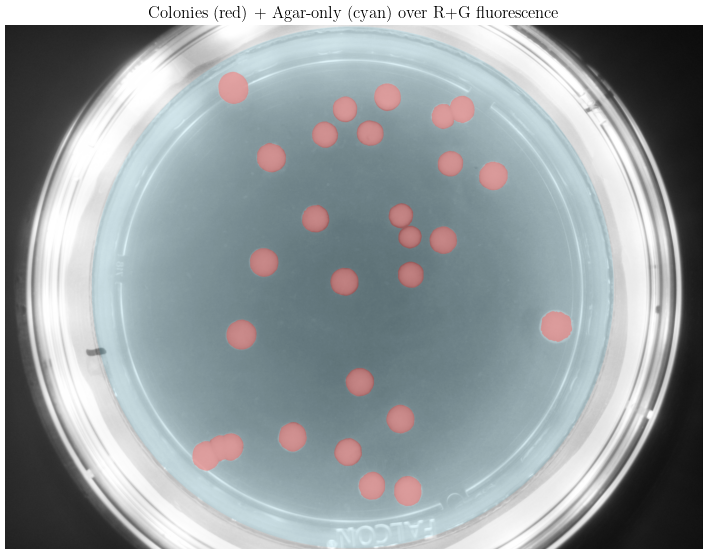

In [88]:
# Build list of registered fluorescence frames (B*) from registered outputs
registered_dir = first_existing([
    Path(working_path) / tl_code / 'registered_color_brightfield',
    Path(working_path) / tl_code / 'registered_color',
    Path(working_path) / tl_code,
])

corrected_names = sorted(str(p) for p in registered_dir.glob('W*.png'))
if not corrected_names:
    raise FileNotFoundError(f'No B*.png frames found under {registered_dir}')

# choose a representative frame; cap index if fewer frames
frame_idx = min(192, len(corrected_names) - 1)
rg_img8 = read_rg_sum_uint8(corrected_names[frame_idx], normalize='dtype')

# Precompute union once per run (optional)
union_once = union_colony_mask(new_rois_df, mask_col="Colony_mask", image_shape=rg_img8.shape)
updated_df, union_mask, bg_mask, bg_mean, bg_std = bg_subtract_one_frame(
    rg_img8, new_rois_df, ~agar_mask,  # agar_mask must be True on agar (inside plate)
    mask_col="Colony_mask",
    precomputed_union=union_once,
    return_corrected=False
)

print(f"Background mean (uint8): {bg_mean:.2f} +/- {bg_std:.2f}")
print(updated_df[["ROI","mean_rg8","mean_rg8_bgsub"]].head())

# 3) Overlay for QA and plot
vis = overlay_colonies_and_agar(rg_img8, union_mask, ~agar_mask,
                                alpha_col=0.25, alpha_agar=0.10)
plt.figure(figsize=(9,7))
plt.imshow(vis)
plt.title("Colonies (red) + Agar-only (cyan) over R+G fluorescence")
plt.axis('off')
plt.show()

In [89]:
# ---------- 1) Precompute per-ROI bbox + crop mask (run ONCE per timelapse) ----------
def _bbox_from_bool(mask_bool):
    ys, xs = np.where(mask_bool)
    if ys.size == 0:
        return None
    return int(ys.min()), int(ys.max()), int(xs.min()), int(xs.max())

def build_roi_cache(rois_df, image_shape, mask_col="Colony_mask"):
    """
    Returns: dict[ROI] = {
        'bbox': (r0,r1,c0,c1),
        'mask_u8': uint8 mask crop (255 inside ROI, 0 outside), contiguous
    }
    """
    H, W = image_shape
    cache = {}
    for _, row in rois_df.iterrows():
        roi_id = row["ROI"]
        m = np.asarray(row[mask_col], dtype=bool)
        if m.shape != (H, W):
            raise ValueError(f"Mask for ROI={roi_id} has shape {m.shape}, expected {(H, W)}")
        bbox = _bbox_from_bool(m)
        if bbox is None:
            continue  # empty ROI
        r0, r1, c0, c1 = bbox
        m_crop_u8 = (m[r0:r1+1, c0:c1+1].astype(np.uint8) * 255)
        cache[roi_id] = {
            "bbox": (r0, r1, c0, c1),
            "mask_u8": np.ascontiguousarray(m_crop_u8)
        }
    return cache

# ---------- 2) Fast contour finder on a SINGLE ROI using crops ----------
def find_contour_for_roi(
    frame_rg8,             # uint8 HxW
    roi_entry,             # dict from build_roi_cache()[roi_id]
    bg_mean,               # per-frame background mean (uint8 scale)
    skip_margin=0,         # optional safety band around bg mean
    area_cap=None,          # optional max allowed area for growth control
):
    """
    Returns: (best_contour_fullcoords, best_area, centroid_xy, otsu_thr, skipped)
             or (None, 0, (None,None), otsu_thr, True/False) if skipped/none.
    """
    if roi_entry is None:
        return None, 0.0, (None, None), 0, True

    r0, r1, c0, c1 = roi_entry["bbox"]
    roi_mask_u8 = roi_entry["mask_u8"]                 # crop uint8 (0/255)
    crop = np.ascontiguousarray(frame_rg8[r0:r1+1, c0:c1+1])

    # ROI values only
    roi_vals = crop[roi_mask_u8 > 0]
    # Subtract the background mean from roi_vals for debugging
    # DEBUGGING BACKGROUND SUBTRACTION
    #roi_vals = roi_vals.astype(np.float32) - float(bg_mean)
    #roi_vals = np.clip(roi_vals, 0, 255).astype(np.uint8)
    # Print the mean of roi_vals for debugging
    print(f"ROI values max: {np.max(roi_vals) if roi_vals.size > 0 else 'N/A'}")
    # Background mean as uint8
    if not np.isfinite(bg_mean):
        bg_u8 = 0
    else:
        bg_u8 = int(round(bg_mean))

    # DEBUGGING BACKGROUND SUBTRACTION
    bg_u8 = 0

    if roi_vals.size == 0:
        # print the reason for skipping
        print("Skipping ROI: no pixels inside ROI mask.")
        return None, 0.0, (None, None), int(bg_u8), True

    # --- Otsu on ROI-only values; floor at background mean ---
    if roi_vals.size < 5 or np.all(roi_vals == roi_vals.flat[0]):
        otsu_thr = max(int(np.mean(roi_vals)), bg_u8)
    else:
        pass
    # Use OpenCV's Otsu thresholding on the ROI values
    # Reshape to a column vector for cv2.threshold
    # Note: cv2.threshold expects uint8 input
    otsu_thr_cv, _ = cv2.threshold(
        roi_vals.reshape(-1, 1).astype(np.uint8),
        0, 255, cv2.THRESH_BINARY | cv2.THRESH_OTSU
    )
    otsu_thr = max(int(otsu_thr_cv), bg_u8)

    # Early skip if threshold ≤ background (no colony yet)
    if otsu_thr <= (bg_u8):# + int(skip_margin)):
        # Print the reason for skipping
        print(f"Skipping ROI: Otsu threshold {otsu_thr} ≤ background {bg_u8}.")
        return None, 0.0, (None, None), otsu_thr, True

    # --- Threshold inside ROI crop only (build binary crop) ---
    bin_crop = np.zeros_like(crop, dtype=np.uint8)
    # mask & threshold in one go (avoid temporary boolean arrays)
    mask_idx = (roi_mask_u8 > 0) & (crop >= otsu_thr)
    bin_crop[mask_idx] = 255

    # --- Contours on the crop ---
    contours, _ = cv2.findContours(bin_crop, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)
    if not contours:
        # Print the reason for skipping
        print("Skipping ROI: no contours found after thresholding.")
        return None, 0.0, (None, None), otsu_thr, False

    # Pick max area, respecting optional cap
    best_contour = None
    best_area = -1.0
    for cnt in contours:
        a = cv2.contourArea(cnt)
        if a <= 0:
            continue
        if (area_cap is not None) and (a > area_cap):
            continue
        if a > best_area:
            best_area = a
            best_contour = cnt

    if best_contour is None:
        # fallback to absolute largest
        best_contour = max(contours, key=cv2.contourArea)
        best_area = cv2.contourArea(best_contour)

    # Offset contour coordinates back to full-frame coords
    best_contour_full = best_contour.copy()
    best_contour_full[:, 0, 0] += c0
    best_contour_full[:, 0, 1] += r0

    # Centroid
    M = cv2.moments(best_contour_full)
    if M["m00"] != 0.0:
        cX = int(M["m10"] / M["m00"]); cY = int(M["m01"] / M["m00"])
    else:
        cX = cY = None

    return best_contour_full, float(best_area), (cX, cY), otsu_thr, False

ROI values max: 185
ROI 15 | skipped=False | otsu=165 | area=10483.5


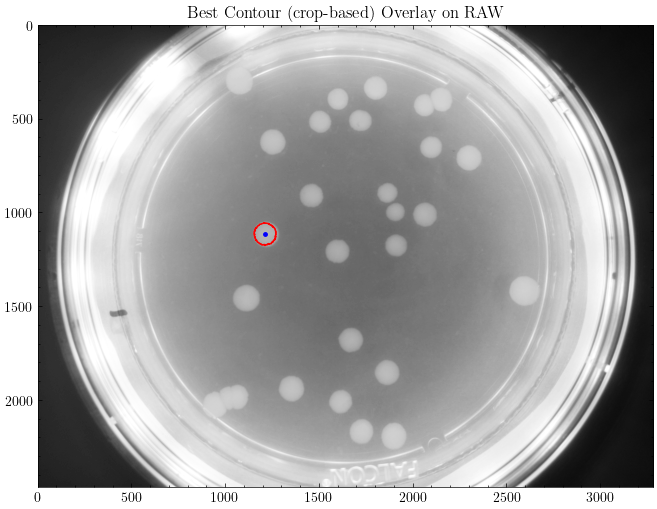

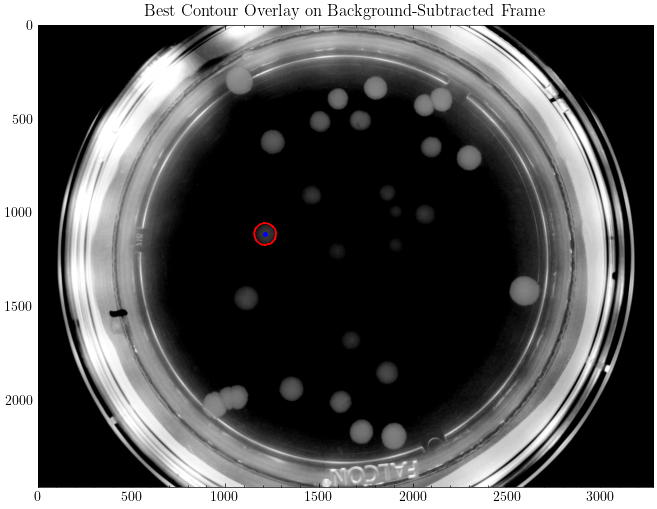

In [90]:
from math import ceil

# Precompute once (after you know frame shape)
roi_cache = build_roi_cache(new_rois_df, rg_img8.shape, mask_col="Colony_mask")

# Chosen roi
roi_num = 15
first_colony_mask = new_rois_df.loc[roi_num, 'Colony_mask']
first_fluo_masked = first_colony_mask * rg_img8   # unchanged; raw frame × mask

# For this frame, you may still have bg_mean/bg_std from a scalar routine;
# they are no longer needed for threshold floor once we pass global_bg_img.
roi_id = int(roi_num)  # or whatever your key type is
entry = roi_cache.get(roi_id, None)

# --- OPTIONAL (QA): build a corrected view of this frame for inspection/plots ---
frame_corr_f32 = rg_img8.astype(np.float32) - bg_mean
np.maximum(frame_corr_f32, 0.0, out=frame_corr_f32)
frame_corr_u8 = frame_corr_f32.astype(np.uint8)
# Re-normalize frame_corr_u8 to the min max range of the original frame for better visualization
min_val, max_val = np.min(frame_corr_u8), np.max(frame_corr_u8)
if max_val > min_val:
    frame_corr_u8 = ((frame_corr_u8 - min_val) * (255.0 / (max_val - min_val))).astype(np.uint8)

# --- CHANGED: call with global_bg_img; bg_mean is ignored in corrected path ---
best_contour, best_area, (cX, cY), otsu_thr, skipped = find_contour_for_roi(
    frame_rg8=rg_img8,                # keep passing the raw frame; function subtracts on the crop
    roi_entry=entry,
    bg_mean=bg_mean,                   # <<< CHANGED: ignored when global_bg_img is provided
    skip_margin=bg_std,                    # <<< CHANGED: floor is 0 after correction; no margin needed
    area_cap=last_max_area if 'last_max_area' in locals() else None,
)

print(f"ROI {roi_id} | skipped={skipped} | otsu={otsu_thr} | area={best_area:.1f}")

# Plot on RAW frame (as before)
plt.figure(figsize=(8,6))
plt.imshow(rg_img8, cmap='gray')
if best_contour is not None:
    plt.plot(best_contour[:,0,0], best_contour[:,0,1], 'r-', lw=1)
    if cX is not None and cY is not None:
        plt.plot(cX, cY, 'b.', ms=5)
plt.title("Best Contour (crop-based) Overlay on RAW")
plt.show()

# --- OPTIONAL: also plot on the corrected frame for QA ---
plt.figure(figsize=(8,6))
plt.imshow(frame_corr_u8, cmap='gray')
if best_contour is not None:
    plt.plot(best_contour[:,0,0], best_contour[:,0,1], 'r-', lw=1)
    if cX is not None and cY is not None:
        plt.plot(cX, cY, 'b.', ms=5)
plt.title("Best Contour Overlay on Background-Subtracted Frame")
plt.show()

# Optionally update cap for the next frame
if best_area > 0:
    last_max_area = best_area

ROI values max: 220
ROI 1 | skipped=False | otsu=206 | area=2.0
ROI values max: 212
ROI 2 | skipped=False | otsu=189 | area=11244.5
ROI values max: 206
ROI 3 | skipped=False | otsu=182 | area=8999.0
ROI values max: 215
ROI 4 | skipped=False | otsu=204 | area=8702.0
ROI values max: 212
ROI 5 | skipped=False | otsu=197 | area=7103.5
ROI values max: 196
ROI 6 | skipped=False | otsu=172 | area=9091.0
ROI values max: 198
ROI 7 | skipped=False | otsu=174 | area=8995.0
ROI values max: 197
ROI 8 | skipped=False | otsu=176 | area=11829.5
ROI values max: 199
ROI 9 | skipped=False | otsu=178 | area=8410.5
ROI values max: 210
ROI 10 | skipped=False | otsu=192 | area=1.5
ROI values max: 182
ROI 11 | skipped=False | otsu=152 | area=7588.0
ROI values max: 185
ROI 12 | skipped=False | otsu=157 | area=10091.5
ROI values max: 177
ROI 13 | skipped=False | otsu=146 | area=6437.0
ROI values max: 184
ROI 14 | skipped=False | otsu=161 | area=9660.5
ROI values max: 185
ROI 15 | skipped=False | otsu=165 | area

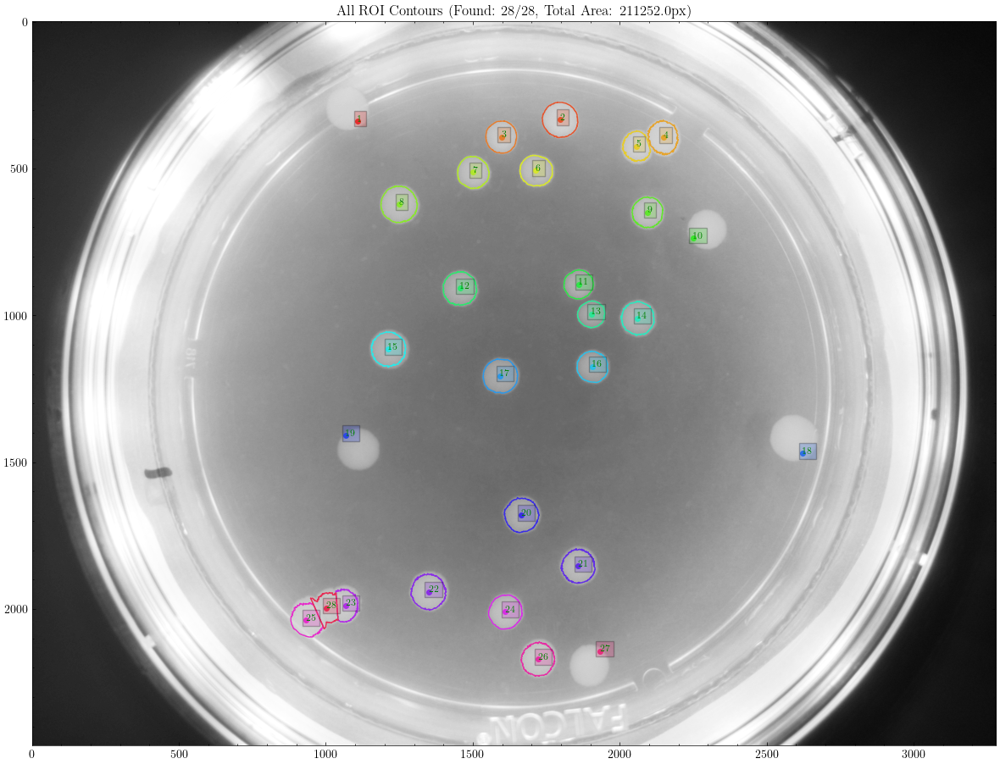

In [91]:
from matplotlib.colors import hsv_to_rgb
import numpy as np

# ---------- ROI cache (unchanged) ----------
roi_cache = build_roi_cache(new_rois_df, rg_img8.shape, mask_col="Colony_mask")

# (Optional) choose which base to display: raw or background-corrected
PLOT_CORRECTED_BASE = False  # <<< NEW toggle for visualization only

if PLOT_CORRECTED_BASE:      # <<< NEW: QA view (does not affect contouring)
    _f = rg_img8.astype(np.float32) - bg_mean
    np.maximum(_f, 0.0, out=_f)
    base_for_plot = _f.astype(np.uint8)
else:
    base_for_plot = rg_img8

# ---------- Plot base image ----------
plt.figure(figsize=(12, 10))
plt.imshow(base_for_plot, cmap='gray')  # <<< CHANGED: may show corrected base if toggled

# Setup for colors - we'll use HSV color space to get distinct colors (unchanged)
roi_ids = new_rois_df['ROI'].unique()
n_rois = len(roi_ids)
colors = [hsv_to_rgb((i/n_rois, 0.8, 0.9)) for i in range(n_rois)]
color_dict = dict(zip(roi_ids, colors))

total_colonies = 0
total_area = 0
skipped_count = 0

# ---------- Loop through all ROIs ----------
for roi_num in roi_ids:
    # Get cache entry for this ROI
    roi_id = int(roi_num)
    entry = roi_cache.get(roi_id, None)
    if entry is None:
        continue

    # ---------- Per-ROI contour on background-corrected crop ----------
    best_contour, best_area, (cX, cY), otsu_thr, skipped = find_contour_for_roi(
        frame_rg8=rg_img8,                 # keep passing RAW frame; function subtracts on the crop
        roi_entry=entry,
        bg_mean=bg_mean,                    # <<< CHANGED: ignored when global_bg_img is provided
        skip_margin=int(bg_std),                     # <<< CHANGED: floor is 0 after correction; no margin needed
        area_cap=last_max_area if 'last_max_area' in locals() else None,
    )

    # Track statistics (unchanged)
    if not skipped and best_area > 0:
        total_colonies += 1
        total_area += best_area
    if skipped:
        skipped_count += 1
        continue

    # Use color from dictionary (unchanged)
    roi_color = color_dict[roi_id]

    # Plot contour if found (unchanged)
    if best_contour is not None:
        plt.plot(best_contour[:,0,0], best_contour[:,0,1], color=roi_color, lw=1)
        if cX is not None and cY is not None:
            plt.plot(cX, cY, 'o', color=roi_color, ms=4)
            # Optional ROI ID
            plt.text(cX, cY, str(roi_id), fontsize=8, color='green',
                     bbox=dict(facecolor=roi_color, alpha=0.25, pad=3))

    # Print info about this ROI (unchanged text; values now reflect corrected Otsu)
    print(f"ROI {roi_id} | skipped={skipped} | otsu={otsu_thr} | area={best_area:.1f}")

# ---------- Overall stats + save ----------
plt.title(f"All ROI Contours (Found: {total_colonies}/{n_rois}, Total Area: {total_area:.1f}px)")
plt.tight_layout()
plt.savefig(f"{tl_code}_all_roi_contours.png", dpi=300)
plt.savefig(f"{tl_code}_all_roi_contours.pdf")
plt.show()

# Store the total area for potential future use (unchanged)
if total_area > 0:
    last_max_area = total_area

In [123]:
plt.close("all")

### 3.6 Batch processing and long-table export

In [92]:
import cv2, numpy as np, os, pandas as pd
from typing import Dict, Tuple, Any, List
import traceback

# ---- (kept from your code) union of all ROIs ----
def union_colony_mask(rois_df, mask_col="Colony_mask", image_shape=None):
    masks = [np.array(m, dtype=bool) for m in rois_df[mask_col].tolist()]
    H, W = image_shape if image_shape is not None else masks[0].shape
    out = np.zeros((H, W), dtype=bool)
    for m in masks:
        if m.shape != (H, W):
            raise ValueError(f"Mask shape {m.shape} != expected {(H, W)}")
        out |= m
    return out

# ---- ROI cache (bbox + uint8 crop mask) ----
def _bbox_from_bool(mask_bool):
    ys, xs = np.where(mask_bool)
    if ys.size == 0: return None
    return int(ys.min()), int(ys.max()), int(xs.min()), int(xs.max())

def build_roi_cache(rois_df, image_shape, mask_col="Colony_mask") -> Dict[Any, Dict[str, Any]]:
    H, W = image_shape
    cache = {}
    for _, row in rois_df.iterrows():
        roi_id = row["ROI"]
        m = np.asarray(row[mask_col], dtype=bool)
        if m.shape != (H, W):
            raise ValueError(f"Mask for ROI={roi_id} has shape {m.shape}, expected {(H, W)}")
        bbox = _bbox_from_bool(m)
        if bbox is None:
            continue
        r0, r1, c0, c1 = bbox
        m_crop_bool = m[r0:r1+1, c0:c1+1]
        m_crop_u8   = (m_crop_bool.astype(np.uint8) * 255)
        cache[roi_id] = {
            "bbox": (r0, r1, c0, c1),
            "mask_bool": np.ascontiguousarray(m_crop_bool),
            "mask_u8":   np.ascontiguousarray(m_crop_u8),
        }
    return cache


In [97]:
# Canonical background subtraction used for batch band quantification (overrides legacy helper above).
def bg_subtract_one_frame(
    rg_img8,
    rois_df,
    agar_inside_mask,
    mask_col="Colony_mask",
    precomputed_union=None,
    roi_masks_u8_pre=None,        # <── NEW
    return_corrected=False
):

    # 1) Union of colonies
    if precomputed_union is not None:
        union_mask = precomputed_union
    elif roi_masks_u8_pre is not None:
        union_mask = np.any(np.stack([(m > 0) for m in roi_masks_u8_pre], axis=0), axis=0)
    else:
        union_mask = union_colony_mask(rois_df, mask_col=mask_col, image_shape=rg_img8.shape)

    # 2) Background = agar but NOT any colony
    bg_mask_bool = agar_inside_mask & (~union_mask)
    bg_mask_u8   = (bg_mask_bool.astype(np.uint8) * 255)

    # 3) Background stats
    if np.any(bg_mask_bool):
        bg_mean_arr, bg_std_arr = cv2.meanStdDev(rg_img8, mask=bg_mask_u8)
        bg_mean = float(bg_mean_arr[0, 0])
        bg_std  = float(bg_std_arr[0, 0])
    else:
        bg_mean, bg_std = np.nan, np.nan

    # 4) Per-ROI stats on the raw image (no full-frame 'corrected')
    mean_rg8, std_rg8, mean_rg8_bgsub = [], [], []
    roi_masks_u8 = roi_masks_u8_pre if roi_masks_u8_pre is not None else [
        (np.asarray(m, dtype=bool).astype(np.uint8) * 255) for m in rois_df[mask_col].tolist()
    ]

    for m_u8 in roi_masks_u8:
        if m_u8.any():
            mu_pre, sd_pre = cv2.meanStdDev(rg_img8, mask=m_u8)
            mu_pre = float(mu_pre[0, 0]); sd_pre = float(sd_pre[0, 0])
            # bg-subtracted mean without allocating a corrected image
            mu_post = mu_pre - (bg_mean if np.isfinite(bg_mean) else 0.0)
            if mu_post < 0.0:  # mimic the clip-to-zero from your old pipeline
                mu_post = 0.0

            mean_rg8.append(mu_pre)
            std_rg8.append(sd_pre)
            mean_rg8_bgsub.append(mu_post)
        else:
            mean_rg8.append(np.nan)
            std_rg8.append(np.nan)
            mean_rg8_bgsub.append(np.nan)

    out_df = rois_df.copy()
    out_df["mean_rg8"] = mean_rg8
    out_df["std_rg8"] = std_rg8
    out_df["mean_rg8_bgsub"] = mean_rg8_bgsub

    # 5) Only build 'corrected' if explicitly requested by caller
    corrected = None
    if return_corrected:
        rg_f32 = rg_img8.astype(np.float32, copy=False)
        if np.isfinite(bg_mean):
            corrected = cv2.subtract(rg_f32, float(bg_mean))
            _, corrected = cv2.threshold(corrected, 0.0, 0.0, cv2.THRESH_TOZERO)
        else:
            corrected = rg_f32.copy()

    return out_df, union_mask, bg_mask_bool, bg_mean, bg_std, corrected

In [98]:
def find_contour_for_roi(
    frame_rg8,
    roi_entry,
    bg_mean,
    skip_margin=0,
    area_cap=None,
    clahe_processing=False,
    return_bin=False
):
    """
    Always returns 6 values:
      (best_contour_full, best_area, (cX,cY), otsu_thr, skipped, bin_crop_or_None)
    """
    def _pack_none(otsu, skipped):
        return (None, 0.0, (None, None), int(otsu), bool(skipped), None)

    if roi_entry is None:
        bg_u8 = 0 if not np.isfinite(bg_mean) else int(round(bg_mean))
        return _pack_none(bg_u8, True)

    r0, r1, c0, c1 = roi_entry["bbox"]
    roi_mask_u8 = roi_entry["mask_u8"]
    crop = np.ascontiguousarray(frame_rg8[r0:r1+1, c0:c1+1])

    # ROI values only
    roi_vals = crop[roi_mask_u8 > 0]
    bg_u8 = 0 if not np.isfinite(bg_mean) else int(round(bg_mean))

    if roi_vals.size == 0:
        return _pack_none(bg_u8, True)

    # Decide threshold
    if roi_vals.size < 5 or np.all(roi_vals == roi_vals.flat[0]):
        otsu_thr = max(int(np.mean(roi_vals)), bg_u8)
    else:
        vals = roi_vals
        if clahe_processing:
            vals = cv2.GaussianBlur(vals.reshape(-1, 1).astype(np.uint8), (11, 11), 0).flatten()
            clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(3, 3))
            vals = clahe.apply(vals.reshape(-1, 1).astype(np.uint8)).flatten()
        otsu_thr_cv, _ = cv2.threshold(vals.reshape(-1,1).astype(np.uint8),
                                       0, 255, cv2.THRESH_BINARY | cv2.THRESH_OTSU)
        otsu_thr = max(int(otsu_thr_cv), bg_u8)

    # Early skip if threshold ≤ background
    if otsu_thr <= (bg_u8 + int(skip_margin)):
        return _pack_none(otsu_thr, True)

    # Build binary crop inside ROI
    bin_crop = np.zeros_like(crop, dtype=np.uint8)
    mask_idx = (roi_mask_u8 > 0) & (crop >= otsu_thr)
    bin_crop[mask_idx] = 255

    # Contours
    contours, _ = cv2.findContours(bin_crop, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)
    if not contours:
        # still return 6 values
        return _pack_none(otsu_thr, False)

    # Pick max area under optional cap
    best_contour, best_area = None, -1.0
    for cnt in contours:
        a = cv2.contourArea(cnt)
        if a <= 0:
            continue
        if (area_cap is not None) and (a > area_cap):
            continue
        if a > best_area:
            best_area, best_contour = a, cnt

    if best_contour is None:
        best_contour = max(contours, key=cv2.contourArea)
        best_area = cv2.contourArea(best_contour)

    # Offset to full-frame coords
    best_contour_full = best_contour.copy()
    best_contour_full[:, 0, 0] += c0
    best_contour_full[:, 0, 1] += r0

    # Centroid
    M = cv2.moments(best_contour_full)
    if M["m00"] != 0.0:
        cX = int(M["m10"] / M["m00"]); cY = int(M["m01"] / M["m00"])
    else:
        cX = cY = None

    return best_contour_full, float(best_area), (cX, cY), int(otsu_thr), False, (bin_crop if return_bin else None)

Deprecated duplicate helper removed; refer to the active find_contour_for_roi defined above.\n

In [99]:
# Reusable morphological kernel (fast + isotropic enough for thin rings)
_K5 = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5, 5))

def band_from_colony(bin_crop_u8: np.ndarray, offset_px: int, width_px: int) -> np.ndarray:
    """
    Given a binary colony mask crop (255 inside), build an inner band:
      band = { p | offset_px <= dist_to_boundary(p) < offset_px + width_px }.
    Returns uint8 mask crop (0/255).
    """
    if bin_crop_u8 is None or (bin_crop_u8.dtype != np.uint8):
        return None
    if not np.any(bin_crop_u8):
        return np.zeros_like(bin_crop_u8, dtype=np.uint8)

    # distance to background (boundary has 0)
    dt = cv2.distanceTransform(bin_crop_u8, cv2.DIST_L2, 5)  # float32
    lo, hi = float(max(offset_px, 0)), float(max(offset_px + width_px, 0))
    band = ((dt >= lo) & (dt < hi)).astype(np.uint8) * 255
    return band

def band_from_colony_fast(bin_crop_u8: np.ndarray,
                          offset_px: int,
                          width_px: int,
                          kernel=_K5) -> np.ndarray:
    """
    Fast ring builder using erosions instead of cv2.distanceTransform:
        inner  = erode(mask, offset_px)
        inner2 = erode(inner, width_px)
        band   = inner - inner2
    Returns a 0/255 uint8 mask with the same shape as bin_crop_u8.
    """
    if bin_crop_u8 is None or bin_crop_u8.dtype != np.uint8:
        return None
    if not np.any(bin_crop_u8):
        return np.zeros_like(bin_crop_u8, dtype=np.uint8)

    # First erosion: offset from boundary
    if offset_px > 0:
        inner = cv2.erode(bin_crop_u8, kernel, iterations=int(offset_px))
    else:
        inner = bin_crop_u8

    # Second erosion: sets the band thickness
    if width_px > 0:
        inner2 = cv2.erode(inner, kernel, iterations=int(width_px))
    else:
        inner2 = inner

    # Ring = inner minus further-eroded inner
    band = cv2.subtract(inner, inner2)   # remains 0/255
    return band

def band_stats_on_corrected(corrected_f32: np.ndarray, bbox, band_mask_u8: np.ndarray):
    """
    Compute mean/std on the corrected image (float32, already bg-subtracted+clipped).
    band_mask_u8 is a crop mask (0/255) with same shape as bbox crop.
    """
    if band_mask_u8 is None or not band_mask_u8.any():
        return np.nan, np.nan
    r0, r1, c0, c1 = bbox
    crop_corr = np.ascontiguousarray(corrected_f32[r0:r1+1, c0:c1+1])
    mu, sd = cv2.meanStdDev(crop_corr, mask=band_mask_u8)
    return float(mu[0,0]), float(sd[0,0])

def band_stats_lazy(rg_img8: np.ndarray, bbox, band_mask_u8: np.ndarray, bg_mean: float):
    """
    Compute mean/std inside a band using the *raw* uint8 frame and a scalar bg_mean.
    We subtract bg_mean only on the ROI crop (float32) and clip negatives to 0.
    Returns (mean, std). If band is empty or bg_mean is NaN -> (nan, nan).
    """
    if band_mask_u8 is None or not band_mask_u8.any() or not np.isfinite(bg_mean):
        return np.nan, np.nan

    r0, r1, c0, c1 = bbox
    # Crop raw frame and convert to float32
    crop = np.ascontiguousarray(rg_img8[r0:r1+1, c0:c1+1]).astype(np.float32, copy=True)
    # Subtract scalar background in-place, then clip to zero
    cv2.subtract(crop, float(bg_mean), crop)
    np.maximum(crop, 0.0, out=crop)

    mu, sd = cv2.meanStdDev(crop, mask=band_mask_u8)
    return float(mu[0, 0]), float(sd[0, 0])


def contours_from_band_crop(band_mask_u8: np.ndarray, bbox, simplify_epsilon: float = 1.0) -> List[np.ndarray]:
    """
    Extract contours from the band mask crop and shift to full-frame coords.
    Optionally simplify each contour to reduce points.
    """
    if band_mask_u8 is None or not band_mask_u8.any():
        return []
    r0, r1, c0, c1 = bbox
    contours, _ = cv2.findContours(band_mask_u8, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)
    full = []
    for cnt in contours:
        if simplify_epsilon is not None and simplify_epsilon > 0:
            cnt = cv2.approxPolyDP(cnt, epsilon=simplify_epsilon, closed=True)
        cnt = cnt.copy()
        cnt[:, 0, 0] += c0
        cnt[:, 0, 1] += r0
        full.append(cnt)
    return full


In [100]:
# 0/255 uint8 masks (full-frame) for each ROI — computed once
roi_masks_u8_full = [
    np.ascontiguousarray((np.asarray(m, dtype=bool).astype(np.uint8) * 255))
    for m in new_rois_df["Colony_mask"].tolist()
]

# Union of all colony masks (boolean) — computed once
union_once = np.any(
    np.stack([(m > 0) for m in roi_masks_u8_full], axis=0),
    axis=0
)

In [101]:
# Inputs you already have:
width_px  = 4
offset_px = 0
skip_margin = 0

# Precompute once
rg_img8_sample = read_rg_sum_uint8(corrected_names[0], normalize='dtype')
H, W = rg_img8_sample.shape
roi_cache   = build_roi_cache(new_rois_df, (H, W), mask_col="Colony_mask")
union_once  = union_colony_mask(new_rois_df, mask_col="Colony_mask", image_shape=(H, W))

N_FRAMES    = len(corrected_names)
N_ROIS      = len(new_rois_df)

prev_area_cap: Dict[Any, float] = {}
records = []
band_overlays: Dict[Tuple[int, Any], List[np.ndarray]] = {}
skipped_frames: List[Tuple[int, str]] = []  # (frame_idx, reason)

for t_idx, img_path in tqdm(enumerate(corrected_names), total=N_FRAMES, desc="Frames", unit="frame"):
    try:
        # 1) Load R+G uint8
        rg_img8 = read_rg_sum_uint8(img_path, normalize='dtype')
        if rg_img8.shape != (H, W):
            raise ValueError(f"shape mismatch: got {rg_img8.shape}, expected {(H, W)}")

        # 2) Background subtraction for this frame (also gives corrected float32)
        _, _, _, bg_mean, bg_std, _ = bg_subtract_one_frame(
            rg_img8,
            new_rois_df,
            agar_inside_mask=~agar_mask if 'agar_mask' in locals() else agar_mask,
            mask_col="Colony_mask",
            precomputed_union=union_once,
            roi_masks_u8_pre=roi_masks_u8_full,     # <── NEW
            return_corrected=False
        )

        # 3) For each ROI: segment, maybe skip, build band, compute band stats, save contours
        for _, row in new_rois_df.iterrows():
            roi_id = row["ROI"]
            entry  = roi_cache.get(roi_id, None)
            area_cap = prev_area_cap.get(roi_id, None)

            best_contour, best_area, (cX, cY), otsu_thr, skipped, bin_crop = find_contour_for_roi(
                frame_rg8=rg_img8,
                roi_entry=entry,
                bg_mean=bg_mean,
                skip_margin=skip_margin,
                area_cap=area_cap,
                return_bin=True
            )

            band_mu = band_sd = np.nan
            band_cnts = []
            if (not skipped) and (bin_crop is not None) and np.any(bin_crop):
                band_mask_u8 = band_from_colony_fast(bin_crop, offset_px=offset_px, width_px=width_px)
                #band_mask_u8 = band_from_colony(bin_crop, offset_px=offset_px, width_px=width_px)
                if band_mask_u8 is not None and band_mask_u8.any():
                    band_mu, band_sd = band_stats_lazy(rg_img8, entry["bbox"], band_mask_u8, bg_mean)
                    band_cnts = contours_from_band_crop(band_mask_u8, entry["bbox"], simplify_epsilon=0.0)

            if best_area and best_area > 0:
                prev_area_cap[roi_id] = best_area

            records.append({
                "frame": t_idx,
                "image_path": img_path,
                "ROI": roi_id,
                "bg_mean_u8": float(bg_mean),
                "bg_std_u8":  float(bg_std),
                "otsu_thr": int(otsu_thr),
                "skipped": bool(skipped),
                "colony_area_px": float(best_area),
                "colony_centroid_x": (None if cX is None else int(cX)),
                "colony_centroid_y": (None if cY is None else int(cY)),
                "band_width_px": int(width_px),
                "band_offset_px": int(offset_px),
                "band_mean_corr": float(band_mu) if np.isfinite(band_mu) else np.nan,
                "band_std_corr":  float(band_sd) if np.isfinite(band_sd) else np.nan,
                "skip_reason": None
            })

            if band_cnts:
                band_overlays[(t_idx, roi_id)] = band_cnts

    except (FileNotFoundError, cv2.error, ValueError) as e:
        # Known read/format issues → skip whole frame; keep table alignment by adding NaN rows per ROI
        reason = f"{type(e).__name__}: {e}"
        tqdm.write(f"[skip frame {t_idx}] {os.path.basename(img_path)} → {reason}")
        skipped_frames.append((t_idx, reason))
        for _, row in new_rois_df.iterrows():
            records.append({
                "frame": t_idx,
                "image_path": img_path,
                "ROI": row["ROI"],
                "bg_mean_u8": np.nan,
                "bg_std_u8":  np.nan,
                "otsu_thr": 0,
                "skipped": True,
                "colony_area_px": np.nan,
                "colony_centroid_x": None,
                "colony_centroid_y": None,
                "band_width_px": int(width_px),
                "band_offset_px": int(offset_px),
                "band_mean_corr": np.nan,
                "band_std_corr":  np.nan,
                "skip_reason": reason
            })
        continue

    except Exception as e:
        # Unexpected issue → also skip frame but keep going; optionally log traceback once
        reason = f"Unexpected {type(e).__name__}: {e}"
        tqdm.write(f"[skip frame {t_idx}] {os.path.basename(img_path)} → {reason}")
        # tqdm.write(traceback.format_exc())  # uncomment for full stack (noisy)
        skipped_frames.append((t_idx, reason))
        for _, row in new_rois_df.iterrows():
            records.append({
                "frame": t_idx,
                "image_path": img_path,
                "ROI": row["ROI"],
                "bg_mean_u8": np.nan,
                "bg_std_u8":  np.nan,
                "otsu_thr": 0,
                "skipped": True,
                "colony_area_px": np.nan,
                "colony_centroid_x": None,
                "colony_centroid_y": None,
                "band_width_px": int(width_px),
                "band_offset_px": int(offset_px),
                "band_mean_corr": np.nan,
                "band_std_corr":  np.nan,
                "skip_reason": reason
            })
        continue

# Final per-frame/ROI table
long_df = pd.DataFrame.from_records(records)
print(long_df.head())
print(f"Skipped {len(skipped_frames)} frame(s).")

Frames: 100%|██████████| 193/193 [01:12<00:00,  2.65frame/s]

   frame                                         image_path  ROI  bg_mean_u8  \
0      0  /Users/adaravena/Desktop/FONDECYT_Fluopti/dato...    1  161.628729   
1      0  /Users/adaravena/Desktop/FONDECYT_Fluopti/dato...    2  161.628729   
2      0  /Users/adaravena/Desktop/FONDECYT_Fluopti/dato...    3  161.628729   
3      0  /Users/adaravena/Desktop/FONDECYT_Fluopti/dato...    4  161.628729   
4      0  /Users/adaravena/Desktop/FONDECYT_Fluopti/dato...    5  161.628729   

   bg_std_u8  otsu_thr  skipped  colony_area_px  colony_centroid_x  \
0  34.464344       194    False          6598.5             1063.0   
1  34.464344       166    False          7629.0             1802.0   
2  34.464344       162     True             0.0                NaN   
3  34.464344       176    False          4274.5             2158.0   
4  34.464344       165    False          5878.5             2062.0   

   colony_centroid_y  band_width_px  band_offset_px  band_mean_corr  \
0              258.0       

In [102]:
long_df

,frame,image_path,ROI,bg_mean_u8,bg_std_u8,otsu_thr,skipped,colony_area_px,colony_centroid_x,colony_centroid_y,band_width_px,band_offset_px,band_mean_corr,band_std_corr,skip_reason
0,0,/Users/adaravena/Desktop/FONDECYT_Fluopti/dato...,1,161.628729,34.464344,194,False,6598.5,1063.0,258.0,4,0,39.094282,6.376016,None
1,0,/Users/adaravena/Desktop/FONDECYT_Fluopti/dato...,2,161.628729,34.464344,166,False,7629.0,1802.0,317.0,4,0,9.142795,3.948939,None
2,0,/Users/adaravena/Desktop/FONDECYT_Fluopti/dato...,3,161.628729,34.464344,162,True,0.0,NaN,NaN,4,0,NaN,NaN,None
3,0,/Users/adaravena/Desktop/FONDECYT_Fluopti/dato...,4,161.628729,34.464344,176,False,4274.5,2158.0,364.0,4,0,17.697303,3.486374,None
4,0,/Users/adaravena/Desktop/FONDECYT_Fluopti/dato...,5,161.628729,34.464344,165,False,5878.5,2062.0,415.0,4,0,6.066207,2.146089,None
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5399,192,/Users/adaravena/Desktop/FONDECYT_Fluopti/dato...,24,160.096111,35.136151,172,False,10164.0,1611.0,2009.0,4,0,17.775155,3.374458,None
5400,192,/Users/adaravena/Desktop/FONDECYT_Fluopti/dato...,25,160.096111,35.136151,205,False,0.5,983.0,2074.0,4,0,49.134582,3.708858,None
5401,192,/Users/adaravena/Desktop/FONDECYT_Fluopti/dato...,26,160.096111,35.136151,190,False,9826.5,1722.0,2171.0,4,0,33.244667,2.083818,None
5402,192,/Users/adaravena/Desktop/FONDECYT_Fluopti/dato...,27,160.096111,35.136151,196,False,1.0,1932.0,2143.0,4,0,38.827484,1.999204,None


In [103]:

SAVE_PATH = str(SAVE_PATH_DATA)


In [104]:
# Save the new long df for posterior analysis
output_csv = os.path.join(SAVE_PATH, f"{tl_code}_FLUO_VORONOI_DATA.csv")
long_df.to_csv(output_csv, index=False)

### 3.7 Reload saved long table

In [138]:
# Load the long df back
output_csv = os.path.join(SAVE_PATH, f"{tl_code}_FLUO_VORONOI_DATA.csv")
long_df = pd.read_csv(output_csv)

In [139]:
def plot_band_timecourses(
    long_df: pd.DataFrame,
    rois=None,                # list of ROI ids to plot; default = all in df
    dt_seconds=None,          # if provided, x-axis in hours; otherwise frames
    show_std=True,            # fill +/-1 SD around band mean (corrected)
    smooth_window=None,       # integer window (e.g., 5) for centered rolling median (optional)
    ylim=None,                # tuple (ymin, ymax) for fixed y-limits
    save_path=None,           # if set, save the figure here (PNG)
    title=None
):
    """
    Expects columns: ['frame','ROI','band_mean_corr','band_std_corr','skipped',
                      'band_width_px','band_offset_px'] in long_df.
    """
    df = long_df.copy()
    if rois is None:
        rois = sorted(df['ROI'].unique())

    # X-axis: frames or hours
    if dt_seconds is None:
        df['t'] = df['frame'].astype(float)
        x_label = "Frame"
    else:
        df['t'] = df['frame'].astype(float) * (dt_seconds / 3600.0)
        x_label = "Time (hours)"

    # Pull band params (assume fixed, but fall back gracefully)
    try:
        bw = int(df['band_width_px'].dropna().iloc[0])
        bo = int(df['band_offset_px'].dropna().iloc[0])
        band_desc = f"(width={bw}px, offset={bo}px)"
    except Exception:
        band_desc = ""

    plt.figure(figsize=(10, 6))
    for roi in rois:
        sub = df[df['ROI'] == roi].sort_values('t')
        if sub.empty:
            continue

        x = sub['t'].to_numpy()
        y = sub['band_mean_corr'].to_numpy(dtype=float)
        s = sub['band_std_corr'].to_numpy(dtype=float) if show_std and 'band_std_corr' in sub else None
        m = ~sub['skipped'].astype(bool) & np.isfinite(y)

        # Optional smoothing (centered rolling median)
        if smooth_window and smooth_window > 1:
            y_series = pd.Series(y).where(m)
            y_sm = y_series.rolling(window=smooth_window, center=True, min_periods=1).median().to_numpy()
            y_plot = y_sm
        else:
            y_plot = y

        # Plot mean
        plt.plot(x[m], y_plot[m], label=f"ROI {roi}", linewidth=1.8)

        # Optional +/-1 SD shading (no smoothing on SD by default)
        if s is not None:
            y_lo = (y_plot - s)
            y_hi = (y_plot + s)
            plt.fill_between(x[m], y_lo[m], y_hi[m], alpha=0.10)

        # Mark skipped frames (optional, subtle markers)
        skipped_x = x[sub['skipped'].astype(bool).to_numpy()]
        if skipped_x.size:
            pass
        #    plt.scatter(skipped_x, np.zeros_like(skipped_x), s=10, marker='x', alpha=0.25, label=None)

    plt.xlabel(x_label)
    plt.ylabel("Band mean (corrected R+G, a.u.)")
    ttl = title if title is not None else f"Band fluorescence over time {band_desc}"
    plt.title(ttl)
    if ylim: plt.ylim(*ylim)
    plt.grid(True, alpha=0.15)
    #plt.legend(ncol=2, fontsize=9, frameon=False)
    plt.tight_layout()
    if save_path:
        plt.savefig(save_path, dpi=200)
    # Save the figure in the current directory
    plt.savefig(f"{tl_code}_band_timecourses.png", dpi=300)
    # Also as a PDF
    plt.savefig(f"{tl_code}_band_timecourses.pdf")
    plt.show()



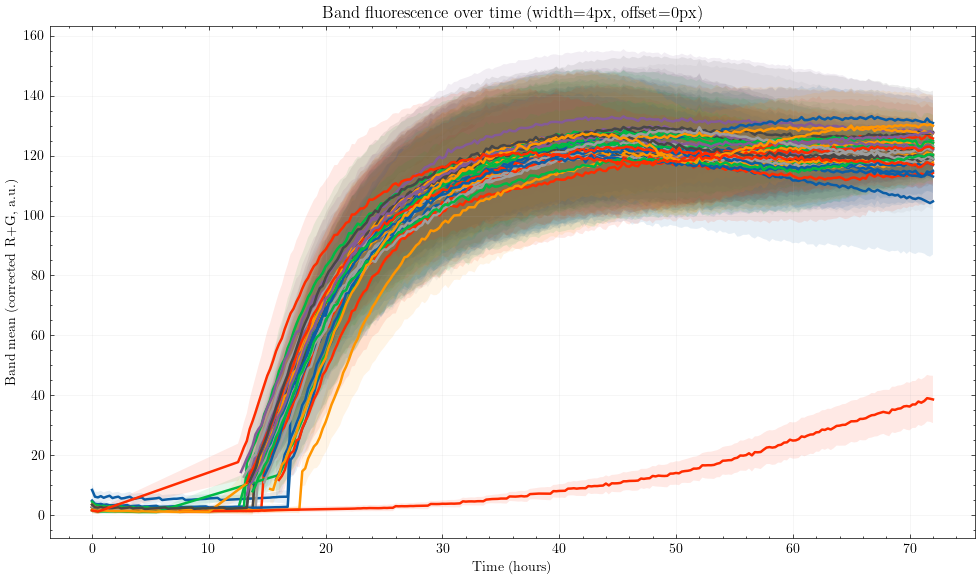

In [151]:
# If each frame is 15 minutes:
dt_seconds = 15 * 60

# Crop the dataframe to use only up to 48 hrs
long_df_truncated = long_df[long_df['frame'] <= (48 * 60 // 15)]  # 48 hrs at 15 min/frame
# Also, find out which ROIs have very low final fluorescence and exclude them (lower than 100 a.u. at 48 hrs)
final_time = long_df['frame'].max()
final_values = long_df[(long_df['frame'] == final_time) & (~long_df['skipped'])]

# Save path for plots

SAVE_PATH = SAVE_PATH_FIGURES

# Plot all ROIs with +/-1 SD shading, smoothed with a 5-frame rolling median
plot_band_timecourses(
    long_df,
    rois=None,                # all
    dt_seconds=dt_seconds,    # show hours on x-axis
    show_std=True,
    smooth_window=None,
    ylim=None,
    save_path=str(SAVE_PATH_FIGURES / f"{tl_code}_band_timecourses.png"),
    title=None
)

# Or just a few ROIs:
#plot_band_timecourses(long_df, rois=[1, 5, 12], dt_seconds=dt_seconds, show_std=True)





In [152]:
#define the inputs
channel = 'wRG'
threshold = 10

# get the values
cont_frames, cent_frames, areas_frames = flua.get_all_contours(rois, channel, threshold, frames = None, bin_value = 1)

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29


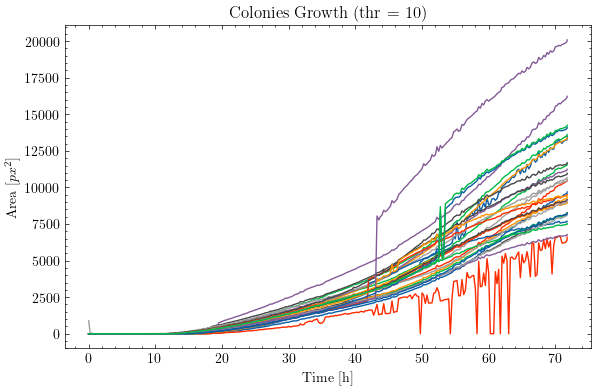

In [153]:
areas_frames_mm = {}
plt.figure(figsize=set_size('thesis', fraction=1.15))
for roi in rois.values():
    # compute the converted values
    areas_frames_mm[roi.id] = np.array(areas_frames[roi.id])

    #plot them
    plt.plot(roi.times['W'],areas_frames_mm[roi.id], label = f'col {roi.id}')

plt.xlabel('Time [h]')
plt.ylabel('Area [$px^2$]')
plt.title(f'Colonies Growth (thr = {threshold})')

# Save the growth plot
plt.savefig(f"{tl_code}_colony_growth.png", dpi=300)
plt.savefig(f"{tl_code}_colony_growth.pdf")

In [154]:
def final_fluorescence_per_roi(long_df: pd.DataFrame,
                               use_column: str = "band_mean_corr",
                               prefer_last_valid: bool = True) -> pd.DataFrame:
    """
    For each ROI, return its 'final' fluorescence.
    If prefer_last_valid=True, we take the last row where `skipped==False` and value is finite.
    Otherwise we take the last row (which might be NaN).
    Returns: DataFrame [ROI, final_value]
    """
    out = []
    # Ensure frames sorted within each ROI
    for roi, sub in long_df.groupby("ROI"):
        sub = sub.sort_values("frame")
        vals = sub[use_column].to_numpy(dtype=float)
        m_valid = np.isfinite(vals) & (~sub.get("skipped", pd.Series(False, index=sub.index)).to_numpy(bool))
        if prefer_last_valid and m_valid.any():
            idx = np.where(m_valid)[0][-1]
            out.append({"ROI": roi, "final_value": float(vals[idx])})
        else:
            # last row regardless of validity
            val = vals[-1] if len(vals) else np.nan
            out.append({"ROI": roi, "final_value": (float(val) if np.isfinite(val) else np.nan)})
    return pd.DataFrame(out)

def heatmap_voronoi_vs_final(
    long_df: pd.DataFrame,
    rois_df: pd.DataFrame,
    pixel_um: float = None,           # if provided, convert area to µm²
    use_column: str = "band_mean_corr",
    nbins_x: int = 30,
    nbins_y: int = 30,
    logx: bool = False,
    logy: bool = False,
    overlay_points: bool = True,
    overlay_fit: bool = True,
    cmap: str = "viridis",
    title: str = "Voronoi area vs final fluorescence (heatmap)",
    save_fig_path: str = None
):
    """
    Builds a 2D histogram heatmap of Voronoi area (x) vs final fluorescence (y) across ROIs.
    Prints Pearson/Spearman correlations and overlays optional scatter + linear fit.
    """
    # 1) final fluorescence per ROI
    finals = final_fluorescence_per_roi(long_df, use_column=use_column, prefer_last_valid=True)

    # 2) Voronoi area
    area_df = rois_df[["ROI", "Voronoi_area_px"]].copy()
    if pixel_um is not None:
        area_df["Voronoi_area_um2"] = area_df["Voronoi_area_px"].astype(float) * (pixel_um**2)
        xcol = "Voronoi_area_um2"; xlab = "Voronoi area (µm²)"
    else:
        xcol = "Voronoi_area_px"; xlab = "Voronoi area (px²)"

    # 3) merge + clean
    m = pd.merge(area_df, finals, on="ROI", how="inner")
    m = m.replace([np.inf, -np.inf], np.nan).dropna(subset=[xcol, "final_value"])
    if m.empty:
        print("No valid ROI rows with both Voronoi area and final fluorescence.")
        return m

    X = m[xcol].to_numpy(dtype=float)
    Y = m["final_value"].to_numpy(dtype=float)

    # 4) plot heatmap (2D histogram)
    fig, ax = plt.subplots(figsize=(7.5, 6))
    # define binning
    xbins = nbins_x
    ybins = nbins_y
    if logx:
        # log bins for X
        x_min = np.nanmin(X[X>0]); x_max = np.nanmax(X)
        xedges = np.geomspace(x_min, x_max, xbins+1)
    else:
        xedges = xbins
    if logy:
        # log bins for Y (guard against zeros)
        y_pos = Y[Y>0]
        if y_pos.size == 0:
            logy = False  # fallback to linear if no positive values
            yedges = ybins
        else:
            y_min = np.nanmin(y_pos); y_max = np.nanmax(Y)
            yedges = np.geomspace(y_min, y_max, ybins+1)
    else:
        yedges = ybins

    h = ax.hist2d(X, Y, bins=[xedges, yedges], cmap=cmap)
    cbar = plt.colorbar(h[3], ax=ax)
    cbar.set_label("Count (colonies)")

    ax.set_xlabel(xlab)
    ax.set_ylabel(f"Final fluorescence ({use_column})")
    if logx: ax.set_xscale("log")
    if logy: ax.set_yscale("log")
    ax.set_title(title)
    ax.grid(alpha=0.2)

    # 5) optional: overlay raw points (faint) to see outliers
    if overlay_points:
        ax.scatter(X, Y, s=12, c="white", alpha=0.35, edgecolors="none")

    # 6) optional: simple linear fit (on finite values)
    if overlay_fit:
        ok = np.isfinite(X) & np.isfinite(Y)
        if ok.sum() >= 2:
            # For log axes, fit in log-space to draw a straight line visually
            if logx and logy:
                px = np.polyfit(np.log10(X[ok]), np.log10(Y[ok]), 1)
                xx = np.linspace(np.nanmin(X[ok]), np.nanmax(X[ok]), 200)
                yy = 10**(px[1] + px[0]*np.log10(xx))
            elif logx and not logy:
                px = np.polyfit(np.log10(X[ok]), Y[ok], 1)
                xx = np.linspace(np.nanmin(X[ok]), np.nanmax(X[ok]), 200)
                yy = px[1] + px[0]*np.log10(xx)
            elif not logx and logy:
                px = np.polyfit(X[ok], np.log10(Y[ok]), 1)
                xx = np.linspace(np.nanmin(X[ok]), np.nanmax(X[ok]), 200)
                yy = 10**(px[1] + px[0]*xx)
            else:
                px = np.polyfit(X[ok], Y[ok], 1)
                xx = np.linspace(np.nanmin(X[ok]), np.nanmax(X[ok]), 200)
                yy = px[1] + px[0]*xx
            ax.plot(xx, yy, color="white", lw=2, alpha=0.7)

    plt.tight_layout()
    if save_fig_path:
        plt.savefig(save_fig_path, dpi=200)
    plt.show()

    # 7) quick correlations
    def _pearson(a, b):
        if np.sum(np.isfinite(a) & np.isfinite(b)) < 2: return np.nan
        return float(np.corrcoef(a[np.isfinite(a) & np.isfinite(b)],
                                 b[np.isfinite(a) & np.isfinite(b)])[0,1])
    def _spearman(a, b):
        if np.sum(np.isfinite(a) & np.isfinite(b)) < 2: return np.nan
        ar = pd.Series(a).rank().to_numpy()
        br = pd.Series(b).rank().to_numpy()
        msk = np.isfinite(ar) & np.isfinite(br)
        return float(np.corrcoef(ar[msk], br[msk])[0,1])

    print(f"Pearson r:  { _pearson(X, Y):.3f}")
    print(f"Spearman ρ: { _spearman(X, Y):.3f}")

    return m

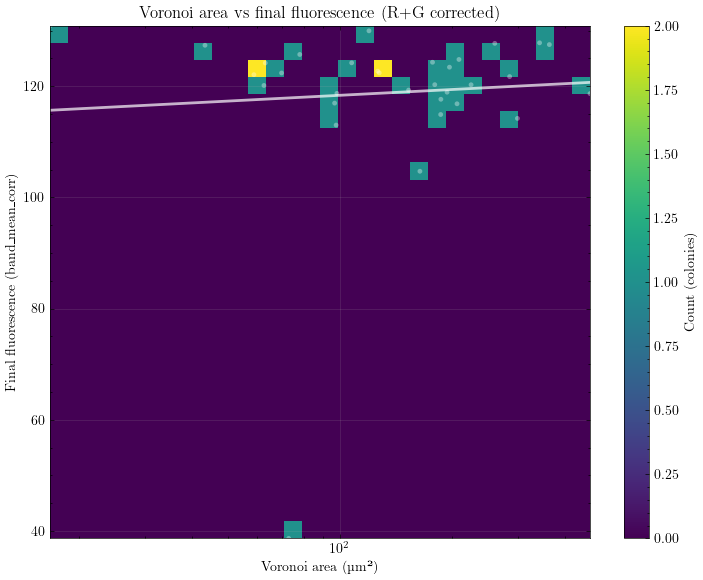

Pearson r:  0.126
Spearman ρ: -0.063


In [144]:
# optional: convert area to µm² if you want physical units
pixel_um = 0.036  # your calibration

_ = heatmap_voronoi_vs_final(
    long_df=long_df,
    rois_df=new_rois_df,        # must contain ['ROI','Voronoi_area_px']
    pixel_um=pixel_um,          # or None to keep px²
    use_column="band_mean_corr",
    nbins_x=30,
    nbins_y=30,
    logx=True, logy=False,     # set True if area / fluorescence spans orders of magnitude
    overlay_points=True,
    overlay_fit=True,
    cmap="viridis",
    title="Voronoi area vs final fluorescence (R+G corrected)"
)


### 3.8 Fluorescence accumulation rates by time window

In [155]:
import numpy as np
import pandas as pd
from itertools import combinations

# --- core OLS slope with R² ---
def _ols_slope_r2(t, y):
    """
    t, y: 1D float arrays (>=2 points). Returns slope (/hour), intercept, R².
    """
    t = np.asarray(t, float)
    y = np.asarray(y, float)
    if t.size < 2 or np.allclose(t, t[0]) or np.allclose(y, y[0]):
        return np.nan, np.nan, np.nan
    # degree-1 polyfit
    p = np.polyfit(t, y, 1)
    slope, intercept = p[0], p[1]
    yhat = slope * t + intercept
    ss_res = np.sum((y - yhat)**2)
    ss_tot = np.sum((y - np.mean(y))**2)
    r2 = np.nan if ss_tot == 0 else (1.0 - ss_res/ss_tot)
    return float(slope), float(intercept), float(r2)

# --- optional robust slope: Theil–Sen (median of pairwise slopes) ---
def _theil_sen_slope(t, y):
    """
    Median slope over all point pairs; intercept as median(y - slope*t).
    Works well for small windows (<= ~20 points).
    """
    t = np.asarray(t, float)
    y = np.asarray(y, float)
    if t.size < 2:
        return np.nan, np.nan
    slopes = []
    for i, j in combinations(range(len(t)), 2):
        dt = t[j] - t[i]
        if dt != 0:
            slopes.append((y[j] - y[i]) / dt)
    if not slopes:
        return np.nan, np.nan
    slope = float(np.median(slopes))
    intercept = float(np.median(y - slope * t))
    return slope, intercept

def compute_window_slopes(
    long_df: pd.DataFrame,
    use_column: str = "band_mean_corr",
    windows_hours = ((16,20),(24,28),(32,36),(44,48)),
    frame_period_minutes: float = 15.0,   # 1 frame every 15 min
    min_points_per_window: int = 4,       # need at least 1 hr worth of frames (4 pts)
    robust: bool = False                  # True -> Theil–Sen slope, else OLS
):
    """
    Returns:
      wide_df: one row per ROI with columns:
               slope_16_20, r2_16_20, n_16_20, ... (one triplet per window)
      long_df_out: one row per (ROI, window_label) with slope, r2, n
    """
    # time per frame in hours
    dt_h = frame_period_minutes / 60.0   # 0.25 for 15 min
    # precompute per-row time in hours
    if "frame" not in long_df.columns:
        raise ValueError("long_df must contain a 'frame' column (0-based).")
    long_df = long_df.copy()
    long_df["t_hours"] = long_df["frame"].astype(float) * dt_h

    # window labels
    labels = [f"{a}_{b}h" for (a,b) in windows_hours]

    recs_long = []
    # group by ROI
    for roi, sub in long_df.groupby("ROI"):
        sub = sub.sort_values("t_hours")
        t_all = sub["t_hours"].to_numpy(float)
        y_all = sub[use_column].to_numpy(float)
        skip = sub.get("skipped", pd.Series(False, index=sub.index)).to_numpy(bool)

        for (a,b), label in zip(windows_hours, labels):
            m = (t_all >= a) & (t_all <= b) & np.isfinite(y_all) & (~skip)
            t_win = t_all[m]; y_win = y_all[m]
            n = int(t_win.size)

            if n >= min_points_per_window:
                if robust:
                    slope, intercept = _theil_sen_slope(t_win, y_win)
                    # R² for Theil–Sen (just for diagnostics)
                    if np.isfinite(slope):
                        yhat = slope * t_win + (np.median(y_win - slope*t_win))
                        ss_res = np.sum((y_win - yhat)**2)
                        ss_tot = np.sum((y_win - np.mean(y_win))**2)
                        r2 = np.nan if ss_tot == 0 else (1.0 - ss_res/ss_tot)
                    else:
                        r2 = np.nan
                else:
                    slope, intercept, r2 = _ols_slope_r2(t_win, y_win)
            else:
                slope = np.nan; r2 = np.nan

            recs_long.append({
                "ROI": roi,
                "window": label,
                "start_h": a, "end_h": b,
                "slope_per_hour": float(slope) if np.isfinite(slope) else np.nan,
                "R2": float(r2) if np.isfinite(r2) else np.nan,
                "n_points": n
            })

    long_df_out = pd.DataFrame.from_records(recs_long)

    # wide view: columns per window
    wide_parts = []
    for label in labels:
        block = (long_df_out[long_df_out["window"] == label]
                 .pivot(index="ROI", columns="window", values="slope_per_hour")
                 .rename(columns={label: f"slope_{label}"}))
        # add R2 and n
        r2_block = (long_df_out[long_df_out["window"] == label]
                    .pivot(index="ROI", columns="window", values="R2")
                    .rename(columns={label: f"r2_{label}"}))
        n_block = (long_df_out[long_df_out["window"] == label]
                   .pivot(index="ROI", columns="window", values="n_points")
                   .rename(columns={label: f"n_{label}"}))
        wide_parts.append(block)
        wide_parts.append(r2_block)
        wide_parts.append(n_block)

    wide_df = pd.concat(wide_parts, axis=1).reset_index()

    return wide_df, long_df_out

In [156]:
# Choose which fluorescence metric to use
USE_COL = "band_mean_corr"   # or "mean_rg8_bgsub", etc.

wide_rates, long_rates = compute_window_slopes(
    long_df=long_df,
    use_column=USE_COL,
    windows_hours=((12,16),(16,20),(20,24),(24,28),(30,34),(34,40), (40, 44), (44,48), (48,52), (52,56), (56,60), (60,64), (64,68), (68,72)),
    frame_period_minutes=15.0,
    min_points_per_window=4,  # require at least 4 samples in the window
    robust=False              # set True to use Theil–Sen
)

print(wide_rates.head())
print(long_rates.head())

window  ROI  slope_12_16h  r2_12_16h  n_12_16h  slope_16_20h  r2_16_20h  \
0         1      0.208100   0.988909        17     15.044646   0.867700   
1         2      9.871980   0.990933        13      8.818775   0.995294   
2         3     12.492439   0.876172        10      9.738916   0.995575   
3         4      6.528398   0.739730        17      9.249540   0.998179   
4         5     10.855236   0.952344        17      9.218780   0.989955   

window  n_16_20h  slope_20_24h  r2_20_24h  n_20_24h  ...  n_56_60h  \
0             17      5.919333   0.979560        17  ...        17   
1             17      5.020606   0.987296        17  ...        17   
2             17      5.303974   0.987013        17  ...        17   
3             17      5.711116   0.987064        17  ...        17   
4             17      6.195240   0.994745        17  ...        17   

window  slope_60_64h  r2_60_64h  n_60_64h  slope_64_68h  r2_64_68h  n_64_68h  \
0          -0.526320   0.846138        17     -0

In [157]:
def overlay_voronoi_from_values_simple(
    raw_img,
    rois_df,                  # has ["ROI", "Voronoi_WKT"] or ["Voronoi_polygon"]
    values_df,                # has ["ROI", value_col]
    value_col="value",
    cmap_name="coolwarm",
    alpha=0.55,
    vmin=None, vmax=None,     # if None, use exact min/max of this values_df
    robust=None,              # e.g., (2,98) to clip per-call outliers; ignored if vmin/vmax set
    symmetric=False,          # if True, center on 0 with symmetric min/max
    draw_edges=True,
    edge_color=(255,255,255),
    edge_thickness=1,
    clip_mask=None,
    save_path=None
):
    H, W = raw_img.shape[:2]
    base_bgr = cv2.cvtColor(raw_img, cv2.COLOR_GRAY2BGR) if raw_img.ndim == 2 else raw_img.copy()

    # --- merge polygons with values
    poly_col = "Voronoi_polygon" if "Voronoi_polygon" in rois_df.columns else "Voronoi_WKT"
    df = rois_df[["ROI", poly_col]].merge(values_df[["ROI", value_col]], on="ROI", how="left")
    vals = df[value_col].to_numpy(float)
    finite = np.isfinite(vals)
    if not finite.any():
        raise ValueError("No finite values to colorize.")

    # --- decide normalization range
    if (vmin is None) or (vmax is None):
        if robust is not None:
            vlo = float(np.percentile(vals[finite], robust[0]))
            vhi = float(np.percentile(vals[finite], robust[1]))
        else:
            vlo = float(np.nanmin(vals))
            vhi = float(np.nanmax(vals))
        if symmetric:
            M = max(abs(vlo), abs(vhi)); M = M if M > 0 else 1e-12
            vmin, vmax = -M, M
        else:
            vmin, vmax = vlo, vhi
    vmax = max(vmax, vmin + 1e-12)  # guard degenerate range
    norm = mcolors.Normalize(vmin=vmin, vmax=vmax, clip=True)
    cmap = cm.get_cmap(cmap_name, 256)

    # --- paint overlay (convert RGB -> BGR!)
    overlay = np.zeros((H, W, 3), dtype=np.uint8)
    alpha_mask = np.zeros((H, W), dtype=np.uint8)

    def _poly_to_mask(poly_like):
        poly = wkt.loads(poly_like) if isinstance(poly_like, str) else poly_like
        return poly_to_mask_cv(poly, (H, W))

    for _, row in df.iterrows():
        v = row[value_col]
        if not np.isfinite(v):
            continue
        mask = _poly_to_mask(row[poly_col])
        if clip_mask is not None:
            mask &= clip_mask
        if not mask.any():
            continue

        rgb = np.array(cmap(norm(v))[:3], dtype=float)      # 0..1, RGB
        bgr = (rgb[::-1] * 255.0 + 0.5).astype(np.uint8)    # <-- swap channels here
        overlay[mask] = bgr
        alpha_mask[mask] = 1

    # --- alpha blend
    out = base_bgr.astype(np.float32)
    idx = alpha_mask.astype(bool)
    if idx.any():
        out[idx] = (1.0 - alpha) * out[idx] + alpha * overlay[idx].astype(np.float32)
    out = np.clip(out, 0, 255).astype(np.uint8)

    # --- optional edges
    if draw_edges:
        for _, row in df.iterrows():
            poly_like = row[poly_col]
            poly = wkt.loads(poly_like) if isinstance(poly_like, str) else poly_like
            if poly.is_empty:
                continue
            x, y = poly.exterior.xy
            pts = np.round(np.column_stack([x, y])).astype(np.int32).reshape(-1, 1, 2)
            pts[:, 0, 0] = np.clip(pts[:, 0, 0], 0, W-1)
            pts[:, 0, 1] = np.clip(pts[:, 0, 1], 0, H-1)
            if pts.shape[0] >= 3:
                cv2.polylines(out, [pts], True, edge_color, edge_thickness, lineType=cv2.LINE_AA)

    if save_path:
        cv2.imwrite(save_path, out)

    # attach colormap info for the colorbar
    df_map = df[["ROI", value_col]].copy()
    df_map.attrs["norm"] = norm
    df_map.attrs["cmap_name"] = cmap_name
    return out, df_map

In [158]:
def show_overlay_with_colorbar(bgr_img, df_map, label="Final fluorescence"):
    import matplotlib.pyplot as plt
    import matplotlib as mpl

    norm = df_map.attrs["norm"]
    cmap_name = df_map.attrs["cmap_name"]
    cmap = cm.get_cmap(cmap_name)

    fig, ax = plt.subplots(figsize=(8, 8))
    ax.imshow(cv2.cvtColor(bgr_img, cv2.COLOR_BGR2RGB))
    ax.axis("off")

    sm = mpl.cm.ScalarMappable(cmap=cmap, norm=norm)
    sm.set_array([])
    cbar = fig.colorbar(sm, ax=ax, fraction=0.046, pad=0.04)
    cbar.set_label(label)
    plt.tight_layout()
    plt.show()

In [159]:
output_csv_rates = os.path.join(SAVE_PATH, f"{tl_code}_FLUO_VORONOI_FLUO_RATES_DIFF_TPOINTS.csv")
long_rates.to_csv(output_csv_rates, index=False)

In [48]:
long_rates

,ROI,window,start_h,end_h,slope_per_hour,R2,n_points
0,1,12_16h,12,16,0.131809,0.960223,17
1,1,16_20h,16,20,10.424753,0.866509,17
2,1,20_24h,20,24,4.260305,0.994399,17
3,1,24_28h,24,28,2.874154,0.986953,17
4,1,30_34h,30,34,1.106806,0.937818,17
...,...,...,...,...,...,...,...
3579,256,52_56h,52,56,-0.860236,0.858609,17
3580,256,56_60h,56,60,-0.788364,0.902077,17
3581,256,60_64h,60,64,-0.738523,0.935197,17
3582,256,64_68h,64,68,-0.673696,0.859438,17


In [160]:
import math

/var/folders/y4/53g_wzsn39g0530cvlf_kwv40000gn/T/ipykernel_77385/1810820482.py:27: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap("rainbow")
/var/folders/y4/53g_wzsn39g0530cvlf_kwv40000gn/T/ipykernel_77385/228514477.py:43: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap(cmap_name, 256)
/var/folders/y4/53g_wzsn39g0530cvlf_kwv40000gn/T/ipykernel_77385/228514477.py:43: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cm

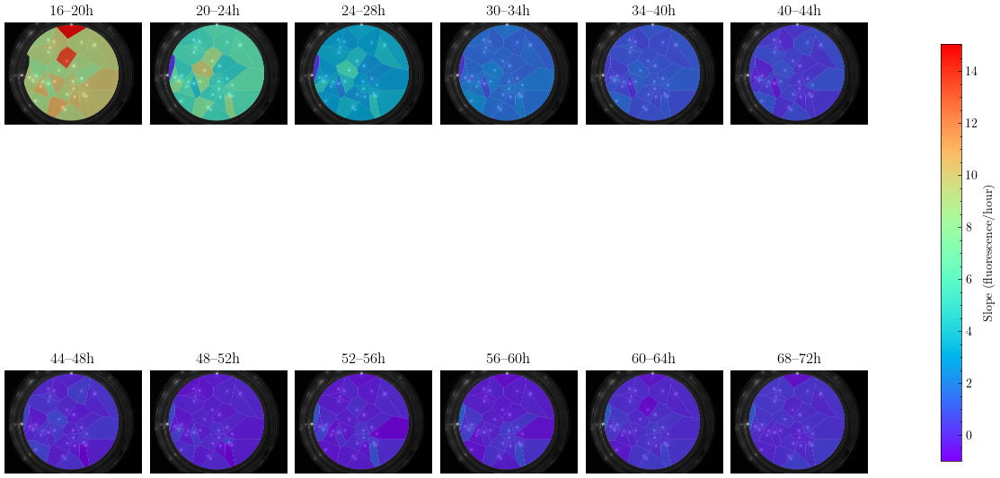

In [163]:
import matplotlib.colors as mcolors
from matplotlib import cm

# 1) global limits across all windows
all_slopes = long_rates["slope_per_hour"].to_numpy(float)
finite = np.isfinite(all_slopes)
gmin = float(np.min(all_slopes[finite])); gmax = float(np.max(all_slopes[finite]))

# optional: symmetric around 0 (nice with diverging colormap)
USE_SYMMETRIC = False
if USE_SYMMETRIC:
    M = max(abs(gmin), abs(gmax)); M = M if M > 0 else 1e-12
    gmin, gmax = -M, M

# 2) pick a raw image to paint under the overlays
raw_img8 = read_rg_sum_uint8(corrected_names[192], normalize='dtype')

to_plot = ["16_20h", "20_24h", "24_28h", "30_34h", "34_40h", "40_44h", "44_48h", "48_52h", "52_56h", "56_60h", "60_64h", "68_72h"]

n = len(to_plot)
rows = 2; cols = math.ceil(n/rows)

fig, axes = plt.subplots(rows, cols, figsize=(12, 10))
axes = axes.ravel()

norm = mcolors.Normalize(vmin=gmin, vmax=gmax)
cmap = cm.get_cmap("rainbow")

for ax, label in zip(axes, to_plot):
    vals = (long_rates[long_rates["window"] == label]
            [["ROI","slope_per_hour"]].rename(columns={"slope_per_hour":"value"}))

    overlay_bgr, _ = overlay_voronoi_from_values_simple(
        raw_img=raw_img8,
        rois_df=new_rois_df,
        values_df=vals,
        value_col="value",
        cmap_name="rainbow",
        alpha=0.75,
        vmin=gmin, vmax=gmax,    # shared global scale
        robust=(5, 95),          # ignore extreme outliers
        draw_edges=True
    )

    ax.imshow(cv2.cvtColor(overlay_bgr, cv2.COLOR_BGR2RGB))
    ax.set_title(label.replace("_","–"))
    ax.axis("off")

# Shared colorbar
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm); sm.set_array([])
cbar = fig.colorbar(sm, ax=axes[:n], fraction=0.025, pad=-0.25)
cbar.set_label("Slope (fluorescence/hour)")
plt.tight_layout()

# Save the figure in the current directory
plt.savefig(f"{tl_code}_voronoi_slope_overlays.png", dpi=300)
# Also as PDF
plt.savefig(f"{tl_code}_voronoi_slope_overlays.pdf")
plt.show()


### 3.9 Single-colony kymograph (registered frames)

In [108]:
import numpy as np


def _roi_geometry_for_kymograph(roi_id, new_rois_df):
    row = new_rois_df.loc[new_rois_df["ROI"] == roi_id]
    if row.empty:
        raise KeyError(f"ROI {roi_id} not found in new_rois_df")
    mask_full = np.asarray(row.iloc[0]["Colony_mask"], dtype=bool)
    ys, xs = np.where(mask_full)
    if ys.size == 0:
        raise ValueError(f"ROI {roi_id} mask is empty")
    r0, r1, c0, c1 = ys.min(), ys.max(), xs.min(), xs.max()
    mask_crop = mask_full[r0:r1+1, c0:c1+1]
    ys_rel = ys - r0
    xs_rel = xs - c0
    cy = ys_rel.mean()
    cx = xs_rel.mean()
    yy, xx = np.indices(mask_crop.shape)
    r_map = np.hypot(yy - cy, xx - cx).astype(np.float32)
    r_max = float(r_map[mask_crop].max())
    roi_entry = {
        "bbox": (int(r0), int(r1), int(c0), int(c1)),
        "mask_bool": mask_crop,
        "mask_u8": (mask_crop.astype(np.uint8) * 255),
    }
    return roi_entry, r_map, r_max


import cv2


def _bg_mean_for_frame(rg_img8, agar_inside_mask, union_mask_bool):
    """Mean background on agar outside colonies (uint8 image)."""
    bg_mask_bool = np.asarray(agar_inside_mask, dtype=bool) & (~np.asarray(union_mask_bool, dtype=bool))
    if not np.any(bg_mask_bool):
        return float('nan')
    mask_u8 = (bg_mask_bool.astype(np.uint8) * 255)
    mu, _ = cv2.meanStdDev(rg_img8, mask=mask_u8)
    return float(mu[0, 0])


In [109]:
def compute_roi_kymograph(
    roi_id,
    corrected_names,
    new_rois_df,
    agar_inside_mask,
    union_mask_bool,
    frame_period_minutes=15.0,
    bin_px=2,
    pixel_um=None,
    compute_contour_radius=False,
    skip_margin=0,
):
    """Return dict with time_h, r_mid_px/um, kymograph, and optional contour radius."""
    roi_entry, r_map, r_max = _roi_geometry_for_kymograph(roi_id, new_rois_df)
    bins = np.arange(0.0, r_max + float(bin_px) + 1e-6, float(bin_px))
    if bins.size < 2:
        raise ValueError("Bin settings produce fewer than 2 bins")
    r_mid = 0.5 * (bins[:-1] + bins[1:])
    n_bins = r_mid.size
    n_frames = len(corrected_names)

    kymo = np.full((n_bins, n_frames), np.nan, np.float32)
    contour_radius = np.full(n_frames, np.nan, np.float32) if compute_contour_radius else None

    agar_inside_mask = np.asarray(agar_inside_mask, dtype=bool)
    union_mask_bool = np.asarray(union_mask_bool, dtype=bool)
    r0, r1, c0, c1 = roi_entry["bbox"]
    roi_mask = roi_entry["mask_bool"]

    for t, path in enumerate(corrected_names):
        rg_img8 = read_rg_sum_uint8(path, normalize='dtype')
        bg_mu = _bg_mean_for_frame(rg_img8, agar_inside_mask, union_mask_bool)

        crop = rg_img8[r0:r1+1, c0:c1+1].astype(np.float32)
        if np.isfinite(bg_mu):
            crop -= float(bg_mu)
            np.maximum(crop, 0.0, out=crop)

        vals = crop[roi_mask]
        radii = r_map[roi_mask]
        idx = np.digitize(radii, bins) - 1
        valid = (idx >= 0) & (idx < n_bins)
        if np.any(valid):
            sums = np.bincount(idx[valid], weights=vals[valid], minlength=n_bins)
            counts = np.bincount(idx[valid], minlength=n_bins)
            with np.errstate(divide='ignore', invalid='ignore'):
                kymo[:, t] = sums / counts
            kymo[counts == 0, t] = np.nan

        if compute_contour_radius:
            cnt, area, _, _, skipped, _ = find_contour_for_roi(
                frame_rg8=rg_img8,
                roi_entry=roi_entry,
                bg_mean=bg_mu,
                skip_margin=skip_margin,
                area_cap=None,
                return_bin=False,
            )
            if (not skipped) and (area is not None) and (area > 0):
                contour_radius[t] = np.sqrt(area / np.pi)

    time_h = np.arange(n_frames, dtype=float) * (frame_period_minutes / 60.0)
    out = {
        "roi_id": roi_id,
        "time_h": time_h,
        "r_mid_px": r_mid,
        "kymo": kymo,
        "bin_px": float(bin_px),
        "frame_period_minutes": float(frame_period_minutes),
        "contour_radius_px": contour_radius,
    }
    if pixel_um is not None:
        out["r_mid_um"] = r_mid * float(pixel_um)
    return out


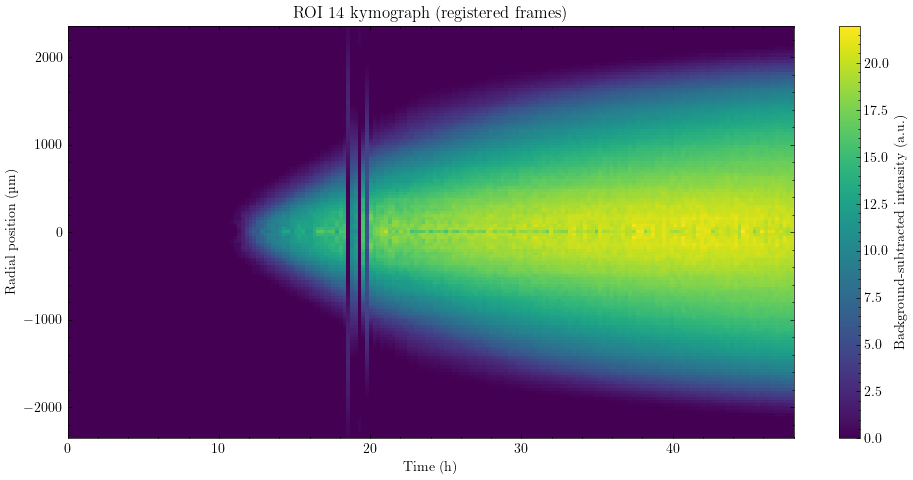

In [117]:
def plot_roi_kymograph(
    kymo_dict,
    pixel_um=None,
    area_radius_px=None,
    contour_radius_px=None,
    cmap="turbo",
    vmax=None,
    title=None,
    save_prefix=None,
    mirror_radius=False,
):
    """Plot radius (rows) vs time (cols) kymograph with optional radius overlays."""
    time_h = kymo_dict["time_h"]
    kymo = kymo_dict["kymo"]
    r_axis = kymo_dict.get("r_mid_um") if (pixel_um is not None and "r_mid_um" in kymo_dict) else kymo_dict["r_mid_px"]

    def _mirror_for_display(mat, r_axis_vals):
        mat_m = np.concatenate([mat[::-1], mat[1:]], axis=0)
        r_m = np.concatenate([-np.asarray(r_axis_vals)[::-1], np.asarray(r_axis_vals)[1:]])
        return mat_m, r_m

    if mirror_radius:
        kymo_plot, r_axis_plot = _mirror_for_display(kymo, r_axis)
        y_label = "Radial position (µm)" if (pixel_um is not None and "r_mid_um" in kymo_dict) else "Radial position (px)"
    else:
        kymo_plot, r_axis_plot = kymo, r_axis
        y_label = "Radius (µm)" if (pixel_um is not None and "r_mid_um" in kymo_dict) else "Radius (px)"

    extent = [time_h[0], time_h[-1], r_axis_plot[0], r_axis_plot[-1]]
    fig, ax = plt.subplots(figsize=(10, 5))
    im = ax.imshow(kymo_plot, aspect='auto', origin='lower', extent=extent, cmap=cmap, vmax=vmax)
    plt.colorbar(im, ax=ax, label="Background-subtracted intensity (a.u.)")
    ax.set_xlabel("Time (h)"); ax.set_ylabel(y_label)
    if title:
        ax.set_title(title)

    def _plot_series(arr, label_text, style='--', color=None):
        arr = np.asarray(arr, dtype=float)
        if arr.size >= time_h.size:
            arr = arr[:time_h.size]
        if pixel_um is not None and "r_mid_um" in kymo_dict:
            arr = arr * float(pixel_um)
        kwargs = {'lw': 1.5, 'label': label_text}
        if color is not None:
            kwargs['color'] = color
            kwargs['linestyle'] = style
        else:
            kwargs['linestyle'] = style
        ax.plot(time_h[:arr.size], arr, **kwargs)
        if mirror_radius:
            m_kwargs = dict(kwargs); m_kwargs['label'] = None
            ax.plot(time_h[:arr.size], -arr, **m_kwargs)

    if area_radius_px is not None:
        _plot_series(area_radius_px, "Area→radius", style='--', color='red')

    if contour_radius_px is not None:
        _plot_series(contour_radius_px, "Contour radius", style='-', color='red')

    if (area_radius_px is not None) or (contour_radius_px is not None):
        ax.legend(loc="upper right")

    plt.tight_layout()
    if save_prefix:
        plt.savefig(f"{save_prefix}.png", dpi=300)
        plt.savefig(f"{save_prefix}.pdf")
    plt.show()

# Example: ROI 0 (first ROI), using px→mm from fp_dataset
roi_id = int(new_rois_df["ROI"].iloc[13])
pixel_um = None
try:
    pixel_um = float(fp_dataset.px_to_mm['mm_px']) * 1000.0
except Exception:
    pixel_um = None

agar_inside_mask = (~agar_mask) if 'agar_mask' in globals() else agar_mask
kymo_data = compute_roi_kymograph(
    roi_id=roi_id,
    corrected_names=corrected_names,
    new_rois_df=new_rois_df,
    agar_inside_mask=agar_inside_mask,
    union_mask_bool=union_once,
    frame_period_minutes=15.0,
    bin_px=1,
    pixel_um=pixel_um,
    compute_contour_radius=False,
    skip_margin=0,
)

area_radius_px = None
if 'long_df' in globals():
    area_series = long_df.loc[long_df['ROI'] == roi_id].sort_values('frame')['colony_area_px']
    if not area_series.empty:
        area_radius_px = np.sqrt(area_series.to_numpy(float) / np.pi)

plot_roi_kymograph(
    kymo_data,
    pixel_um=pixel_um,
    area_radius_px=None,
    contour_radius_px=kymo_data.get('contour_radius_px'),
    cmap="viridis",
    mirror_radius=True,
    title=f"ROI {roi_id} kymograph (registered frames)",
    save_prefix=f"{tl_code}_ROI{roi_id}_kymograph",
)


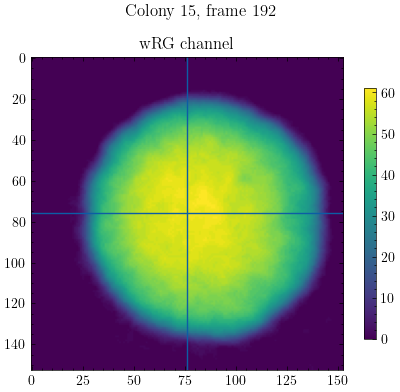

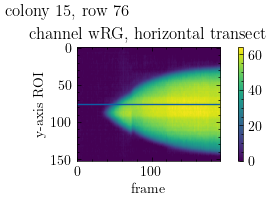

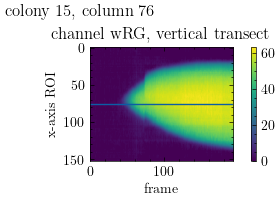

{'row_76': {'wRG': array([[0, 0, 1, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         ...,
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0]], dtype=uint8)},
 'column_76': {'wRG': array([[0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         ...,
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0]], dtype=uint8)}}

In [118]:
col_id = 15
frame_i = -1
flup.plot_roi_frame(rois, col_id, channels = ['wRG'], n_frame = frame_i,
                    yc_line = True, xc_line = True)
# the lines kemograph
flup.roi_kgraph(rois, col_id, ['wRG'], getvalues=True)

### 3.10 Coefficient of Variation across colonies

In [164]:
def cv_of_rates_per_window(
    long_rates: pd.DataFrame,
    value_col: str = "slope_per_hour",
    min_rois: int = 5,
    denom: str = "absmean",
    robust: bool = False,
    eps: float = 1e-9
) -> pd.DataFrame:
    """
    Returns one row per window with: n_rois, mean, std, cv  [+ robust fields]
    """
    df = long_rates[["ROI", "window", value_col]].copy()
    recs = []
    for win, sub in df.groupby("window"):
        v = sub[value_col].to_numpy(float)
        v = v[np.isfinite(v)]
        n = v.size
        if n < min_rois:
            recs.append({"window": win, "n_rois": n, "mean": np.nan, "std": np.nan, "cv": np.nan,
                         **({"median": np.nan, "mad_scaled": np.nan, "cv_mad": np.nan} if robust else {})})
            continue
        mu = float(np.mean(v))
        sd = float(np.std(v, ddof=1)) if n > 1 else 0.0
        denom_val = abs(mu) if denom.lower() == "absmean" else mu
        cv = sd / denom_val if (np.isfinite(denom_val) and abs(denom_val) > eps) else np.nan
        rec = {"window": win, "n_rois": n, "mean": mu, "std": sd, "cv": float(cv)}
        if robust:
            med = float(np.median(v))
            mad = float(np.median(np.abs(v - med)))
            mad_scaled = 1.4826 * mad
            denom_r = abs(med) if denom.lower() == "absmean" else med
            cv_mad = mad_scaled / denom_r if (np.isfinite(denom_r) and abs(denom_r) > eps) else np.nan
            rec.update({"median": med, "mad_scaled": mad_scaled, "cv_mad": float(cv_mad)})
        recs.append(rec)
    out = pd.DataFrame(recs)
    # optional: order naturally by window label if they look like "16_20h" etc.
    try:
        out["start_h"] = out["window"].str.split("_").str[0].str.replace("h","", regex=False).astype(float)
        out = out.sort_values("start_h").drop(columns=["start_h"])
    except Exception:
        pass
    return out

In [165]:
cv_rates_per_window = cv_of_rates_per_window(
    long_rates=long_rates,
    value_col="slope_per_hour",
    min_rois=5,
    denom="absmean",
    robust=True
)
print(cv_rates_per_window)


    window  n_rois      mean       std         cv    median  mad_scaled  \
0   12_16h      29  8.210988  3.565936   0.434288  9.151655    1.064493   
1   16_20h      31  9.716279  1.398930   0.143978  9.416080    0.703033   
2   20_24h      32  5.815012  1.640884   0.282181  5.706262    0.825465   
3   24_28h      32  3.216928  0.853745   0.265391  3.209750    0.512885   
4   30_34h      32  1.611168  0.404604   0.251125  1.595276    0.332471   
5   34_40h      32  0.951925  0.299109   0.314215  0.976888    0.184927   
6   40_44h      32  0.421323  0.368162   0.873823  0.361463    0.383943   
7   44_48h      32 -0.005187  0.352926  68.041996 -0.059973    0.293454   
8   48_52h      32 -0.183771  0.353724   1.924809 -0.245437    0.208377   
9   52_56h      32 -0.107278  0.467057   4.353704 -0.141521    0.392677   
10  56_60h      32 -0.032247  0.456211  14.147452 -0.193884    0.486664   
11  60_64h      32  0.084881  0.364133   4.289916  0.056227    0.291949   
12  64_68h      32  0.114

In [166]:
def plot_per_roi_cv_by_window(long_rates, windows=["12_16h", "16_20h", "20_24h", "24_28h", "30_34h", "34_40h", "40_44h", "44_48h", "48_52h", "52_56h", "56_60h", "60_64h", "64_68h", "68_72h"],
                              value_col="slope_per_hour", metric="cv", denom="absmean"):
    # build ROI×window table of rates
    df = long_rates[["ROI","window",value_col]].copy()
    df = df[df["window"].isin(windows)]
    # compute per-ROI CVs using the helper on a filtered long_rates if you want totals,
    # or draw distributions of raw rates normalized per ROI.
    import matplotlib.pyplot as plt
    groups = [df[df["window"]==w][value_col].to_numpy(float) for w in windows]
    fig, ax = plt.subplots(figsize=set_size(width='thesis', fraction=1.15, subplots=(1,1)))
    ax.violinplot(groups, showmeans=True, showextrema=False)
    ax.set_xticks(range(1,len(windows)+1)); ax.set_xticklabels([w.replace("_","–") for w in windows])
    ax.set_ylabel(f"Rates ({value_col})")
    ax.set_title("Distribution of fluorescence rates per window")
    ax.grid(alpha=0.25)
    plt.tight_layout()
    # save the figure in the current directory
    plt.savefig(f"{tl_code}_voronoi_rates_distribution_per_window.png", dpi=300)
    # also as PDF
    plt.savefig(f"{tl_code}_voronoi_rates_distribution_per_window.pdf")
    plt.show()


/Users/adaravena/miniforge3/envs/pymc_env/lib/python3.10/site-packages/numpy/linalg/linalg.py:2180: RuntimeWarning: invalid value encountered in det
  r = _umath_linalg.det(a, signature=signature)


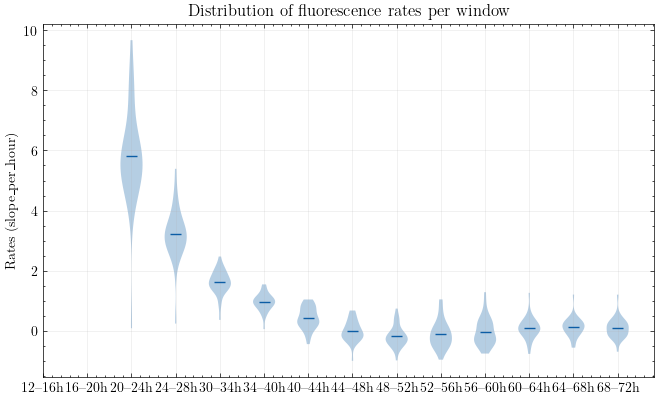

In [167]:
plot_per_roi_cv_by_window(long_rates,
                          windows=["12_16h", "16_20h", "20_24h", "24_28h", "30_34h", "34_40h", "40_44h", "44_48h", "48_52h", "52_56h", "56_60h", "60_64h", "64_68h", "68_72h"],
                          value_col="slope_per_hour", metric="cv", denom="absmean")

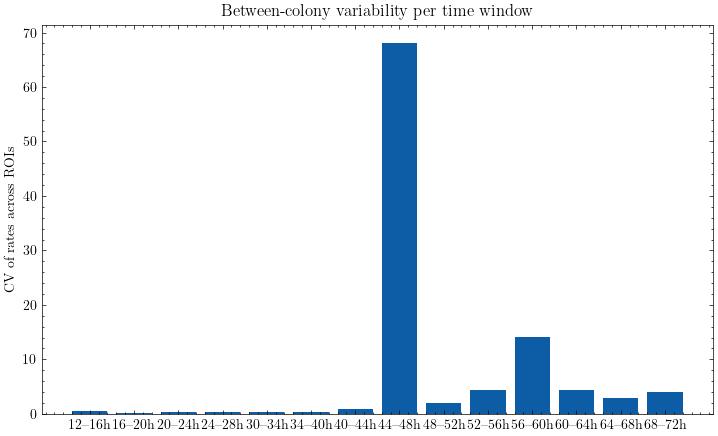

In [169]:
plt.figure(figsize=set_size(width='thesis', fraction=1.25, subplots=(1,1)))
x = [w.replace("_","–") for w in cv_rates_per_window["window"]]
y = cv_rates_per_window["cv"]
plt.bar(x, y)
plt.ylabel("CV of rates across ROIs")
plt.title("Between-colony variability per time window")
plt.tight_layout()
# Save the figure in the current directory
plt.savefig(f"{tl_code}_voronoi_rates_cv_per_window.png", dpi=300)
# Also as PDF
plt.savefig(f"{tl_code}_voronoi_rates_cv_per_window.pdf")
plt.show()

### 3.11 Internal colony heatmap (slope overlays)

In [171]:
def _max_contour_for_window(
    roi_entry,                 # expects keys: 'bbox', and either 'mask_u8' or 'mask_bool'
    frame_ids,                 # indices of frames in this window
    corrected_names,           # list of frame paths
    agar_inside_mask,          # True on agar (inside plate)
    union_mask_bool,           # union of all colonies (boolean HxW)
    skip_margin=0
):
    """
    Returns:
        cnt_crop (Nx2 int array in crop coordinates) or None
    Reuses your find_contour_for_roi + per-frame agar background estimate.
    """
    # Accept either schema; build the flavor find_contour_for_roi expects
    if "mask_u8" in roi_entry:
        roi_fc = {"bbox": roi_entry["bbox"], "mask_u8": roi_entry["mask_u8"]}
    elif "mask_bool" in roi_entry:
        roi_fc = {"bbox": roi_entry["bbox"], "mask_u8": (roi_entry["mask_bool"].astype(np.uint8) * 255)}
    else:
        raise KeyError("roi_entry must contain 'mask_u8' or 'mask_bool'")

    r0, r1, c0, c1 = roi_entry["bbox"]
    best = {"area": -1.0, "cnt_full": None}

    for fid in frame_ids:
        rg_img8 = read_rg_sum_uint8(corrected_names[fid], normalize='dtype')
        # per-frame background on agar outside colonies
        bg_mu = _bg_mean_for_frame(rg_img8, agar_inside_mask, union_mask_bool)

        cnt_full, area, _, _, skipped, _ = find_contour_for_roi(
            frame_rg8=rg_img8,
            roi_entry=roi_fc,
            bg_mean=bg_mu,
            skip_margin=skip_margin,
            area_cap=None,
            return_bin=False
        )
        if skipped or cnt_full is None or area <= 0:
            continue
        if area > best["area"]:
            best["area"] = area
            best["cnt_full"] = cnt_full

    if best["cnt_full"] is None:
        return None  # nothing found this window

    # Convert full-frame contour to crop coordinates (Nx2, x=col, y=row)
    cnt = best["cnt_full"][:, 0, :]            # (N, 2) [x,y]
    cnt_crop = np.column_stack([cnt[:, 0] - c0, cnt[:, 1] - r0]).astype(int)
    return cnt_crop

In [172]:
import numpy as np, cv2, matplotlib.pyplot as plt, math, os  # CHANGED: added os for saving files
from matplotlib import cm
from matplotlib import colors as mcolors

# ---------- helpers (unchanged) ----------
def _bbox_from_bool(mask_bool):
    ys, xs = np.where(mask_bool)
    if ys.size == 0: return None
    return int(ys.min()), int(ys.max()), int(xs.min()), int(xs.max())

def build_roi_cache(rois_df, image_shape, mask_col="Colony_mask"):
    H, W = image_shape
    cache = {}
    for _, row in rois_df.iterrows():
        roi_id = row["ROI"]
        m = np.asarray(row[mask_col], dtype=bool)
        if m.shape != (H, W):
            raise ValueError(f"Mask for ROI={roi_id} has shape {m.shape}, expected {(H, W)}")
        bbox = _bbox_from_bool(m)
        if bbox is None:  # empty
            continue
        r0, r1, c0, c1 = bbox
        crop_mask = m[r0:r1+1, c0:c1+1]
        cache[roi_id] = {"bbox": (r0, r1, c0, c1), "mask_bool": crop_mask}
    return cache

def _frame_indices_for_window(n_frames, dt_min, start_h, end_h):
    """Return inclusive frame indices whose timestamps (idx*dt) lie in [start_h, end_h]."""
    dt_h = dt_min / 60.0
    t = np.arange(n_frames, dtype=float) * dt_h
    return np.where((t >= start_h) & (t <= end_h))[0]

def _bg_mean_for_frame(rg_img8, agar_inside_mask, union_mask_bool):
    bg_mask_bool = agar_inside_mask & (~union_mask_bool)
    if not np.any(bg_mask_bool): return np.nan
    m_u8 = (bg_mask_bool.astype(np.uint8) * 255)
    mu, _ = cv2.meanStdDev(rg_img8, mask=m_u8)
    return float(mu[0,0])

def _pixelwise_slope_roi(roi_entry, frame_ids, corrected_names,
                         agar_inside_mask, union_mask_bool, frame_period_minutes=15.0,
                         clip_nonpositive=True, min_frames=4):
    """
    Vectorized OLS slope per pixel (fluor/hour) inside a single ROI crop.
    Returns slope_map (Hc x Wc, float32) with NaN outside the ROI or if insufficient frames.
    """
    r0, r1, c0, c1 = roi_entry["bbox"]
    mask = roi_entry["mask_bool"]
    Hc, Wc = mask.shape

    # time in hours for chosen frames
    t_h = (np.asarray(frame_ids, dtype=float) * (frame_period_minutes / 60.0))
    T = t_h.size
    slope_map = np.full((Hc, Wc), np.nan, np.float32)
    if T < min_frames:
        return slope_map

    # Precompute t sums for OLS
    N = float(T)
    sum_t = float(np.sum(t_h))
    sum_t2 = float(np.sum(t_h**2))
    denom = N * sum_t2 - (sum_t ** 2)
    if denom <= 0:
        return slope_map

    # Build data cube (Hc x Wc x T) of background-subtracted crops
    Y = np.empty((Hc, Wc, T), np.float32)
    for k, fid in enumerate(frame_ids):
        img = read_rg_sum_uint8(corrected_names[fid], normalize='dtype')  # uint8 HxW
        # per-frame background mean on agar outside colonies
        bg_mu = _bg_mean_for_frame(img, agar_inside_mask, union_mask_bool)
        crop = img[r0:r1+1, c0:c1+1].astype(np.float32)
        if np.isfinite(bg_mu):
            crop -= float(bg_mu)
            if clip_nonpositive:
                np.maximum(crop, 0.0, out=crop)
        Y[:, :, k] = crop

    # OLS slope: slope = (N*sum(t*y) - sum(t)*sum(y)) / denom, all per-pixel
    sum_y  = np.sum(Y, axis=2)
    sum_ty = np.tensordot(Y, t_h, axes=(2,0))  # Hc x Wc
    slope  = (N * sum_ty - sum_t * sum_y) / denom

    # keep only inside ROI; outside -> NaN
    slope_map[mask] = slope[mask].astype(np.float32)
    return slope_map

# (optional) your contour helper stays as-is if you still want outlines
def _max_contour_for_window(
    roi_entry, frame_ids, corrected_names, agar_inside_mask, union_mask_bool, skip_margin=0
):
    if "mask_u8" in roi_entry:
        roi_fc = {"bbox": roi_entry["bbox"], "mask_u8": roi_entry["mask_u8"]}
    elif "mask_bool" in roi_entry:
        roi_fc = {"bbox": roi_entry["bbox"], "mask_u8": (roi_entry["mask_bool"].astype(np.uint8) * 255)}
    else:
        raise KeyError("roi_entry must contain 'mask_u8' or 'mask_bool'")

    r0, r1, c0, c1 = roi_entry["bbox"]
    best = {"area": -1.0, "cnt_full": None}
    for fid in frame_ids:
        rg_img8 = read_rg_sum_uint8(corrected_names[fid], normalize='dtype')
        bg_mu = _bg_mean_for_frame(rg_img8, agar_inside_mask, union_mask_bool)
        cnt_full, area, _, _, skipped, _ = find_contour_for_roi(
            frame_rg8=rg_img8, roi_entry=roi_fc, bg_mean=bg_mu,
            skip_margin=skip_margin, area_cap=None, return_bin=False
        )
        if skipped or cnt_full is None or area <= 0:
            continue
        if area > best["area"]:
            best["area"] = area
            best["cnt_full"] = cnt_full
    if best["cnt_full"] is None:
        return None
    cnt = best["cnt_full"][:, 0, :]
    cnt_crop = np.column_stack([cnt[:, 0] - c0, cnt[:, 1] - r0]).astype(int)
    return cnt_crop

# ------------ NEW: fill the contour into a boolean mask (crop coords) ------------
def _filled_mask_from_contour(cnt_crop: np.ndarray, shape_hw, margin_px: int = 0) -> np.ndarray:
    """
    cnt_crop: Nx2 int array (x,y) in crop coordinates.
    shape_hw: (Hc, Wc) of the crop.
    margin_px: >0 dilate, <0 erode, 0 no change (applied once with an ellipse kernel).
    Returns boolean mask (True inside polygon).
    """
    Hc, Wc = shape_hw
    m = np.zeros((Hc, Wc), dtype=np.uint8)
    if cnt_crop is None or cnt_crop.shape[0] < 3:
        return np.zeros((Hc, Wc), dtype=bool)
    pts = cnt_crop.reshape(-1, 1, 2).astype(np.int32)
    cv2.fillPoly(m, [pts], 255)
    if margin_px != 0:
        k = 2 * abs(margin_px) + 1
        ker = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (k, k))
        if margin_px > 0:
            m = cv2.dilate(m, ker, iterations=1)
        else:
            m = cv2.erode(m, ker, iterations=1)
    return (m > 0)

# ---------------- PLOTTER: use max-contour-as-mask, do NOT draw it ----------------
def plot_single_colony_slope_heatmaps(
    roi_id, windows, corrected_names, new_rois_df, agar_mask, union_mask_bool,
    frame_period_minutes=15.0, cmap="turbo", symmetric=True, alpha=0.80,
    skip_margin=0, contour_margin_px=0,
    save_individual=False, out_dir=None, dpi=200, pad_inches=0.02, transparent=False  # CHANGED: new options to save each axis
):
    """
    For each window:
      • background = raw crop from the LAST frame in the window,
      • overlay = slope heatmap only inside the window's max contour (transparent elsewhere),
      • NO contour drawing,
      • colorbar placed outside on the right.
    """
    # geometry & cache
    H, W = read_rg_sum_uint8(corrected_names[-1], normalize='dtype').shape
    roi_cache = build_roi_cache(new_rois_df, (H, W), mask_col="Colony_mask")
    entry = roi_cache[roi_id]
    r0, r1, c0, c1 = entry["bbox"]
    agar_inside = agar_mask  # True on agar

    n_frames = len(corrected_names)
    maps, frame_lists, base_crops, contour_masks = [], [], [], []

    dt_h = frame_period_minutes / 60.0
    for (a, b) in windows:
        fids = _frame_indices_for_window(n_frames, frame_period_minutes, a, b)

        # slope map over this window (still computed from the ROI crop)
        m = _pixelwise_slope_roi(entry, fids, corrected_names,
                                 agar_inside_mask=agar_inside,
                                 union_mask_bool=union_mask_bool,
                                 frame_period_minutes=frame_period_minutes)
        maps.append(m); frame_lists.append(fids)

        # last raw frame in the window for background
        if fids.size > 0:
            fid_last = int(fids[-1])
        else:
            approx_idx = int(round(b / dt_h))
            fid_last = int(np.clip(approx_idx, 0, n_frames-1))
        img_last = read_rg_sum_uint8(corrected_names[fid_last], normalize='dtype')
        base_crops.append(img_last[r0:r1+1, c0:c1+1])

        # per-window max contour -> filled mask (crop coords)
        cnt_crop = _max_contour_for_window(entry, fids, corrected_names,
                                           agar_inside_mask=agar_inside,
                                           union_mask_bool=union_mask_bool,
                                           skip_margin=skip_margin)
        if cnt_crop is not None:
            cmask = _filled_mask_from_contour(cnt_crop, entry["mask_bool"].shape,
                                              margin_px=contour_margin_px)
        else:
            # fallback to static ROI crop mask if contour not found
            cmask = entry["mask_bool"].copy()
        contour_masks.append(cmask)

    # global color scale across windows for this colony
    finite_vals = [m[np.isfinite(m)] for m in maps if np.isfinite(m).any()]
    all_vals = np.concatenate(finite_vals) if finite_vals else np.array([])
    if all_vals.size == 0:
        raise ValueError("No finite slopes computed for this ROI.")
    if symmetric:
        M = float(np.max(np.abs(all_vals))); vmin, vmax = -M, M
    else:
        vmin, vmax = float(np.min(all_vals)), float(np.max(all_vals))

    # colormap with transparent "bad" (masked) values
    try:
        cmap_obj = cm.get_cmap(cmap).copy()
    except AttributeError:
        cmap_obj = cm.get_cmap(cmap, 256)
    if hasattr(cmap_obj, "set_bad"):
        cmap_obj.set_bad(alpha=0.0)
    else:
        cmap_obj = cmap_obj.with_extremes(bad=(0,0,0,0))

    # layout
    n = len(windows); cols = min(3, n); rows = int(math.ceil(n / cols))
    fig, axes = plt.subplots(rows, cols, figsize=(4*cols, 4*rows), squeeze=False)
    axes = axes.ravel()

    for i, ((a, b), m, bg_crop, cmask) in enumerate(zip(windows, maps, base_crops, contour_masks)):
        ax = axes[i]
        ax.imshow(bg_crop, cmap="gray", interpolation="nearest")

        # mask outside the per-window contour (and any NaNs)
        mask = (~cmask) | (~np.isfinite(m))
        m_show = np.ma.array(m, mask=mask)

        im = ax.imshow(m_show, cmap=cmap_obj, vmin=vmin, vmax=vmax,
                       alpha=alpha, interpolation="nearest")
        ax.set_title(f"{a}–{b} h")
        ax.axis("off")

    for j in range(i+1, rows*cols):
        axes[j].axis("off")

    # colorbar outside (right)
    norm = mcolors.Normalize(vmin=vmin, vmax=vmax)
    sm = cm.ScalarMappable(norm=norm, cmap=cmap_obj); sm.set_array([])
    plt.subplots_adjust(right=0.86)
    cbar_ax = fig.add_axes([0.88, 0.15, 0.02, 0.70])
    cbar = fig.colorbar(sm, cax=cbar_ax)
    cbar.set_label("Slope (fluorescence / hour)")

    # CHANGED: save each individual subplot as PNG and PDF (cropped to axis bbox)
    if save_individual:
        if out_dir is None:
            out_dir = os.path.join(os.getcwd(), f"roi_{roi_id}_windows")
        os.makedirs(out_dir, exist_ok=True)
        fig.canvas.draw()  # ensure positions are finalized
        renderer = fig.canvas.get_renderer()
        used = len(windows)
        for k in range(used):
            ax = axes[k]
            a, b = windows[k]
            bbox = ax.get_tightbbox(renderer)
            bbox_inches = bbox.transformed(fig.dpi_scale_trans.inverted()).expanded(1.01, 1.01)
            base = f"ROI_{roi_id}_window_{a}-{b}h"
            png_path = os.path.join(out_dir, base + ".png")
            pdf_path = os.path.join(out_dir, base + ".pdf")
            # PNG
            fig.savefig(png_path, dpi=dpi, bbox_inches=bbox_inches, pad_inches=pad_inches,
                        facecolor=fig.get_facecolor(), transparent=transparent)
            # PDF
            fig.savefig(pdf_path, dpi=dpi, bbox_inches=bbox_inches, pad_inches=pad_inches,
                        facecolor=fig.get_facecolor(), transparent=transparent)

    # Save the complete figure if desired
    full_png_path = os.path.join(out_dir, f"{true_name}_ROI_{roi_id}_all_windows.png")
    full_pdf_path = os.path.join(out_dir, f"{true_name}_ROI_{roi_id}_all_windows.pdf")
    fig.savefig(full_png_path, dpi=dpi, bbox_inches='tight', pad_inches=pad_inches,
                facecolor=fig.get_facecolor(), transparent=transparent)
    fig.savefig(full_pdf_path, dpi=dpi, bbox_inches='tight', pad_inches=pad_inches,
                facecolor=fig.get_facecolor(), transparent=transparent)
    plt.show()

    return {f"{a}_{b}h": m for (a,b), m in zip(windows, maps)}

/var/folders/y4/53g_wzsn39g0530cvlf_kwv40000gn/T/ipykernel_77385/3315584658.py:211: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap_obj = cm.get_cmap(cmap).copy()


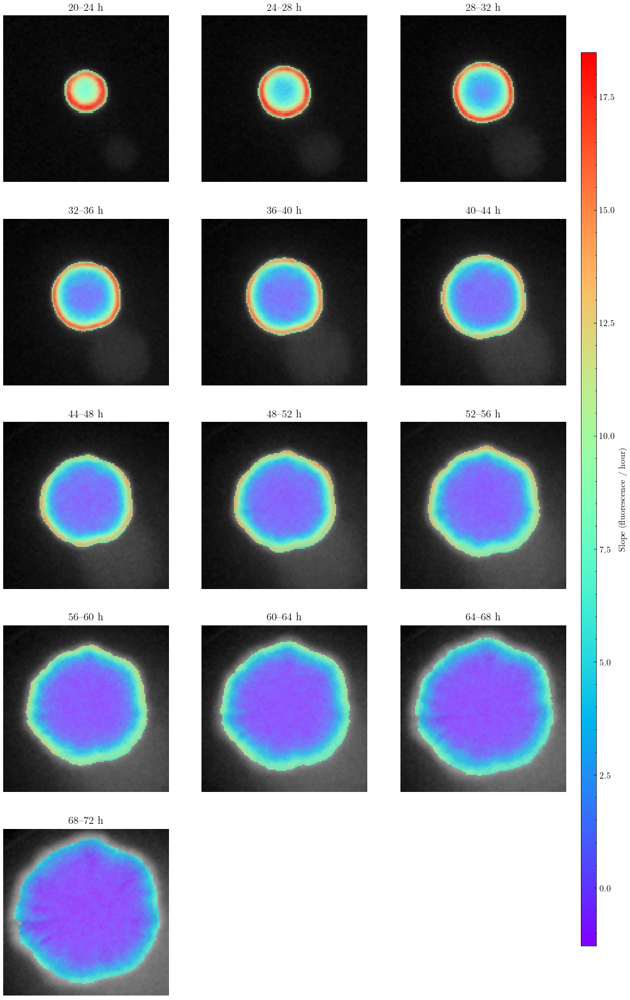

In [174]:
windows = [(20,24),(24,28),(28, 32),(32,36),(36,40),(40,44),(44,48),(48,52),(52,56),(56,60),(60,64),(64,68),(68,72)]
_ = plot_single_colony_slope_heatmaps(
    roi_id=2, #237
    windows=windows,
    corrected_names=corrected_names,
    new_rois_df=new_rois_df,
    agar_mask=agar_mask,
    union_mask_bool=union_once,
    frame_period_minutes=15.0,
    cmap="rainbow",
    symmetric=False,
    alpha=0.75,
    skip_margin=0,
    contour_margin_px=1,
    save_individual=True, out_dir=None, dpi=200, pad_inches=0.02, transparent=False  # CHANGED: new options to save each axis
)

In [ ]:
import numpy as np, cv2, math, os
from matplotlib import cm
from matplotlib import colors as mcolors

def export_colony_slope_movie(
    roi_id,
    windows,                       # list of (start_h, end_h)
    corrected_names,               # list of file paths indexed by frame id
    new_rois_df,
    agar_mask,
    union_mask_bool,
    *,
    frame_period_minutes = 15.0,
    cmap                 = "turbo",
    symmetric            = True,
    alpha                = 0.80,   # overlay alpha in [0,1]
    skip_margin          = 0,
    contour_margin_px    = 0,
    fps                  = 2,      # frames per second in the mp4
    codec                = "mp4v", # try "mp4v"→MPEG-4; if unavailable, try "avc1" or "H264"
    out_path             = None,   # default: ./roi_{roi_id}_windows.mp4
    legend               = True,   # draw a vertical colorbar legend
    title_text           = True,   # write "a–b h" on each frame
    font_scale           = 0.5,    # OpenCV putText scale
    font_thickness       = 1
):
    """
    Build an MP4 movie (one frame per time window) showing:
      • background = raw crop from the LAST frame in each window,
      • overlay    = slope heatmap restricted to the window's max contour (transparent elsewhere),
      • consistent global color scale across all windows.

    Returns: path to the written MP4 and a dict of per-window slope maps.
    Requires the existing helpers: read_rg_sum_uint8, build_roi_cache, _frame_indices_for_window,
    _pixelwise_slope_roi, _max_contour_for_window, _filled_mask_from_contour.
    """

    # ---- geometry & ROI cache (as in your plotter) ----
    H, W = read_rg_sum_uint8(corrected_names[-1], normalize='dtype').shape
    roi_cache = build_roi_cache(new_rois_df, (H, W), mask_col="Colony_mask")
    entry = roi_cache[roi_id]
    r0, r1, c0, c1 = entry["bbox"]
    agar_inside = agar_mask  # True on agar
    n_frames = len(corrected_names)
    dt_h = frame_period_minutes / 60.0

    # ---- compute slope maps, bg crops, and per-window contour masks ----
    maps, base_crops, contour_masks = [], [], []
    for (a, b) in windows:
        fids = _frame_indices_for_window(n_frames, frame_period_minutes, a, b)

        m = _pixelwise_slope_roi(entry, fids, corrected_names,
                                 agar_inside_mask=agar_inside,
                                 union_mask_bool=union_mask_bool,
                                 frame_period_minutes=frame_period_minutes)
        maps.append(m)

        # background: last raw frame in this window (crop)
        if fids.size > 0:
            fid_last = int(fids[-1])
        else:
            approx_idx = int(round(b / dt_h))
            fid_last = int(np.clip(approx_idx, 0, n_frames-1))
        img_last = read_rg_sum_uint8(corrected_names[fid_last], normalize='dtype')
        base_crops.append(img_last[r0:r1+1, c0:c1+1])

        # per-window max contour -> filled mask for cropping region
        cnt_crop = _max_contour_for_window(entry, fids, corrected_names,
                                           agar_inside_mask=agar_inside,
                                           union_mask_bool=union_mask_bool,
                                           skip_margin=skip_margin)
        if cnt_crop is not None:
            cmask = _filled_mask_from_contour(cnt_crop, entry["mask_bool"].shape,
                                              margin_px=contour_margin_px)
        else:
            cmask = entry["mask_bool"].copy()
        contour_masks.append(cmask)

    # ---- global color scale across *all* windows ----
    finite_vals = [m[np.isfinite(m)] for m in maps if np.isfinite(m).any()]
    all_vals = np.concatenate(finite_vals) if finite_vals else np.array([])
    if all_vals.size == 0:
        raise ValueError("No finite slopes computed for this ROI.")
    if symmetric:
        M = float(np.max(np.abs(all_vals)))
        # guard against degenerate range
        if M == 0:
            M = 1e-6
        vmin, vmax = -M, M
    else:
        vmin, vmax = float(np.min(all_vals)), float(np.max(all_vals))
        if vmin == vmax:
            eps = 1e-6
            vmin, vmax = vmin - eps, vmax + eps

    # Matplotlib colormap → we’ll sample it directly for consistent colors
    cmap_obj = cm.get_cmap(cmap)
    def to_rgb_uint8(x01):
        """x01 in [0,1] → uint8 RGB (not BGR)."""
        rgba = cmap_obj(np.clip(x01, 0, 1))
        return (rgba[..., :3] * 255.0 + 0.5).astype(np.uint8)

    # ---- frame composition sizes ----
    Hc, Wc = maps[0].shape
    legend_w = 64 if legend else 0
    margin   = 10 if legend else 0
    canvas_h = Hc
    canvas_w = Wc + (legend_w + margin)

    # ---- Video writer ----
    if out_path is None:
        out_path = os.path.join(os.getcwd(), f"roi_{roi_id}_windows.mp4")
    fourcc = cv2.VideoWriter_fourcc(*codec)
    writer = cv2.VideoWriter(out_path, fourcc, float(fps), (canvas_w, canvas_h))
    if not writer.isOpened():
        raise RuntimeError(
            f"Could not open VideoWriter with codec='{codec}'. "
            f"Try codec='avc1' or 'H264', or ensure your OpenCV/FFmpeg build supports MP4."
        )

    # ---- helpers for drawing text & legend ----
    FONT = cv2.FONT_HERSHEY_SIMPLEX

    def put_text_with_outline(img, text, org, color=(255,255,255), outline=(0,0,0)):
        x, y = org
        # outline
        cv2.putText(img, text, (x, y), FONT, font_scale, outline, font_thickness+1, cv2.LINE_AA)
        # fill
        cv2.putText(img, text, (x, y), FONT, font_scale, color,   font_thickness,   cv2.LINE_AA)

    def fmt_val(v):
        av = abs(v)
        if (1e-2 <= av < 1e4) or v == 0:
            return f"{v:.2f}"
        return f"{v:.2e}"

    # ---- prebuild colorbar legend image (if enabled) ----
    if legend:
        # vertical gradient from vmax (top) to vmin (bottom)
        lin = np.linspace(vmax, vmin, Hc, dtype=np.float32)
        x01 = (lin - vmin) / (vmax - vmin + 1e-12)
        rgb = to_rgb_uint8(x01[:, None])                      # (Hc,1,3) uint8, RGB
        legend_img = np.repeat(rgb, legend_w, axis=1)         # (Hc,legend_w,3) RGB
        # RGB → BGR without negative strides
        legend_img = cv2.cvtColor(legend_img, cv2.COLOR_RGB2BGR)
        # make sure it's contiguous (belt-and-suspenders)
        legend_img = np.ascontiguousarray(legend_img)
        # border
        cv2.rectangle(legend_img, (0, 0), (legend_w - 1, Hc - 1), (0, 0, 0), 1)

    # ---- generate frames ----
    for (a, b), m, bg_crop, cmask in zip(windows, maps, base_crops, contour_masks):
        # base grayscale → 3-channel BGR
        base = bg_crop.copy()
        if base.dtype != np.uint8:
            base = np.clip(base, 0, 255).astype(np.uint8)
        frame_bgr = cv2.cvtColor(base, cv2.COLOR_GRAY2BGR)

        # slope → normalized colormap RGB → BGR
        mask_valid = cmask & np.isfinite(m)
        m_clipped  = np.clip(m, vmin, vmax, out=np.empty_like(m))
        x01        = (m_clipped - vmin) / (vmax - vmin + 1e-12)
        overlay_rgb = to_rgb_uint8(x01)                        # (Hc,Wc,3), RGB
        overlay_bgr = overlay_rgb[:, :, ::-1]                  # RGB→BGR

        # alpha composite only on valid mask
        if np.any(mask_valid):
            a_float = float(alpha)
            inv_a   = 1.0 - a_float
            fb = frame_bgr.astype(np.float32)
            ob = overlay_bgr.astype(np.float32)
            mask3 = mask_valid[..., None]                # (Hc,Wc,1), broadcasts across 3 channels
            blended = inv_a * fb + a_float * ob          # (Hc,Wc,3)
            frame_bgr = np.where(mask3, blended, fb).astype(np.uint8)
        
        # make final canvas (room for legend on right)
        if legend:
            canvas = np.zeros((canvas_h, canvas_w, 3), dtype=np.uint8)
            canvas[:, :Wc, :] = frame_bgr
            # paste legend
            x0 = Wc + margin
            canvas[:, x0:x0+legend_w, :] = legend_img
            # labels
            txt_x = x0 + legend_w + 6
            put_text_with_outline(canvas, fmt_val(vmax), (txt_x, 14))
            put_text_with_outline(canvas, fmt_val(vmin), (txt_x, canvas_h - 6))
            # optionally label units
            put_text_with_outline(canvas, "Slope", (x0, 18))
            put_text_with_outline(canvas, "(fluor/hr)", (x0, 36))
        else:
            canvas = frame_bgr

        # title with window times
        if title_text:
            put_text_with_outline(canvas, f"{a}-{b} h", (8, 18))

        writer.write(np.ascontiguousarray(canvas))

    writer.release()
    return out_path, {f"{a}_{b}h": m for (a,b), m in zip(windows, maps)}

# Generate 1 hour windows from 20 hours to 72 hours
windows = [(i, i + 1) for i in range(20, 71)]

movie_path, slope_maps = export_colony_slope_movie(
    roi_id            = 27,
    windows           = windows,
    corrected_names   = corrected_names,
    new_rois_df       = new_rois_df,
    agar_mask         = agar_mask,
    union_mask_bool   = union_once,
    frame_period_minutes = 15.0,
    cmap              = "rainbow",
    symmetric         = False,
    alpha             = 0.8,
    fps               = 5,
    codec             = "mp4v",
    out_path          = "./{}_roi_27_windows.mp4".format(working_directory.strip('/')),
    legend            = True,
    title_text        = True
)

### 3.12 Radial analysis of fluorescence accumulation rates

In [257]:
def _distance_to_edge_uint8(mask_bool: np.ndarray) -> np.ndarray:
    """
    Distance (in px) from each inside pixel to the mask boundary.
    mask_bool: True inside colony (crop coords). Returns float32 HcxWc (0 at edge).
    """
    if mask_bool is None or not np.any(mask_bool):
        return np.zeros(mask_bool.shape, np.float32)
    m_u8 = (mask_bool.astype(np.uint8) * 255)
    # Distance to background; boundary has 0
    dt = cv2.distanceTransform(m_u8, cv2.DIST_L2, 5)  # float32
    return dt

def _radial_profile_from_slope(
    slope_map: np.ndarray,              # float32 HcxWc (NaN outside ROI)
    contour_mask_bool: np.ndarray,      # True inside per-window max contour
    bin_px: int = 1,                    # radial bin width (pixels)
    smooth_k: int = 5                   # moving-average window on profile (odd)
):
    """
    Returns:
      prof_df: DataFrame with columns ['r_px_mid','r_norm','mean','median','count']
      peak_info: dict with {'r_peak_px','r_half_lo_px','r_half_hi_px','width_px'}
    """
    import pandas as pd

    # distance (px) from edge inward (0 at rim)
    dt = _distance_to_edge_uint8(contour_mask_bool)

    # restrict to: inside contour AND finite slope values
    m_valid = contour_mask_bool & np.isfinite(slope_map)
    if not np.any(m_valid):
        raise ValueError("No valid slope pixels inside the contour mask.")

    r = dt[m_valid]                     # distances
    y = slope_map[m_valid]              # slopes

    # bin edges from 0..rmax in steps of bin_px
    r_max = float(np.max(r))
    edges = np.arange(0.0, r_max + bin_px + 1e-6, float(bin_px))
    if edges.size < 2:
        raise ValueError("Contour too thin for the chosen bin size.")
    idx = np.digitize(r, edges) - 1     # bin indices 0..len(edges)-2

    # aggregate
    nbins = edges.size - 1
    means  = np.full(nbins, np.nan, float)
    medians= np.full(nbins, np.nan, float)
    counts = np.zeros(nbins, int)

    for b in range(nbins):
        sel = (idx == b)
        if np.any(sel):
            vals = y[sel]
            means[b]   = float(np.nanmean(vals))
            medians[b] = float(np.nanmedian(vals))
            counts[b]  = int(sel.sum())

    r_mid = 0.5 * (edges[:-1] + edges[1:])
    r_norm = r_mid / (r_max if r_max > 0 else 1.0)

    # simple moving-average smoothing (odd window)
    def _smooth(arr, k):
        if k is None or k <= 1: return arr
        k = int(k) + (int(k) % 2 == 0)   # make odd
        w = np.ones(k, float) / k
        # same-length output with 'same' convolution; pad at edges
        pad = k // 2
        arr_pad = np.pad(arr, (pad, pad), mode="edge")
        return np.convolve(arr_pad, w, mode="valid")

    prof_mean_s = _smooth(means, smooth_k)

    # peak + FWHM on the smoothed mean profile
    if np.all(~np.isfinite(prof_mean_s)) or np.nanmax(prof_mean_s) <= 0:
        peak_info = {"r_peak_px": np.nan, "r_half_lo_px": np.nan,
                     "r_half_hi_px": np.nan, "width_px": np.nan}
    else:
        y_s = prof_mean_s
        # ignore NaNs at ends
        finite = np.isfinite(y_s)
        if not np.any(finite):
            peak_info = {"r_peak_px": np.nan, "r_half_lo_px": np.nan,
                         "r_half_hi_px": np.nan, "width_px": np.nan}
        else:
            peak_idx = int(np.nanargmax(y_s))
            y_peak   = float(y_s[peak_idx])
            half     = 0.5 * y_peak

            # search left/right crossings
            i_left = peak_idx
            while i_left > 0 and not (y_s[i_left-1] <= half < y_s[i_left]):
                i_left -= 1
            i_right = peak_idx
            while i_right < len(y_s)-1 and not (y_s[i_right] >= half > y_s[i_right+1]):
                i_right += 1

            r_peak_px = float(r_mid[peak_idx])
            r_half_lo = float(r_mid[max(i_left, 0)])
            r_half_hi = float(r_mid[min(i_right, len(r_mid)-1)])
            width_px  = max(0.0, r_half_hi - r_half_lo)
            peak_info = {"r_peak_px": r_peak_px, "r_half_lo_px": r_half_lo,
                         "r_half_hi_px": r_half_hi, "width_px": width_px}

    prof_df = pd.DataFrame({
        "r_px_mid": r_mid,
        "r_norm": r_norm,
        "mean": means,
        "median": medians,
        "count": counts
    })
    return prof_df, peak_info


In [258]:
def radial_profile_growth_band(
    roi_id, windows, corrected_names, new_rois_df, agar_mask, union_mask_bool,
    frame_period_minutes=15.0, bin_px=1, smooth_k=5, contour_margin_px=0,
    pixel_um=None,                  # optionally convert px to µm in printing
    cmap="turbo", alpha=0.75
):
    """
    For each window:
      - compute slope map (fluor/hour),
      - find max contour in that window ⇒ filled mask,
      - compute radial profile (mean slope vs distance from rim),
      - detect active band (peak + FWHM),
      - plot profile and (optional) overlay of band on the raw crop.
    Returns dict per window with slope_map, crop, contour_mask, profile_df, peak_info, band_mask.
    """
    import math
    results = {}

    # geometry & cache
    H, W = read_rg_sum_uint8(corrected_names[-1], normalize='dtype').shape
    roi_cache = build_roi_cache(new_rois_df, (H, W), mask_col="Colony_mask")
    entry = roi_cache[roi_id]
    r0, r1, c0, c1 = entry["bbox"]
    agar_inside = agar_mask

    n_frames = len(corrected_names)
    dt_h = frame_period_minutes / 60.0

    # Gather data per window
    for (a, b) in windows:
        fids = _frame_indices_for_window(n_frames, frame_period_minutes, a, b)

        # slope map (this returns NaN outside the ROI crop)
        slope_map = _pixelwise_slope_roi(entry, fids, corrected_names,
                                         agar_inside_mask=agar_inside,
                                         union_mask_bool=union_mask_bool,
                                         frame_period_minutes=frame_period_minutes)

        # last raw frame in window
        if fids.size > 0:
            fid_last = int(fids[-1])
        else:
            approx_idx = int(round(b / dt_h))
            fid_last = int(np.clip(approx_idx, 0, n_frames-1))
        raw = read_rg_sum_uint8(corrected_names[fid_last], normalize='dtype')
        crop = raw[r0:r1+1, c0:c1+1]

        # per-window max contour → filled mask
        cnt_crop = _max_contour_for_window(entry, fids, corrected_names,
                                           agar_inside_mask=agar_inside,
                                           union_mask_bool=union_mask_bool,
                                           skip_margin=0)
        if cnt_crop is not None:
            contour_mask = _filled_mask_from_contour(cnt_crop, entry["mask_bool"].shape,
                                                     margin_px=contour_margin_px)
        else:
            contour_mask = entry["mask_bool"].copy()

        # profile + band detection
        prof_df, peak = _radial_profile_from_slope(slope_map, contour_mask,
                                                   bin_px=bin_px, smooth_k=smooth_k)

        # optional band mask (FWHM between half-lo and half-hi radii)
        dt = _distance_to_edge_uint8(contour_mask)
        band_mask = (dt >= peak["r_half_lo_px"]) & (dt <= peak["r_half_hi_px"]) & contour_mask

        results[f"{a}_{b}h"] = {
            "slope_map": slope_map, "crop": crop, "contour_mask": contour_mask,
            "profile_df": prof_df, "peak_info": peak, "band_mask": band_mask
        }

    # ---------- plotting (profiles stacked) ----------
    n = len(windows)
    ncols = 2
    nrows = int(np.ceil(n / ncols))
    fig, axes = plt.subplots(nrows, ncols, figsize=(6*ncols, 3.6*nrows), squeeze=False)
    axes = axes.ravel()

    for ax, (label, res) in zip(axes, results.items()):
        df = res["profile_df"]; pk = res["peak_info"]
        ax.plot(df["r_px_mid"], df["mean"], lw=2)
        # peak and FWHM
        ax.axvline(pk["r_peak_px"], color="k", ls="--", lw=1)
        ax.axvline(pk["r_half_lo_px"], color="k", ls=":", lw=1)
        ax.axvline(pk["r_half_hi_px"], color="k", ls=":", lw=1)
        ax.set_title(f"{label.replace('_','–')}")
        ax.set_xlabel("Distance from edge (px)")
        ax.set_ylabel("Mean slope (fluor/hour)")
        ax.grid(alpha=0.25)
        # print a quick summary
        if pixel_um is not None and np.isfinite(pk["width_px"]):
            w_um = pk["width_px"] * pixel_um
            ax.text(0.02, 0.95, f"Band width approx. {w_um:.1f} µm", transform=ax.transAxes,
                    ha="left", va="top", fontsize=9,
                    bbox=dict(facecolor="white", alpha=0.6, edgecolor="none"))

    # turn off extra axes if any
    for j in range(len(results), len(axes)):
        axes[j].axis("off")
    plt.tight_layout()

    # Save the figure in the current directory
    plt.savefig(f"{tl_code}_COLONY_{roi_id}_RADIAL_PROFILES_FLUO_SLOPE.png", dpi=300)
    # Also as PDF
    plt.savefig(f"{tl_code}_COLONY_{roi_id}_RADIAL_PROFILES_FLUO_SLOPE.pdf")
    plt.show()

    # ---------- optional overlay of band on crop (per window) ----------
    # set to True if you want visual confirmation
    SHOW_OVERLAYS = False
    if SHOW_OVERLAYS:
        for label, res in results.items():
            crop = res["crop"]; band = res["band_mask"]
            # make a soft colored overlay
            color = np.array([255, 0, 0], np.uint8)  # red
            overlay = np.zeros((crop.shape[0], crop.shape[1], 3), np.uint8)
            overlay[band] = color
            rgb = cv2.cvtColor(crop, cv2.COLOR_GRAY2RGB)
            alpha_local = 0.35
            out = rgb.copy().astype(np.float32)
            idx = band
            out[idx] = (1-alpha_local)*out[idx] + alpha_local*overlay[idx].astype(np.float32)
            out = np.clip(out, 0, 255).astype(np.uint8)

            plt.figure(figsize=(4,4))
            plt.imshow(out); plt.title(f"{label.replace('_','–')} band (FWHM)")
            plt.axis("off"); plt.show()

    return results


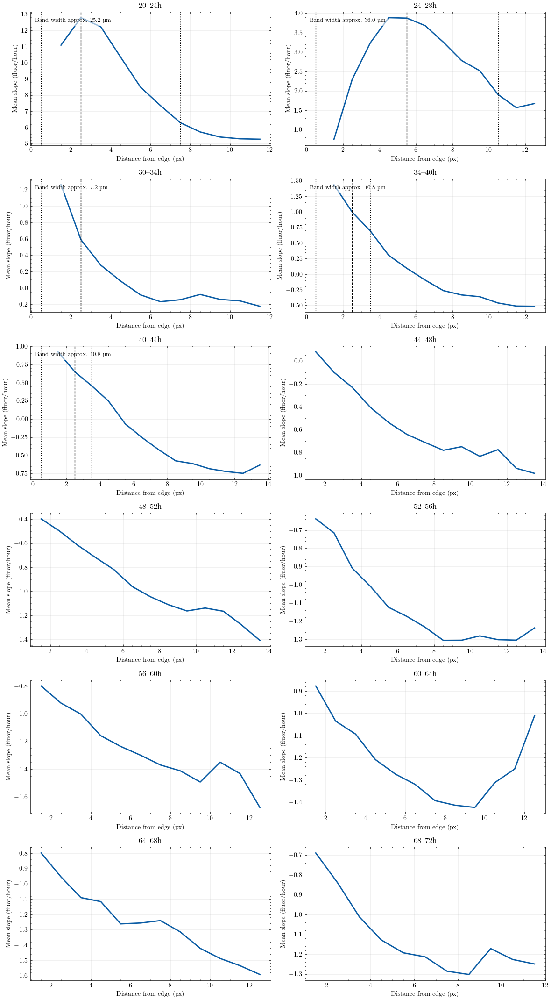

In [259]:
# choose your ROI and windows # Try with roi 237
roi_id  = new_rois_df["ROI"].iloc[5]   # or a specific ROI id
windows = [(20,24), (24,28), (30,34), (34,40), (40,44), (44,48),
           (48,52), (52,56), (56,60), (60,64), (64,68), (68,72)]

# pixel size if you want µm
pixel_um = 3.6  # e.g., if you have 3.6 µm/px, set pixel_um = 3.6

res = radial_profile_growth_band(
    roi_id=roi_id,
    windows=windows,
    corrected_names=corrected_names,
    new_rois_df=new_rois_df,
    agar_mask=agar_mask,                 # True inside agar
    union_mask_bool=union_once,          # union of all colonies
    frame_period_minutes=15.0,
    bin_px=1,                            # 1–3 px works well
    smooth_k=3,                          # moving-average on profile
    contour_margin_px=0,
    pixel_um=pixel_um,
    cmap="turbo",
    alpha=0.75
)


In [260]:
# Calculate the mean band width in pixels
band_widths_px = []
for label, r in res.items():
    pk = r["peak_info"]
    if np.isfinite(pk["width_px"]):
        band_widths_px.append(pk["width_px"])

if band_widths_px:
    mean_band_width_px = np.mean(band_widths_px)
    print(f"Mean band width across windows: {mean_band_width_px:.2f} px")

Mean band width across windows: 5.00 px
